# Libaries


In [9]:
#Libraies for crawler 
import re
import urllib.request as urllib2

# nltk 
import nltk
from nltk.corpus import sentiwordnet as swn
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer

# Libaries for visualizaiton


# Crawler
An Amazon crawler using parser
- S Donnie Darko is a tale of Donnie Darko. Donnie Darko is a good movie, with 8.3 IMDB rating. However, the tale of Donnie Darko. Mostly people feedback on Amazon isn't good movie. 


In [ ]:
class CommentParser:
    def __init__(self, url):
        self.url = url
        self.comment_heading = []
        self.comments = []
        self.reviews = []
        #self.ratings = []

    def scroll_all_the_review_page_and_find_comment(self):
        opener = urllib2.build_opener()
        opener.addheaders = [('User-agent', 'Mozilla/5.0')]

        page_number = 1
        while True:
            previous_comments = len(self.comments)
            html_page = opener.open(self.url + '&pageNumber=' + str(page_number))
            self.calculate_amazon_review_from_review_link(html_page.read().decode('utf-8'))
            if previous_comments == 5:
                break
            page_number = page_number + 1

    def calculate_amazon_comment_product_link(self, html_page_as_string):
        regex_for_review_section = r"<div id=.*data-hook=\"review\".*>.*<\/div>"
        regex_for_review_comment_section = r"<div data-hook=\"review-collapsed\"[^>]+?>(.*?)<\/div>"
        reviews_matches = re.fianditer(regex_for_review_section, html_page_as_string)

        for matchNum, match in enumerate(reviews_matches):
            self.reviews.append(match.group())

            matched_reviews = match.group()

            comments_matches = re.finditer(regex_for_review_comment_section, matched_reviews)
            for match_comment, comment in enumerate(comments_matches):
                self.comments.append(comment)

    def calculate_amazon_review_from_review_link(self, html_page_as_string):
        # https://regex101.com/r/9SY9Ly/1
        regex_for_review_comment_section = r"<span data-hook=\"review-body\"[^>]+?>(.*?)<\/span>"

        comments_matches = re.finditer(regex_for_review_comment_section, html_page_as_string)
        for matchNum, match in enumerate(comments_matches):
            matched_review = match.group(1)
            self.comments.append(matched_review)
            
         # for ratings
    
    #def calculate_amazon_rating_product_link(self, html_page_as_string):
    #    regex_for_review_section = r"<div id=.*data-hook=\"review\".*>.*<\/div>"
    #    regex_for_review_rating_section = r"<div data-hook=\"review-collapsed\"[^>]+?>(.*?)<\/div>"

    #def calculate_amazon_rating_from_review_link(self, html_page_as_string):
    #    regex_for_review_rating_section = r"<span data-hook=\"review-star-rating\"[^>]+?>(.*?)<\/span>"
    #    ratings_matches = re.finditer(regex_for_review_comment_section, html_page_as_string)
    #    for matchNum, match in enumerate(ratings_matches):
    #        matched_review = match.group(1)
    #        self.comments.append(matched_review)



if __name__ == "__main__":
    parser = CommentParser('https://www.amazon.com/Python-Crash-Course-Hands-Project-Based/product-reviews/1593276036/ref=cm_cr_dp_d_show_all_top?ie=UTF8&reviewerType=all_reviews')
    parser.scroll_all_the_review_page_and_find_comment()

    reviews = ""
    for comment in parser.comments:
        print(comment)
        reviews += " " + comment +"\n"

xml_string_file = open('text1.txt', 'w')
xml_string_file.write(reviews+ "\n")
xml_string_file.close()



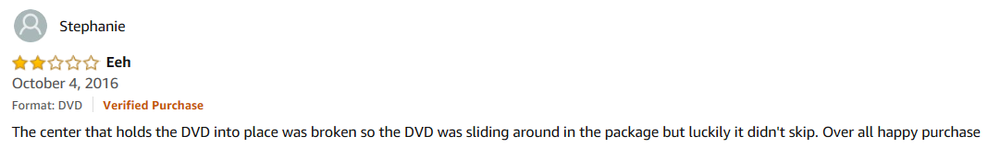!

# Sentiment analysis fuction - using POS tagged 

- On amazon there are just 5 star for custumers to rate the product. However, some fastidious people they generally like the movie, but because of some parts of the movie they don't like, they star it for just 2 star. Otherwise, some easy-going people   overating rating frequently, they star 3 even 4 star for the movie they don't like much. 
- From those reasons above, ratings on amazon about movie might be not reliable. Therefore, in order to rate ratings as neutral people, we use pos (part of speech) tagged to score every comment.   
- After we collect comments, comments will be classified 2 part, negative comments, positive comments.
- In final, to consider for neutral people, is the movie is worth to watch or not. Comments which are collected will be classified one more time using bayersian.

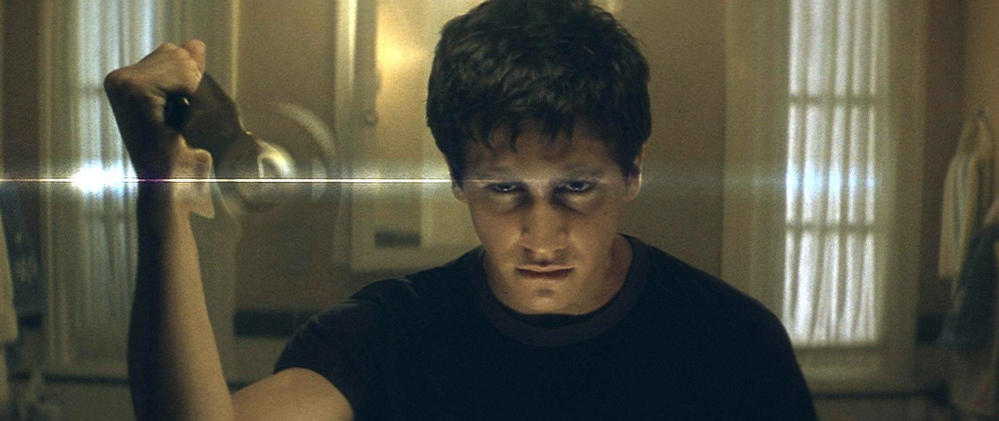

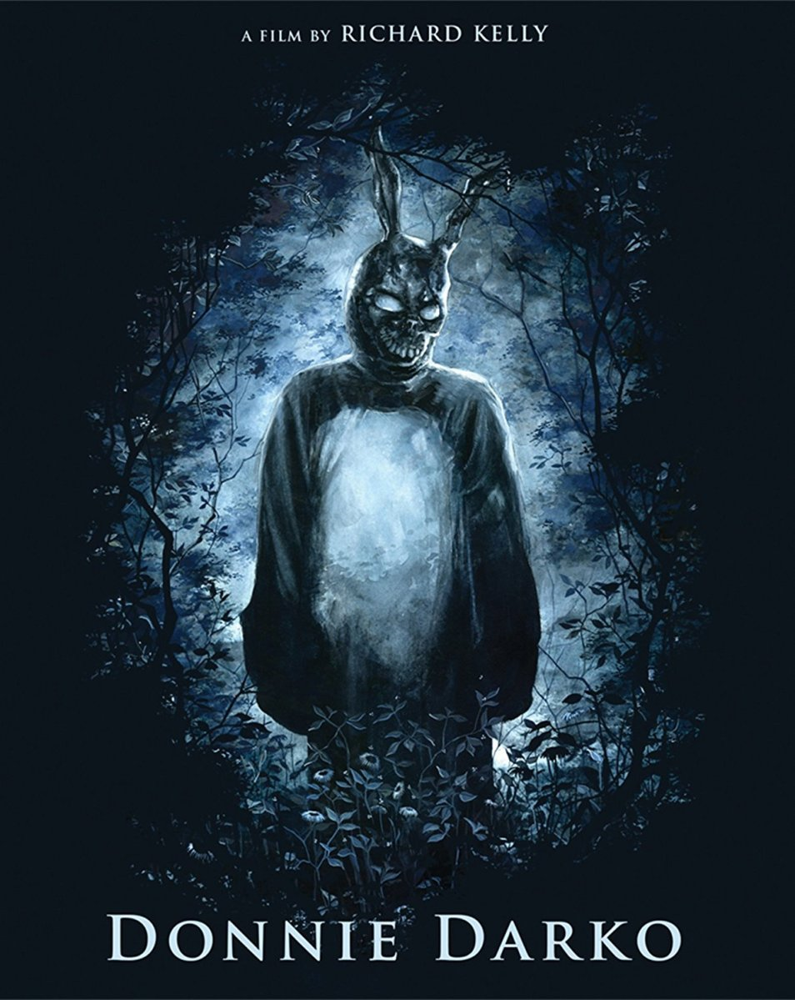

# pos.xml from 
link: 

In [10]:
# sentiment function
def sentiment_analysis(doc):
    sentences = nltk.sent_tokenize(doc)
    print(sentences)
    stokens = [nltk.word_tokenize(sent) for sent in sentences]
    taggedlist = []
    for stoken in stokens:
        taggedlist.append(nltk.pos_tag(stoken))

    print(taggedlist)

    wnl = nltk.WordNetLemmatizer()

    score_list = []

# The enumerate() function adds a counter to an iterable.
    for idx1, taggedsent in enumerate(taggedlist):
        
        score_list.append([])
        for idx2, t in enumerate(taggedsent):
            lemmatized = wnl.lemmatize(t[0])

            if t[1].startswith('NN'):
                newtag = 'n'
            elif t[1].startswith('JJ'):
                newtag = 'a'
            elif t[1].startswith('V'):
                newtag = 'v'
            elif t[1].startswith('R'):
                newtag = 'r'
            else:
                newtag = ''
                
            if (newtag != ''):
                
                synsets = list(swn.senti_synsets(lemmatized, newtag))
                print("synsets:",synsets)
                # Getting average of all possible sentiments
                score = 0.0
                if (len(synsets) > 0):
                    for syn in synsets:
                        p = syn.pos_score()
                        n = syn.neg_score()
                        print(p)
                        
                        score += p - n
                    score_list[idx1].append(score / len(synsets))

    #print(score_list)
    sentence_sentiment = []

    for score_sent in score_list:
        total = sum([word_score for word_score in score_sent]) / (len(score_sent) + 0.000000000000001 )
        print("total:", total)
        sentence_sentiment.append(total)
    print("Sentiment for each sentence for:" + doc)
    print(sentence_sentiment)
    
    return  sum(sentence_sentiment)/ (len(sentence_sentiment) + 0.000000000000001 )

In [20]:
sentiment_analysis("They don't like us")

["They don't like us"]
[[('They', 'PRP'), ('do', 'VBP'), ("n't", 'RB'), ('like', 'VB'), ('us', 'PRP')]]
synsets: [SentiSynset('make.v.01'), SentiSynset('perform.v.01'), SentiSynset('do.v.03'), SentiSynset('do.v.04'), SentiSynset('cause.v.01'), SentiSynset('practice.v.01'), SentiSynset('suffice.v.01'), SentiSynset('do.v.08'), SentiSynset('act.v.02'), SentiSynset('serve.v.09'), SentiSynset('do.v.11'), SentiSynset('dress.v.16'), SentiSynset('do.v.13')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: []
synsets: [SentiSynset('wish.v.02'), SentiSynset('like.v.02'), SentiSynset('like.v.03'), SentiSynset('like.v.04'), SentiSynset('like.v.05')]
0.125
1.0
0.375
0.375
0.125
total: 0.185576923076923
Sentiment for each sentence for:They don't like us
[0.185576923076923]


0.1855769230769228

# Preprocessing data

In [26]:
def to_xml(key, value):
    return "<" + key + ">" + value + "</" + key + ">"

def make_xml_from_list(word_list) :
    tagger_words = "<words>\n"
    for token in word_list:
        if token[0] == '.':
            tagger_words += "\t" + to_xml('End', '.') + "\n"
        else :
            tagger_words += "\t" + to_xml(token[1], token[0]) + "\n"
    tagger_words += "</words>"

    return tagger_words

apostrophes = {"won't":"will not","can't":"cannot","couldn't":"could not","shouldn't":"should not","shan't":"shall not","'s":" is"}

wnl = nltk.WordNetLemmatizer()

file1 = open("text2.txt")

# Read file content as a stream
line = file1.read()

# Remove URL
result = re.sub(r"http://www\S+", "", line)

# Replace apostrophes with full form
for k, v in apostrophes.items():
    result = result.replace(k, v)

# Filter everything except letters and '.'
result = re.sub('[^A-Za-z.]+', ' ', result)

cachedStopWords = set(stopwords.words("english"))

# expand stopwords list
cachedStopWords.update(('and','I','A','And','This','it','It','These','these','The','the','But','but','Or','or','You','you','My','my','Its'))

# Remove stopwords
result = ' '.join([word for word in result.split() if word not in cachedStopWords])

input_sentences = result.split('.')

words = result.split()

Lem = WordNetLemmatizer()

streaming_words = ""
for r in words:
    r = Lem.lemmatize(r)
    streaming_words += " " + r


# If we want to save data and want to see it
appendFile = open('filteredtext.txt','a')
appendFile.write(" "+ streaming_words)
appendFile=open("filteredtext.txt","r").close()


# Generate list of tokens
tokens = word_tokenize(streaming_words)
tokens_pos = nltk.pos_tag(tokens)


# POS tagging
xml_string_pos = make_xml_from_list(tokens_pos)


# If we want to save tagged data and want to see it
xml_string_file = open('pos.xml', 'w')
xml_string_file.write(xml_string_pos)
xml_string_file.close()


# Count frequent Nouns
s = []

for token in tokens_pos:
    if token[1] == "NN" or token[1] == "NNS" or token[1] == "NNP":
        s.append(token[0])
# print(s)

d = {}
for w in s:
    if w in d:
        d[w] += 1
    else:
        d[w] = 1

lst = [(d[w],w) for w in d]
lst.sort()
lst.reverse()


#print('\n The 20 most frequent nouns are /n')
#i = 1
#for count, word in lst[:20]:
#    print('%2s. %4s %s' %(i, count, word))
#    i += 1

movie_character = ["Donnie", "Samantha", "Jack", "Kelly"]

frequent_character = []

for token in tokens_pos:
    if token[1] == "NN" or token[1] == "NNS" or token[1] == "NNP":
        if token[0] in movie_character:
            frequent_character.append(token[0])

            
print(frequent_character)

character_counts = {}

for f_character in frequent_character:
    if f_character in character_counts:
        character_counts[f_character] += 1
    else:
        character_counts[f_character] = 1


print(character_counts)

lst1 = [(character_counts[wd], wd) for wd in character_counts]
lst1.sort()
lst1.reverse()


def word_in_sentence(word, sentence):
    if word in sentence.split():
        return True
    return False

i = 1

related_sentence = {}

print('\n The 10 most mentioned characters are :')

for count, word in lst1[:10]:
    sentence_list = [];

    for sentence in input_sentences:
        if word_in_sentence(word, sentence):
            sentence_list.append(sentence)
    related_sentence[word] = sentence_list

    print('%2s. %4s %s' %(i, count, word))
    i += 1


def get_doc_from_list(list):
    return ".".join(list)


x = []
y = []

def calculate_sentiment_result():
    sentiment_score = {}
    total_score = 0.0

    for character, sentence in related_sentence.items():
        sentiment_result = sentiment_analysis(get_doc_from_list(sentence))
        sentiment_score[character] = sentiment_result
        print(character, "   >>>  ", sentiment_result,"\n")
        total_score += sentiment_result

    s = []

    for character, score in sentiment_score.items():
        score = score/total_score
        s.append(score)
        s.sort()
        sf = s[0] - 0.01
        sl = s[-1] + 0.01      
        score = (9.0 / (sl - sf) * (score - sf)) + 1.0
        print(character, "got", (round(score, 1)), "/10 point(s)")
        if (round(score, 1)) < 2: 
            print("The character is terrible!")
        elif (round(score, 1)) < 4:
            print("The character is so bad!")
        elif (round(score, 1)) < 6:
            print("The character is normal!")
        elif (round(score, 1)) < 8:
            print("The character is good!")
        else: print("The character is great!")
        print("--------------------------------------")
        x.append(character)
        y.append(score)


# Sentiment analysis
calculate_sentiment_result()

['Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Donnie', 'Kelly', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Kelly', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Kelly', 'Kelly', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', 'Donnie', '

[[('AM', 'NNP'), ('Donnie', 'NNP'), ('Darko', 'NNP'), ('Disc', 'NNP'), ('Limited', 'NNP'), ('Edition', 'NNP'), ('amazing', 'VBG'), ('example', 'NN'), ('limited', 'JJ'), ('edition', 'NN'), ('executed', 'VBN'), ('.', '.')], [('read', 'VB'), ('Donnie', 'NNP'), ('Darko', 'NNP'), ('book', 'NN'), ('long', 'RB'), ('interview', 'NN'), ('really', 'RB'), ('found', 'VBD'), ('quite', 'RB'), ('compelling', 'JJ'), ('.', '.')], [('Donnie', 'NNP'), ('Darko', 'NNP'), ('unusual', 'JJ'), ('film', 'NN'), ('fantastic', 'JJ'), ('musical', 'JJ'), ('score', 'NN'), ('plot', 'NN'), ('makes', 'VBZ'), ('one', 'CD'), ('kind', 'NN'), ('masterpiece', 'NN'), ('.', '.')], [('Donnie', 'NNP'), ('Darko', 'NNP'), ('touches', 'NNS'), ('emotions', 'NNS'), ('feel', 'VBP'), ('good', 'JJ'), ('kind', 'NN'), ('movie', 'NN'), ('overall', 'NN'), ('.', '.')], [('If', 'IN'), ('looking', 'VBG'), ('something', 'NN'), ('unique', 'JJ'), ('Donnie', 'NNP'), ('Darko', 'NNP'), ('you', 'PRP'), ('.', '.')], [('Donnie', 'NNP'), ('Darko', 'NNP'

synsets: [SentiSynset('nice.a.01'), SentiSynset('decent.s.01'), SentiSynset('nice.s.03'), SentiSynset('dainty.s.04'), SentiSynset('courteous.s.01')]
0.875
0.875
0.75
0.0
0.75
synsets: [SentiSynset('supernumerary.n.02'), SentiSynset('extra.n.02'), SentiSynset('extra.n.03')]
0.0
0.0
0.25
synsets: [SentiSynset('love.n.01'), SentiSynset('love.n.02'), SentiSynset('beloved.n.01'), SentiSynset('love.n.04'), SentiSynset('love.n.05'), SentiSynset('sexual_love.n.02')]
0.625
0.375
0.125
0.25
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('much.r.01'), SentiSynset('much.r.02'), SentiSynset('a_lot.r.01'), SentiSynset('much.r.04'), SentiSynset('much.r.05')]
0.125
0.125
0.25
0.125
0.375
synsets: [SentiSynset('not.r.01')]
0.0
synsets: [SentiSynset('recommend.v.01'), SentiSynset('commend.v.04'), SentiSynset('recommend.v.03')]
0.0
0.5
0.375
synsets: [SentiSynset('phonograph_record.n.01'), SentiSynset('disk.n.01'), SentiSynset('magnetic_disk.n.01'), SentiSynset('disk.n.02')]
0.0
0.0
0.0
0.0
synset

synsets: []
synsets: [SentiSynset('multiple_sclerosis.n.01'), SentiSynset('mississippi.n.02'), SentiSynset('master_of_science.n.01'), SentiSynset('manuscript.n.01'), SentiSynset('ms.n.05'), SentiSynset('meter.n.01'), SentiSynset('molarity.n.01'), SentiSynset('thousand.n.01'), SentiSynset('megabyte.n.01'), SentiSynset('megabyte.n.02'), SentiSynset('m.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('coerce.v.01'), SentiSynset('impel.v.01'), SentiSynset('push.v.01'), SentiSynset('force.v.04'), SentiSynset('wedge.v.02'), SentiSynset('force.v.06'), SentiSynset('pull.v.01'), SentiSynset('force.v.08'), SentiSynset('storm.v.02')]
0.375
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('new.a.01'), SentiSynset('fresh.s.04'), SentiSynset('raw.s.12'), SentiSynset('new.s.04'), SentiSynset('new.s.05'), SentiSynset('new.a.06'), SentiSynset('newfangled.s.01'), SentiSynset('new.s.08'), SentiSynset('modern.s.05'), SentiSynset('new.s.10'), SentiSynset('new.s.1

0.0
0.0
synsets: [SentiSynset('tall.a.01'), SentiSynset('grandiloquent.s.01'), SentiSynset('tall.s.03'), SentiSynset('improbable.s.03')]
0.5
0.375
0.125
0.25
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('end.n.01'), SentiSynset('end.n.02'), SentiSynset('end.n.03'), SentiSynset('goal.n.01'), SentiSynset('end.n.05'), SentiSynset('end.n.06'), SentiSynset('end.n.07'), SentiSynset('end.n.08'), SentiSynset('end.n.09'), SentiSynset('end.n.10'), SentiSynset('end.n.11'), SentiSynset('conclusion.n.08'), SentiSynset('end.n.13'), SentiSynset('end.n.14')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('fran

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('way.n.05'), SentiSynset('path.n.02'), SentiSynset('path.n.03'), SentiSynset('path.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('life.n.01'), SentiSynset('life.n.02'), SentiSynset('life.n.03'), SentiSynset('animation.n.01'), SentiSynset('life.n.05'), SentiSynset('life.n.06'), SentiSynset('life.n.07'), SentiSynset('life.n.08'), SentiSynset('liveliness.n.02'), SentiSynset('life.n.10'), SentiSynset('life.n.11'), SentiSynset('biography.n.01'), SentiSynset('life.n.13'), SentiSynset('life_sentence.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('watch.v.01'), SentiSynset('watch.v.02'), SentiSynset('watch.v.03'), SentiSynset('watch.v.04'), SentiSynset('watch.v.05'), SentiSynset('watch.v.06'), SentiSynset('determine.v.08')]
0.125
0.375
0.0
0.0
0.375
0.0
0.0
synsets: []
synsets: [SentiSynset('agape.n.01'), SentiSynset('agape.n.02'), SentiSynset('agape.n.03')]
0.5
0.5
0.0
synsets: [S

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('know.v.01'), SentiSynset('know.v.02'), SentiSynset('know.v.03'), SentiSynset('know.v.04'), SentiSynset('know.v.05'), SentiSynset('acknowledge.v.06'), SentiSynset('know.v.07'), SentiSynset('sleep_together.v.01'), SentiSynset('know.v.09'), SentiSynset('know.v.10'), SentiSynset('know.v.11')]
0.0
0.0
0.125
0.0
0.0
0.0
0.125
0.375
0.375
0.25
0.25
synsets: []
synsets: [SentiSynset('highly.r.01'), SentiSynset('highly.r.02'), SentiSynset('highly.r.03')]
0.625
0.5
0.375
synsets: [SentiSynset('intelligent.a.01'), SentiSynset('intelligent.s.02'), SentiSynset('healthy.s.04'), SentiSynset('intelligent.s.04')]
0.25
0.125
0.75
0.25
synsets: []
synsets: [SentiSynset('script.v.01')]
0.0
synsets: [SentiSynset('never.r.01'), SentiSynset('never.r.02')]
0.0
0.125
synsets: [SentiSynset('truly.r.01'), SentiSynset('actually.r.01'), SentiSynset('in_truth.r.01'), SentiSynset('very.r.01')]
0.625
0.375
0.5
0.25
synsets: [SentiSynset('uncover.v.01'), S

synsets: [SentiSynset('noah.n.01')]
0.0
synsets: []
synsets: [SentiSynset('drew.n.01')]
0.0
synsets: [SentiSynset('barrymore.n.01'), SentiSynset('barrymore.n.02'), SentiSynset('barrymore.n.03'), SentiSynset('barrymore.n.04'), SentiSynset('barrymore.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('progressive.a.01'), SentiSynset('progressive.s.02'), SentiSynset('progressive.a.03'), SentiSynset('progressive.s.04'), SentiSynset('progressive.s.05'), SentiSynset('progressive.s.06')]
0.625
0.0
0.0
0.0
0.625
0.0
synsets: [SentiSynset('english.n.01'), SentiSynset('english.n.02'), SentiSynset('english.n.03'), SentiSynset('english.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('science.n.01'), SentiSynset('skill.n.02')]
0.0
0.125
synsets: [SentiSynset('teacher.n.01'), SentiSynset('teacher.n.02')]
0.0
0.125
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('real.a.01'), SentiSynset('real.a.02'), SentiSynset('real.s.03'), SentiSynset('real.s.04'), SentiSynset('actual.s.03'), S

0.0
0.0
0.0
0.0
0.0
0.125
0.125
synsets: [SentiSynset('bailey.n.01'), SentiSynset('bailey.n.02'), SentiSynset('bailey.n.03'), SentiSynset('bailey.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('frank.n.01'), SentiSynset('frank.n.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('angel.n.01'), SentiSynset('saint.n.02'), SentiSynset('angel.n.03'), SentiSynset('angel.n.04')]
0.0
0.0
0.0
0.125
synsets: [SentiSynset('alternatively.r.01'), SentiSynset('rather.r.01')]
0.0
0.5
synsets: [SentiSynset('give.v.01'), SentiSynset('yield.v.01'), SentiSynset('give.v.03'), SentiSynset('give.v.04'), SentiSynset('give.v.05'), SentiSynset('hold.v.03'), SentiSynset('give.v.07'), SentiSynset('give.v.08'), SentiSynset('give.v.09'), SentiSynset('give.v.10'), SentiSynset('render.v.04'), SentiSynset('impart.v.01'), SentiSynset('establish.v.05'), SentiSynset('give.v.14'), SentiSynset('give.v.15'), SentiSynset('sacrifice.v.01'), SentiSynset('pass.v.05'), SentiSynset('give.v.18'), SentiSynset('give.v.19'), SentiSynse

0.0
0.375
0.125
0.0
synsets: [SentiSynset('moment.n.01'), SentiSynset('moment.n.02'), SentiSynset('here_and_now.n.01'), SentiSynset('consequence.n.03'), SentiSynset('moment.n.05'), SentiSynset('moment.n.06')]
0.0
0.0
0.0
0.25
0.0
0.0
synsets: [SentiSynset('jet.n.01'), SentiSynset('jet.n.02'), SentiSynset('jet.n.03'), SentiSynset('jet.n.04'), SentiSynset('k.n.07'), SentiSynset('fountain.n.03')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('engine.n.01'), SentiSynset('engine.n.02'), SentiSynset('locomotive.n.01'), SentiSynset('engine.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('clang.n.01'), SentiSynset('crash.n.02'), SentiSynset('crash.n.03'), SentiSynset('crash.n.04'), SentiSynset('crash.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('concluding.s.01'), SentiSynset('final.s.02'), SentiSynset('final.s.03')]
0.0
0.0
0.0
synsets: [SentiSynset('moment.n.01'), SentiSynset('moment.n.02'), SentiSynset('here_and_now.n.01'), SentiSynset('consequence.n.03'), SentiSynset('moment

synsets: [SentiSynset('profanity.n.01')]
0.0
synsets: [SentiSynset('sexual.a.01'), SentiSynset('sexual.a.02'), SentiSynset('intimate.s.04')]
0.375
0.125
0.25
synsets: [SentiSynset('content.n.01'), SentiSynset('message.n.02'), SentiSynset('content.n.03'), SentiSynset('capacity.n.03'), SentiSynset('content.n.05'), SentiSynset('contentedness.n.01'), SentiSynset('subject.n.02')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('target.v.01')]
0.0
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset

synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('complete.v.01'), SentiSynset('finish_up.v.02'), SentiSynset('end.v.01'), SentiSynset('finish.v.04'), SentiSynset('eat_up.v.01'), SentiSynset('finish.v.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('watch.v.01'), SentiSynset('watch.v.02'), SentiSynset('watch.v.03'), SentiSynset('watch.v.04'), SentiSynset('watch.v.05'), SentiSynset('watch.v.06'), SentiSynset('determine.v.08')]
0.125
0.375
0.0
0.0
0.375
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('first.a.01'), SentiSynset('first.s.02'), SentiSynset('inaugural.s.02'), SentiSynset('beginning.s.01'), SentiSynset('first.s.05'), SentiSynset('first.a.06')]
0.0
0.0
0.0
0.0
0.625
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset(

0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('truly.r.01'), SentiSynset('rightfully.r.01'), SentiSynset('sincerely.r.01'), SentiSynset('in_truth.r.01')]
0.625
0.0
0.0
0.5
synsets: [SentiSynset('brilliant.s.01'), SentiSynset('brainy.s.01'), SentiSynset('brilliant.s.03'), SentiSynset('bright.s.02'), SentiSynset('brilliant.s.05'), SentiSynset('bright.s.08')]
0.875
0.5
0.5
0.0
0.375
0.375
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('beautifully.r.01')]
0.375
synsets: [SentiSynset('grim.s.01'), SentiSynset('ghastly.s.01'), SentiSynset('black.s.09'), SentiSynset('dour.s.02'), SentiSynset('gloomy.s.02'), SentiSynset('blue.s.08')]
0.0
0.25
0.0
0.5
0.0
0.0
synsets: []
synsets: [SentiSynset('first.a.01'), SentiSynset('first.s.02'), SentiSynset('inaugural.s.02'), SentiSynset('beginning.s.01'), SentiSynset('first.s.05'

synsets: []
synsets: [SentiSynset('much.n.01')]
0.125
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('case.n.01'), SentiSynset('event.n.02'), SentiSynset('lawsuit.n.01'), SentiSynset('case.n.04'), SentiSynset('case.n.05'), SentiSynset('case.n.06'), SentiSynset('subject.n.06'), SentiSynset('case.n.08'), SentiSynset('case.n.09'), SentiSynset('case.n.10'), SentiSynset('case.n.11'), SentiSynset('case.n.12'), SentiSynset('character.n.05'), SentiSynset('font.n.01'), SentiSynset('sheath.n.02'), SentiSynset('shell.n.08'), SentiSynset('casing.n.03'), SentiSynset('case.n.18'), SentiSynset('case.n.19'), SentiSynset('case.n.20')]
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
0.125
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('try.v.01'), SentiSynset('test.v.01'), SentiSynset('judge.v.05'), SentiSynset('sample.v.01'), SentiSynset('hear.v.03'), SentiSynset('try.v.06'), SentiSynset('try.v.07'), SentiSynset('try.v.08'), SentiSynset('try_on.v.01')]
0.0
0.375
0.0
0.0
0.0
0.0
0.25


0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('george.n.01'), SentiSynset('george.n.02'), SentiSynset('george.n.03'), SentiSynset('george.n.04'), SentiSynset('george.n.05'), SentiSynset('george.n.06'), SentiSynset('george.n.07')]
0.0
0.0
0.0
0.0
0.0
0.125
0.125
synsets: []
synsets: [SentiSynset('get.v.01'), SentiSynset('become.v.01'), SentiSynset('get.v.03'), SentiSynset('receive.v.02'), SentiSynset('arrive.v.01'), SentiSynset('bring.v.04'), SentiSynset('experience.v.03'), SentiSynset('pay_back.v.02'), SentiSynset('have.v.17'), SentiSynset('induce.v.02'), SentiSynset('get.v.11'), SentiSynset('grow.v.08'), SentiSynset('contract.v.04'), SentiSynset('get.v.14'), SentiSynset('make.v.02'), SentiSynset('drive.v.11'), SentiSynset('catch.v.18'), SentiSynset('catch.v.07'), SentiSynset('get.v.19'), SentiSynset('get.v.20'), SentiSynset('get.v.21'), SentiSynset('get.v.22'), SentiSynset('catch.v.21'), SentiSynset('catch.v.22'), SentiSynset('get.v.25'), SentiSynset('scram.v.01'), SentiSynset('

synsets: [SentiSynset('come.v.01'), SentiSynset('arrive.v.01'), SentiSynset('come.v.03'), SentiSynset('come.v.04'), SentiSynset('come.v.05'), SentiSynset('come.v.06'), SentiSynset('issue_forth.v.01'), SentiSynset('hail.v.02'), SentiSynset('come.v.09'), SentiSynset('come.v.10'), SentiSynset('come.v.11'), SentiSynset('fall.v.04'), SentiSynset('come.v.13'), SentiSynset('total.v.01'), SentiSynset('come.v.15'), SentiSynset('come.v.16'), SentiSynset('occur.v.02'), SentiSynset('derive.v.05'), SentiSynset('do.v.04'), SentiSynset('come.v.20'), SentiSynset('come.v.21')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.5
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('frank.n.01'), SentiSynset('frank.n.02')]
0.0
0.0
synsets: [SentiSynset('new.a.01'), SentiSynset('fresh.s.04'), SentiSynset('raw.s.12'), SentiSynset('new.s.04'), SentiSynset('new.s.05'), SentiSynset('new.a.06'), SentiSynset('newfangled.s.01'), SentiSynset('new.s.08'), SentiSynset('modern.s.05'), SentiSynset('new.

0.0
synsets: [SentiSynset('harvey.n.01')]
0.0
synsets: [SentiSynset('stranger.n.01'), SentiSynset('stranger.n.02')]
0.0
0.0
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01'), SentiSynset('even.r.03'), SentiSynset('still.r.04')]
0.0
0.125
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('unusual.a.01'), SentiSynset('strange.a.01'), SentiSynset('unusual.s.03')]
0.125
0.375
0.125
synsets: [SentiSynset('retro.n.01')]
0.125
synsets: [SentiSynset('picture.n.01'), SentiSynset('painting.n.01'), SentiSynset('mental_picture.n.01'), SentiSynset('picture.n.04'), SentiSynset('picture.n.05'), SentiSynset('movie.n.01'), SentiSynset('video.n.01'), SentiSynset('word_picture.n.01'), SentiSynset('picture.n.09'), SentiSynset('photograph.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('wedding.n.01'), SentiSynset('marriage.n.03'), SentiSynset('wedding.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('singer.n.01'), SentiSynset('singer.n.02'), SentiSynset('singer.n.03')]
0

0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('playful.a.01')]
0.625
synsets: [SentiSynset('vandalism.n.01')]
0.0
synsets: [SentiSynset('addition.n.01'), SentiSynset('addition.n.02'), SentiSynset('addition.n.03'), SentiSynset('accession.n.03'), SentiSynset('addition.n.05'), SentiSynset('summation.n.04')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('insurgent.s.01')]
0.0
synsets: [SentiSynset('idea.n.01'), SentiSynset('thinking.n.01'), SentiSynset('thought.n.03'), SentiSynset('opinion.n.01')]
0.125
0.125
0.0
0.0
synsets: [SentiSynset('action.n.01'), SentiSynset('action.n.02'), SentiSynset('military_action.n.01'), SentiSynset('natural_process.n.01'), SentiSynset('action.n.05'), SentiSynset('action.n.06'), SentiSynset('action.n.07'), SentiSynset('legal_action.n.01'), SentiSynset('action.n.09'), SentiSynset('action.n.10')]
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.125
synsets: [SentiSynset('get_down.v.07'), SentiSynset('begin.v.02'), SentiSynset('begin.v.03'), Sen

0.0
0.0
0.0
0.0
synsets: [SentiSynset('bunny.n.01'), SentiSynset('bunny.n.02')]
0.0
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('travel.n.01'), SentiSynset('change_of_location.n.01'), SentiSynset('locomotion.n.02')]
0.0
0.0
0.0
synsets: [SentiSynset('travel.v.01'), SentiSynset('go.v.02'), SentiSynset('go.v.03'), SentiSynset('become.v.01'), SentiSynset('go.v.05'), SentiSynset('run.v.05'), SentiSynset('run.v.03'), SentiSynset('proceed.v.04'), SentiSynset('go.v.09'), SentiSynset('go.v.10'), SentiSynset('sound.v.02'), SentiSynset('function.v.01'), SentiSynset('run_low.v.01'), SentiSynset('move.v.13'), SentiSynset('survive.v.01'), SentiSynset('go.v.16'), SentiSynset('die.v.01')

0.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('believe.v.01'), SentiSynset('think.v.01'), SentiSynset('believe.v.03'), SentiSynset('believe.v.04'), SentiSynset('believe.v.05')]
0.125
0.0
0.375
0.0
0.125
synsets: []
synsets: [SentiSynset('possible.a.01'), SentiSynset('potential.a.01')]
0.5
0.0
synsets: [SentiSynset('honestly.r.01'), SentiSynset('honestly.r.02')]
0.375
0.375
synsets: [SentiSynset('know.v.01'), SentiSynset('know.v.02'), SentiSynset('know.v.03'), SentiSynset('know.v.04'), SentiSynset('know.v.05'), SentiSynset('acknowledge.v.06'), SentiSynset('know.v.07'), SentiSynset('sleep_together.v.01'), SentiSynset('know.v.09'), SentiSynset('know.v.10'), SentiSynset('know.v.11')]
0.0
0.0
0.125
0.0
0.0
0.0
0.125
0.375
0.375
0.25
0.25
synsets: [SentiSynset('nothing.n.01')]
0.25
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('saw.v.01'), Senti

0.25
0.125
synsets: [SentiSynset('topographic_point.n.01'), SentiSynset('place.n.02'), SentiSynset('place.n.03'), SentiSynset('place.n.04'), SentiSynset('stead.n.01'), SentiSynset('place.n.06'), SentiSynset('home.n.01'), SentiSynset('position.n.06'), SentiSynset('position.n.01'), SentiSynset('place.n.10'), SentiSynset('seat.n.01'), SentiSynset('place.n.12'), SentiSynset('place.n.13'), SentiSynset('plaza.n.01'), SentiSynset('place.n.15'), SentiSynset('space.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('card.n.01'), SentiSynset('card.n.02'), SentiSynset('card.n.03'), SentiSynset('card.n.04'), SentiSynset('wag.n.01'), SentiSynset('poster.n.01'), SentiSynset('calling_card.n.02'), SentiSynset('card.n.08'), SentiSynset('menu.n.01'), SentiSynset('batting_order.n.01'), SentiSynset('circuit_board.n.01')]
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('plan.v.03'), SentiSynset('design.v.02'), SentiSynset('design.v.03'), Sent

0.125
0.0
synsets: [SentiSynset('sleepwalk.v.01')]
0.0
synsets: [SentiSynset('frank.n.01'), SentiSynset('frank.n.02')]
0.0
0.0
synsets: [SentiSynset('become.v.01'), SentiSynset('become.v.02'), SentiSynset('become.v.03'), SentiSynset('become.v.04')]
0.0
0.0
0.0
0.125
synsets: [SentiSynset('regular.a.01'), SentiSynset('regular.s.02'), SentiSynset('regular.s.03'), SentiSynset('regular.s.04'), SentiSynset('regular.s.05'), SentiSynset('even.s.05'), SentiSynset('regular.s.07'), SentiSynset('regular.a.08'), SentiSynset('regular.a.09'), SentiSynset('unconstipated.a.01'), SentiSynset('even.s.04'), SentiSynset('regular.s.12'), SentiSynset('regular.s.13')]
0.0
0.375
0.125
0.0
0.125
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('figure.n.01'), SentiSynset('human_body.n.01'), SentiSynset('digit.n.01'), SentiSynset('figure.n.04'), SentiSynset('name.n.04'), SentiSynset('figure.n.06'), SentiSynset('figure.n.07'), SentiSynset('figure.n.08'), SentiSynset('number.n.01'), SentiSynset('trope.n.01

0.125
0.0
0.0
0.0
0.0
0.875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('narrative.n.01'), SentiSynset('story.n.02'), SentiSynset('floor.n.02'), SentiSynset('history.n.02'), SentiSynset('report.n.03'), SentiSynset('fib.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.02'), SentiSynset('appear.v.04'), SentiSynset('seem.v.03'), SentiSynset('seem.v.04')]
0.0
0.125
0.0
0.5
synsets: [SentiSynset('real.a.01'), SentiSynset('real.a.02'), SentiSynset('real.s.03'), SentiSynset('real.s.04'), SentiSynset('actual.s.03'), SentiSynset('real.a.06'), SentiSynset('substantial.a.03'), SentiSynset('real.s.08'), SentiSynset('veridical.s.01')]
0.0
0.125
0.0
0.0
0.25
0.0
0.0
0.0
0.375
synsets: [SentiSynset('near.r.01'), SentiSynset('close.r.02')]
0.0
0.375
synsets: [SentiSynset('home.n.01'), SentiSynset('dwelling.n.01'), SentiSynset('home.n.03'), SentiSynset('home_plate.n.01'), SentiSynset('base.n.14'), SentiSynset('home.n.06'), SentiSynset

0.0
0.0
0.0
synsets: [SentiSynset('cut.n.01'), SentiSynset('cut.n.02'), SentiSynset('cut.n.03'), SentiSynset('cut.n.04'), SentiSynset('cut.n.05'), SentiSynset('cut.n.06'), SentiSynset('stinger.n.02'), SentiSynset('cut.n.08'), SentiSynset('deletion.n.03'), SentiSynset('cut.n.10'), SentiSynset('cut.n.11'), SentiSynset('snub.n.02'), SentiSynset('baseball_swing.n.01'), SentiSynset('cut.n.14'), SentiSynset('cut.n.15'), SentiSynset('cut.n.16'), SentiSynset('cut.n.17'), SentiSynset('cut.n.18'), SentiSynset('cut.n.19'), SentiSynset('cut.n.20')]
0.0
0.0
0.0
0.0
0.0
0.0
0.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('widen.v.04'), SentiSynset('run.v.03'), SentiSynset('cover.v.03'), SentiSynset('extend.v.04'), SentiSynset('exsert.v.01'), SentiSynset('extend.v.06'), SentiSynset('offer.v.05'), SentiSynset('stretch.v.02'), SentiSynset('extend.v.09'), SentiSynset('prolong.v.01'), SentiSynset('unfold.v.03'), SentiSynset('gallop.v.03'), SentiSynset('extend.v.13'), Sen

0.0
0.0
0.875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('clock.n.01')]
0.0
synsets: [SentiSynset('start.n.01'), SentiSynset('beginning.n.02'), SentiSynset('start.n.03'), SentiSynset('startle.n.01'), SentiSynset('beginning.n.05'), SentiSynset('start.n.06'), SentiSynset('starting_signal.n.01'), SentiSynset('start.n.08')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('click.v.02'), SentiSynset('tick.v.02'), SentiSynset('tick.v.03'), SentiSynset('check.v.06')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('salvage.v.01'), SentiSynset('save.v.02'), Senti

0.0
0.0
0.0
0.0
synsets: [SentiSynset('company.n.04')]
0.0
synsets: [SentiSynset('name.v.01'), SentiSynset('call.v.02'), SentiSynset('call.v.03'), SentiSynset('shout.v.02'), SentiSynset('call.v.05'), SentiSynset('visit.v.03'), SentiSynset('call.v.07'), SentiSynset('call.v.08'), SentiSynset('call.v.09'), SentiSynset('call.v.10'), SentiSynset('call.v.11'), SentiSynset('address.v.06'), SentiSynset('call.v.13'), SentiSynset('call.v.14'), SentiSynset('bid.v.04'), SentiSynset('call.v.16'), SentiSynset('call.v.17'), SentiSynset('predict.v.01'), SentiSynset('call.v.19'), SentiSynset('call.v.20'), SentiSynset('call.v.21'), SentiSynset('call.v.22'), SentiSynset('call.v.23'), SentiSynset('call.v.24'), SentiSynset('call.v.25'), SentiSynset('call.v.26'), SentiSynset('call.v.27'), SentiSynset('call.v.28')]
0.25
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.25
0.0
0.0
0.0
0.0
0.0
0.125
0.375
0.0
synsets: [SentiSynset('sparkle.n.01'), SentiSynset('glitter.n.02'), SentiS

0.0
0.0
0.0
0.0
0.0
0.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('explain.v.01'), SentiSynset('explain.v.02'), SentiSynset('excuse.v.03')]
0.25
0.0
0.0
synsets: [SentiSynset('much.r.01'), SentiSynset('much.r.02'), SentiSynset('a_lot.r.01'), SentiSynset('much.r.04'), SentiSynset('much.r.05')]
0.125
0.125
0.25
0.125
0.375
synsets: [SentiSynset('narrative.n.01'), SentiSynset('story.n.02'), SentiSynset('floor.n.02'), SentiSynset('history.n.02'), SentiSynset('report.n.03'), SentiSynset('fib.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('machinist.n.01'), SentiSynset('automobile_mechanic.n.01')]
0.0
0.0
synsets: [SentiSynset('happen.v.01'), SentiSynset('happen.v.02'), SentiSynset('happen.v.03'), SentiSynset('happen.v.04'), SentiSynset('find.v.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('world.n.03'), SentiSynset('reality.n.02'), SentiSynset('reality.n.03'), SentiSynset('reality.n.04')]
0.0
0.125
0.125
0.375
synsets: [SentiSynset('s

0.0
0.0
0.0
0.0
0.75
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('least.a.01')]
0.0
synsets: [SentiSynset('heard.s.01')]
0.125
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('be.v.01'), SentiSynset('be.v.02'), SentiSynset('be.v.03'), SentiSynset('exist.v.01'), SentiSynset('be.v.05'), SentiSynset('equal.v.01'), SentiSynset('constitute.v.01'), SentiSynset('be.v.08'), SentiSynset('embody.v.02'), SentiSynset('be.v.10'), SentiSynset('be.v.11'), SentiSynset('be.v.12'), SentiSynset('cost.v.01')]
0.25
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('truly.r.01'), SentiSynset('actually.r.01'), SentiSynset('in_truth.r.01'), SentiSynset('very.r.01')]
0.625
0.375
0.5
0.25
synsets: [SentiSynset('happen.v.01'), SentiSynset('happen.v.02'), SentiSynset('happen.v.03'), SentiSynset('happen.v.04'), SentiSynset('find.v.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('good.a.01'), SentiSynset('full.s

0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('predetermine.v.01'), SentiSynset('bias.v.02')]
0.0
0.125
synsets: [SentiSynset('truly.r.01'), SentiSynset('actually.r.01'), SentiSynset('in_truth.r.01'), SentiSynset('very.r.01')]
0.625
0.375
0.5
0.25
synsets: [SentiSynset('free.a.01'), SentiSynset('free.a.02'), SentiSynset('complimentary.s.02'), SentiSynset('free.s.04'), SentiSynset('detached.s.06'), SentiSynset('free.a.06'), SentiSynset('spare.s.03'), SentiSynset('barren.s.03'), SentiSynset('free.s.09')]
0.375
0.0
0.0
0.0
0.0
0.0
0.25
0.25
0.0
synsets: []
synsets: [SentiSynset('state.v.01'), SentiSynset('allege.v.01'), SentiSynset('suppose.v.01'), SentiSynset('read.v.02'), SentiSynset('order.v.01'), SentiSynset('pronounce.v.01'), SentiSynset('say.v.07'), SentiSynset('say.v.08'), SentiSynset('say.v.09'), SentiSynset('say.v.10'), SentiSynset('say.v.11')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('manner.n.01'), SentiSynset('means.n.01'), S

0.0
0.0
0.0
synsets: [SentiSynset('jena.n.01')]
0.0
synsets: [SentiSynset('malone.n.01')]
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('ross.n.01'), SentiSynset('ross.n.02'), SentiSynset('ross.n.03'), SentiSynset('ross.n.04'), SentiSynset('ross.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('well.r.03'), SentiSynset('well.r.04'), SentiSynset('well.r.05'), SentiSynset('well.r.06'), SentiSynset('well.r.07'), SentiSynset('well.r.08'), SentiSynset('well.r.09'), SentiSynset('well.r.10'), SentiSynset('well.r.11'), SentiSynset('well.r.12'), SentiSynset('well.r.13')]
0.375
0.125
0.5
0.375
0.0
0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('match.v.01'), SentiSynset('match.v.02'), SentiSynset('match.v.03'), SentiSynset('equal.v.02'), SentiSynset('match.v.05'), SentiSynset('meet.v.06'), SentiSynset('match.v.07'), SentiSynset('pit.v.01'), SentiSynset('match.v.09'), SentiSynset('equal.v.03')]
0.375
0.0
0.0


0.0
0.0
0.125
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('errand.n.01')]
0.0
synsets: [SentiSynset('mystery.n.01'), SentiSynset('mystery.n.02')]
0.25
0.0
synsets: []
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: []
synsets: [SentiSynset('dream.n.01'), SentiSynset('dream.n.02'), SentiSynset('ambition.n.01'), SentiSynset('pipe_dream.n.01'), SentiSynset('dream.n.05'), SentiSynset('dream.n.06')]
0.0
0.375
0.5
0.0
0.125
0.25
synsets: []
synsets: []
synsets: [SentiSynset('weave.v.01'), SentiSynset('weave.v.02'), SentiSynset('waver.v.06'), SentiSynset('weave.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('batch.n.02'), SentiSynset('lot.n.02'), SentiSynset('set.n.05'), SentiSynset('fortune.n.04'), SentiSynset('draw.n.04'), SentiSynset('bunch.n.03'), SentiSynset('lot.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('component.n.01'), 

synsets: [SentiSynset('bicycle.n.01')]
0.0
synsets: [SentiSynset('surprise.v.01'), SentiSynset('surprise.v.02'), SentiSynset('storm.v.05')]
0.125
0.0
0.0
synsets: []
synsets: [SentiSynset('possibly.r.01')]
0.0
synsets: [SentiSynset('pleased.a.01'), SentiSynset('pleased.s.02')]
0.625
0.5
synsets: []
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01'), SentiSynset('even.r.03'), SentiSynset('still.r.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('alive.a.01'), SentiSynset('alive.s.02'), SentiSynset('animated.a.01'), SentiSynset('alive.s.04'), SentiSynset('active.s.08'), SentiSynset('alert.s.03'), SentiSynset('alive.s.07')]
0.125
0.5
0.375
0.25
0.0
0.625
0.5
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: []
synsets: [SentiSynset('therapy.n.01')]
0.0
synsets: []
synsets: [SentiSynset('sleepwalk.v.01')]
0.0
synsets: [SentiSynset('fanciful.s.02')]
0.0
synsets

0.0
0.0
0.0
0.25
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: [SentiSynset('still.n.01'), SentiSynset('hush.n.01'), SentiSynset('still.n.03'), SentiSynset('distillery.n.01')]
0.0
0.375
0.0
0.0
synsets: [SentiSynset('promotional.a.01'), SentiSynset('promotional.a.02')]
0.0
0.0
synsets: [SentiSynset('material.n.01'), SentiSynset('material.n.02'), SentiSynset('fabric.n.01'), SentiSynset('material.n.04'), SentiSynset('material.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('masterpiece.n.01'), SentiSynset('masterpiece.n.02')]
0.125
0.625
synsets: [SentiSynset('actor.n.01'), SentiSynset('actor.n.02')]
0.0
0.0
synsets: [SentiSynset('bear.v.01'), SentiSynset('give_birth.v.01'), SentiSynset('digest.v.03'), SentiSynset('bear.v.04'), SentiSynset('bear.v.05'), SentiSynset('bear.v.06'), SentiSynset('hold.v.11'), SentiS

0.0
synsets: [SentiSynset('marginally.r.01')]
0.25
synsets: []
synsets: [SentiSynset('bizarre.s.01')]
0.0
synsets: [SentiSynset('discovery.n.03'), SentiSynset('discovery.n.01')]
0.625
0.0
synsets: [SentiSynset('cover.v.05'), SentiSynset('consider.v.03'), SentiSynset('deal.v.03'), SentiSynset('cope.v.01'), SentiSynset('distribute.v.01'), SentiSynset('deal.v.06'), SentiSynset('manage.v.02'), SentiSynset('deal.v.08'), SentiSynset('deal.v.09'), SentiSynset('conduct.v.01'), SentiSynset('share.v.04'), SentiSynset('deal.v.12'), SentiSynset('deal.v.13')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('baffled.s.01'), SentiSynset('confused.s.02'), SentiSynset('confused.s.03'), SentiSynset('broken.s.08'), SentiSynset('confused.a.05')]
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('parent.n.01'), SentiSynset('parent.n.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('perplexed.a.01')]
0.0
synsets: [SentiSynset('analyst.n.01'), SentiSynset('analyst.n.02'), SentiSynset('anal

0.0
0.0
0.0
0.125
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('hole.n.01'), SentiSynset('hole.n.02'), SentiSynset('hole.n.03'), SentiSynset('hole.n.04'), SentiSynset('hole.n.05'), SentiSynset('hole.n.06'), SentiSynset('fix.n.01'), SentiSynset('trap.n.06')]
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('about.r.07')]
0.0
synsets: [SentiSynset('quite.r.01'), SentiSynset('quite.r.02'), SentiSynset('quite.r.03'), SentiSynset('quite.r.04')]
0.0
0.25
0.5
0.5
synsets: [SentiSynset('literally.r.01'), SentiSynset('literally.r.02')]
0.0
0.0
synsets: [SentiSynset('distorted.s.02')]
0.125
synsets: [SentiSynset('idea.n.01'), SentiSynset('mind.n.06'), SentiSynset('idea.n.03'), SentiSynset('estimate.n.01'), SentiSynset('theme.n.03')]
0.125
0.0
0.0
0.0
0.125
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset(

0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('feel.n.01'), SentiSynset('spirit.n.02'), SentiSynset('tactile_property.n.01'), SentiSynset('feel.n.04')]
0.125
0.0
0.0
0.375
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('school.n.01'), SentiSynset('school.n.02'), SentiSynset('school.n.03'), SentiSynset('school.n.04'), SentiSynset('school.n.05'), SentiSynset('school.n.06'), SentiSynset('school.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('felt.v.01'), SentiSynset('felt.v.02'), SentiSynset('felt.v.03'), SentiSynset('feel.v.01'), SentiSynset('find.v.05'), SentiSynset('feel.v.03'), SentiSynset('feel.v.04'), SentiSynset('feel.v.05'),

synsets: []
synsets: []
synsets: [SentiSynset('previous.s.01'), SentiSynset('former.s.03'), SentiSynset('previous.s.03')]
0.0
0.0
0.0
synsets: [SentiSynset('version.n.01'), SentiSynset('version.n.02'), SentiSynset('adaptation.n.01'), SentiSynset('translation.n.01'), SentiSynset('interpretation.n.01'), SentiSynset('version.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01'), SentiSynset('even.r.03'), SentiSynset('still.r.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('buy.v.01'), SentiSynset('bribe.v.01'), SentiSynset('buy.v.03'), SentiSynset('buy.v.04'), SentiSynset('buy.v.05')]
0.0
0.0
0.5
0.0
0.125
synsets: []
synsets: []
synsets: [SentiSynset('put.v.01'), SentiSynset('determine.v.03'), SentiSynset('specify.v.02'), SentiSynset('set.v.04'), SentiSynset('set.v.05'), SentiSynset('set.v.06'), SentiSynset('fix.v.12'), SentiSynset('set.v.08'), SentiSynset('set.v.09'), SentiSynset('set.v.10'), SentiSynset('arrange.v.06'), SentiSynset('plant.v.01')

0.0
0.25
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.5
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('function.n.03'), SentiSynset('character.n.04'), SentiSynset('function.n.02'), SentiSynset('role.n.04')]
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('turn.v.07'), SentiSynset('grow.v.02'), SentiSynset('grow.v.03'), SentiSynset('grow.v.04'), SentiSynset('mature.v.01'), SentiSynset('originate.v.01'), SentiSynset('grow.v.07'), SentiSynset('grow.v.08'), SentiSynset('develop.v.14'), SentiSynset('grow.v.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('finally.r.01')]
0.0
synsets: [SentiSynset('least.a.01')]
0.0
synsets: [SentiSynset('accept.v.01'), SentiSynset('accept.v.02'), SentiSynset('accept.v.03'), SentiSynset('accept.v.04'), SentiSynset('accept.v.05'), SentiSynset('bear.v.06'), SentiSynset('accept.v.07'), SentiSynset('accept.v.08'), SentiSynset('accept.v.09'), SentiSynset('take.v.20'), Se

0.0
synsets: [SentiSynset('challenging.s.03'), SentiSynset('intriguing.s.02')]
0.5
0.625
synsets: [SentiSynset('start.n.01'), SentiSynset('beginning.n.02'), SentiSynset('start.n.03'), SentiSynset('startle.n.01'), SentiSynset('beginning.n.05'), SentiSynset('start.n.06'), SentiSynset('starting_signal.n.01'), SentiSynset('start.n.08')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('first.r.01'), SentiSynset('first.r.02'), SentiSynset('first.r.03'), SentiSynset('foremost.r.01')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), SentiSynset('thing.n.10'), SentiSynset('thing.n.11'), SentiSynset('thing.n.12')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.25
0.0
synsets: [SentiSynset('travel.v.01'), SentiSynset('go.v.02'), SentiSynset('go.v.03'), SentiSynse

synsets: [SentiSynset('path.n.04'), SentiSynset('lead.n.03'), SentiSynset('track.n.03'), SentiSynset('racetrack.n.01'), SentiSynset('cut.n.08'), SentiSynset('track.n.06'), SentiSynset('track.n.07'), SentiSynset('track.n.08'), SentiSynset('track.n.09'), SentiSynset('track.n.10'), SentiSynset('track.n.11')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('photography.n.01'), SentiSynset('photography.n.02'), SentiSynset('photography.n.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('poster.n.01'), SentiSynset('bill_poster.n.01'), SentiSynset('post_horse.n.01')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('production.n.01'), SentiSynset('production.n.02'), SentiSynset('product.n.02'), SentiSynset('production.n.04'), SentiSynset('output.n.04'), SentiSynset('production.n.06

0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('pursuit.n.01'), SentiSynset('chase.n.02'), SentiSynset('chase.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('white.a.01'), SentiSynset('white.a.02'), SentiSynset('white.s.03'), SentiSynset('white.s.04'), SentiSynset('white.s.05'), SentiSynset('white.s.06'), SentiSynset('white.s.07'), SentiSynset('blank.s.01'), SentiSynset('white.s.09'), SentiSynset('white.s.10'), SentiSynset('ashen.s.01'), SentiSynset('white.s.12')]
0.0
0.0
0.75
0.375
0.0
0.0
0.75
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('collar.n.01'), SentiSynset('collar.n.02'), SentiSynset('collar.n.03'), SentiSynset('collar.n.04'), SentiSynset('collar.n.05'), SentiSynset('collar.n.06'), SentiSynset('choker.n.03'), SentiSynset('collar.n.08'), SentiSynset('apprehension.n.04')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('ma.n.01')]
0.875
synsets: [SentiSynset('dad.n.01')]
0.0
synsets: [SentiSynset('mary.n.01')]
0.0
synsets: []
synsets: [SentiSynset('sherlock_holm

0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('come.v.01'), SentiSynset('arrive.v.01'), SentiSynset('come.v.03'), SentiSynset('come.v.04'), SentiSynset('come.v.05'), SentiSynset('come.v.06'), SentiSynset('issue_forth.v.01'), SentiSynset('hail.v.02'), SentiSynset('come.v.09'), SentiSynset('come.v.10'), SentiSynset('come.v.11'), SentiSynset('fall.v.04'), SentiSynset('come.v.13'), SentiSynset('total.v.01'), SentiSynset('come.v.15'), SentiSynset('come.v.16'), SentiSynset('occur.v.02'), SentiSynset('derive.v.05'), SentiSynset('do.v.04'), SentiSynset('come.v.20'), SentiSynset('come.v.21')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.5
0.0
0.0
0.0
0.0
synsets: [SentiSynset('near.r.01'), SentiSynset('close.r.02')]
0.0
0.375
synsets: []
synsets: [SentiSynset('make.v.01'), SentiSynset('make.v.02'), SentiSynset('make.v.03'), SentiSynset('induce.v.02'), SentiSynset('cause.v.

synsets: [SentiSynset('newcomer.n.01'), SentiSynset('newcomer.n.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('write.v.01'), SentiSynset('write.v.02'), SentiSynset('publish.v.03'), SentiSynset('write.v.04'), SentiSynset('write.v.05'), SentiSynset('compose.v.02'), SentiSynset('write.v.07'), SentiSynset('write.v.08'), SentiSynset('spell.v.03'), SentiSynset('write.v.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('direct.v.01'), SentiSynset('target.v.01'), SentiSynset('direct.v.03'), SentiSynset('direct.v.04'), SentiSynset('lead.v.01'), SentiSynset('send.v.01'), SentiSynset('aim.v.01'), SentiSynset('conduct.v.02'), SentiSynset('direct.v.09'), SentiSynset('calculate.v.05'), SentiSynset('steer.v.01'), SentiSynset('address.v.03'), SentiSynset('mastermind.v.01')]
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('fox.n.01'), SentiSynset('dodge

0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('think.v.01'), SentiSynset('think.v.02'), SentiSynset('think.v.03'), SentiSynset('remember.v.01'), SentiSynset('think.v.05'), SentiSynset('think.v.06'), SentiSynset('intend.v.01'), SentiSynset('think.v.08'), SentiSynset('think.v.09'), SentiSynset('think.v.10'), SentiSynset('think.v.11'), SentiSynset('think.v.12'), SentiSynset('think.v.13')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.375
0.375
0.75
0.0
synsets: [SentiSynset('arouse.v.01'), SentiSynset('provoke.v.02'), SentiSynset('provoke.v.03'), SentiSynset('harass.v.01')]
0.25
0.0
0.0
0.0
synsets: [SentiSynset('spectacularly.r.01')]
0.25
synsets: [SentiSynset('creative.a.01'), SentiSynset('creative.s.02')]
0.0
0.375
synsets: [SentiSynset('award.n.01'), SentiSynset('award.n.02'), SentiSynset('prize.n.01')]
0.0
0.5
0.0
synsets: [SentiSynset('win.v.01'), SentiSynset('acquire.v.05'), SentiSynset('gain.

synsets: [SentiSynset('know.v.01'), SentiSynset('know.v.02'), SentiSynset('know.v.03'), SentiSynset('know.v.04'), SentiSynset('know.v.05'), SentiSynset('acknowledge.v.06'), SentiSynset('know.v.07'), SentiSynset('sleep_together.v.01'), SentiSynset('know.v.09'), SentiSynset('know.v.10'), SentiSynset('know.v.11')]
0.0
0.0
0.125
0.0
0.0
0.0
0.125
0.375
0.375
0.25
0.25
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('follow.v.01'), SentiSynset('postdate.v.01'), SentiSynset('follow.v.03'), SentiSynset('follow.v.04'), SentiSynset('comply.v.01'), SentiSynset('follow.v.06'), SentiSynset('follow.v.07'), SentiSynset('follow.v.08'), SentiSynset('adopt.v.01'), SentiSynset('follow.v.10'), SentiSynset('take_after.v.02'), SentiSynset('trace.v.01'), Senti

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.125
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), SentiSynset('thing.n.10'), SentiSynset('thing.n.11'), SentiSynset('thing.n.12')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.25
0.0
synsets: [SentiSynset('right.r.01'), SentiSynset('right.r.02'), SentiSynset('right.r.03'), SentiSynset('right.r.04'), SentiSynset('properly.r.01'), SentiSynset('right.r.06'), SentiSynset('right.r.07'), SentiSynset('mighty.r.01'), SentiSynset('justly.r.02'), SentiSynset('correctly.r.01')]
0.25
0.0
0.0
0.0
0.25
0.0
0.0
0.125
0.5
0.25
synsets: [SentiSynset('rescue.v.01'), SentiSynset('rescue.v.02')]
0.5
0.0
synsets: []
synsets: []
synsets: [SentiSynset('choose.v.01'), SentiSynset('choose.v.02'), SentiSynset('choose.v.03')]
0.0
0.0
0.0
synsets: []
syns

synsets: []
synsets: []
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('population.n.01'), SentiSynset('population.n.02'), SentiSynset('population.n.03'), SentiSynset('population.n.04'), SentiSynset('population.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('control.n.01'), SentiSynset('control.n.02'), SentiSynset('control.n.03'), SentiSynset('control_condition.n.01'), SentiSynset('control.n.05'), SentiSynset('dominance.n.02'), SentiSynset('restraint.n.02'), SentiSynset('command.n.06'), SentiSynset('control.n.09'), SentiSynset('control.n.10'), SentiSynset('control.n.11')]
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.25
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('way.n.05'), SentiSynset('path.n.02'), SentiSynset('path.n.03'), SentiSynset('path.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_b

synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('think.v.01'), SentiSynset('think.v.02'), SentiSynset('think.v.03'), SentiSynset('remember.v.01'), SentiSynset('think.v.05'), SentiSynset('think.v.06'), SentiSynset('intend.v.01'), SentiSynset('think.v.08'), SentiSynset('think.v.09'), SentiSynset('think.v.10'), SentiSynset('think.v.11'), SentiSynset('think.v.12'), SentiSynset('think.v.13')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.375
0.375
0.75
0.0
synsets: []
synsets: []
synsets: [SentiSynset('greatest.s.01'), SentiSynset('great.s.01'), SentiSynset('great.s.02'), SentiSynset('great.s.03'), SentiSynset('bang-up.s.01'), SentiSynset('capital.s.03'), SentiSynset('big.s.13')]
0.875
0.0
0.75
0.25
0.875
0.0
0.0
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiS

0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('harvey.n.01')]
0.0
synsets: [SentiSynset('state.v.01'), SentiSynset('tell.v.02'), SentiSynset('tell.v.03'), SentiSynset('order.v.01'), SentiSynset('tell.v.05'), SentiSynset('assure.v.02'), SentiSynset('tell.v.07'), SentiSynset('distinguish.v.01')]
0.0
0.0
0.0
0.0
0.375
0.5
0.0
0.0
synsets: [SentiSynset('adolescent.s.02')]
0.25
synsets: []
synsets: [SentiSynset('mission.n.01'), SentiSynset('mission.n.02'), SentiSynset('mission.n.03'), SentiSynset('mission.n.04'), SentiSynset('deputation.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('salvage.v.01'), SentiSynset('save.v.02'), SentiSynset('save.v.03'), SentiSynset('save.v.04'), SentiSynset('save.v.05'), SentiSynset('save.v.06'), SentiSynset('deliver.v.08'), SentiSynset('spare.v.01'), SentiSynset('save.v.09'), SentiSynset('keep_open.v.01'), SentiSynset

0.0
0.0
synsets: [SentiSynset('frighten.v.01'), SentiSynset('frighten.v.02')]
0.375
0.125
synsets: []
synsets: []
synsets: [SentiSynset('difficult.a.01'), SentiSynset('hard.a.02'), SentiSynset('hard.a.03'), SentiSynset('hard.s.04'), SentiSynset('arduous.s.01'), SentiSynset('unvoiced.a.01'), SentiSynset('hard.a.07'), SentiSynset('hard.a.08'), SentiSynset('intemperate.s.03'), SentiSynset('hard.s.10'), SentiSynset('hard.s.11'), SentiSynset('hard.s.12')]
0.0
0.0
0.0
0.25
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('land.n.04'), SentiSynset('reason.n.01'), SentiSynset('earth.n.02'), SentiSynset('footing.n.02'), SentiSynset('ground.n.05'), SentiSynset('background.n.02'), SentiSynset('land.n.02'), SentiSynset('ground.n.08'), SentiSynset('ground.n.09'), SentiSynset('ground.n.10'), SentiSynset('flat_coat.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bicycle.n.01')]
0.0
synsets: [SentiSynset('far.r.01'), SentiSynset('far.r.02'), SentiSynset('far.r.03'), S

0.0
0.0
0.0
synsets: [SentiSynset('disturb.v.01'), SentiSynset('trouble.v.02'), SentiSynset('perturb.v.01'), SentiSynset('trouble_oneself.v.01'), SentiSynset('trouble.v.05')]
0.25
0.0
0.0
0.0
0.0
synsets: [SentiSynset('probably.r.01'), SentiSynset('credibly.r.01')]
0.0
0.0
synsets: [SentiSynset('paranoid.s.01')]
0.0
synsets: [SentiSynset('schizophrenia.n.01')]
0.375
synsets: [SentiSynset('probably.r.01'), SentiSynset('credibly.r.01')]
0.0
0.0
synsets: [SentiSynset('find.v.01'), SentiSynset('detect.v.01'), SentiSynset('find.v.03'), SentiSynset('determine.v.01'), SentiSynset('find.v.05'), SentiSynset('witness.v.02'), SentiSynset('line_up.v.02'), SentiSynset('discover.v.03'), SentiSynset('discover.v.04'), SentiSynset('find.v.10'), SentiSynset('rule.v.04'), SentiSynset('receive.v.02'), SentiSynset('find.v.13'), SentiSynset('recover.v.01'), SentiSynset('find.v.15'), SentiSynset('find_oneself.v.01')]
0.0
0.0
0.0
0.0
0.125
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []


0.0
synsets: [SentiSynset('use.v.01'), SentiSynset('use.v.02'), SentiSynset('use.v.03'), SentiSynset('use.v.04'), SentiSynset('practice.v.04'), SentiSynset('use.v.06')]
0.0
0.0
0.25
0.0
0.25
0.0
synsets: [SentiSynset('violence.n.01'), SentiSynset('ferocity.n.01'), SentiSynset('violence.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('purportedly.r.01')]
0.0
synsets: [SentiSynset('pointless.a.01'), SentiSynset('otiose.s.01')]
0.0
0.0
synsets: [SentiSynset('part.n.01'), SentiSynset('part.n.02'), SentiSynset('part.n.03'), SentiSynset('part.n.04'), SentiSynset('region.n.01'), SentiSynset('function.n.03'), SentiSynset('character.n.04'), SentiSynset('share.n.01'), SentiSynset('part.n.09'), SentiSynset('part.n.10'), SentiSynset('part.n.11'), SentiSynset('contribution.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('greater.a.01'), SentiSynset('great.s.01'), SentiSynset('great.s.02'), SentiSynset('great.s.03'), SentiSynset('bang-up.s.01'), SentiSynset('capital.s.03'), S

0.0
synsets: [SentiSynset('out.r.01'), SentiSynset('out.r.02'), SentiSynset('away.r.02')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('amaze.v.01'), SentiSynset('perplex.v.01')]
0.0
0.125
synsets: [SentiSynset('occupation.n.01'), SentiSynset('job.n.02'), SentiSynset('job.n.03'), SentiSynset('job.n.04'), SentiSynset('job.n.05'), SentiSynset('job.n.06'), SentiSynset('job.n.07'), SentiSynset('problem.n.01'), SentiSynset('job.n.09'), SentiSynset('job.n.10'), SentiSynset('job.n.11'), SentiSynset('job.n.12'), SentiSynset('caper.n.03')]
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('real.a.01'), SentiSynset('real.a.02'), SentiSynset('real.s.03'), SentiSynset('real.s.04'), SentiSynset('actual.s.03'), SentiSynset('real.a.06'), SentiSynset('substantial.a.03'), SentiSynset('real.s.08'), SentiSynset('veridical.s.01')]
0.0
0.125
0.0
0.0
0.25
0.0
0.0
0.0
0.375
synsets: [SentiSynset('star.n.01'), SentiSynset('ace.n.03'), SentiSynset('star.n.03'), SentiSynset('star.n.04

synsets: []
synsets: []
synsets: [SentiSynset('narrative.n.01'), SentiSynset('story.n.02'), SentiSynset('floor.n.02'), SentiSynset('history.n.02'), SentiSynset('report.n.03'), SentiSynset('fib.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('center.n.01'), SentiSynset('center_field.n.01'), SentiSynset('center.n.03'), SentiSynset('center.n.04'), SentiSynset('kernel.n.03'), SentiSynset('center.n.06'), SentiSynset('center.n.07'), SentiSynset('center.n.08'), SentiSynset('center.n.09'), SentiSynset('center.n.10'), SentiSynset('center.n.11'), SentiSynset('center.n.12'), SentiSynset('center.n.13'), SentiSynset('center.n.14'), SentiSynset('plaza.n.02'), SentiSynset('center.n.16'), SentiSynset('center.n.17'), SentiSynset('center.n.18')]
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('intelligent.a.01'), SentiSynset('intelligent.s.02'), SentiSynset('healthy.s.04'), SentiSynset('intelligent.s.04')]
0.25
0.125
0.75
0.25
synsets: [SentiSynset(

0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.375
0.0
0.0
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: []
synsets: [SentiSynset('end.v.01'), SentiSynset('end.v.02'), SentiSynset('end.v.03'), SentiSynset('end.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('salvage.v.01'), SentiSynset('save.v.02'), SentiSynset('save.v.03'), SentiSynset('save.v.04'), SentiSynset('save.v.05'), SentiSynset('save.v.06'), SentiSynset('deliver.v.08'), SentiSynset('spare.v.01'), SentiSynset('save.v.09'), SentiSynset('keep_open.v.01'), SentiSynset('write.v.08')]
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('life.n.01'), SentiSynset('life.n.02'), SentiSynset('life.n.03'), SentiSynset('animation.n.01'), SentiSynset('life.n.05'), SentiSynset('life.n.06'), SentiSynset('life.n.07'), SentiSynset('life.n.08'), SentiSynset('liveliness.n.02'), SentiSynset('life.n.10'), SentiSynset('life.n.11'), SentiSynset('biography.n.01'), SentiSynset('life.n.13'), SentiSynset('life_sentence.n.01')]
0.0
0.0
0.

0.0
synsets: []
synsets: [SentiSynset('room.n.01'), SentiSynset('room.n.02'), SentiSynset('room.n.03'), SentiSynset('room.n.04')]
0.0
0.0
0.375
0.0
synsets: []
synsets: [SentiSynset('trouble_oneself.v.01'), SentiSynset('annoy.v.01'), SentiSynset('trouble.v.02'), SentiSynset('bother.v.04'), SentiSynset('bother.v.05'), SentiSynset('bother.v.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bully.n.01'), SentiSynset('bully.n.02')]
0.0
0.0
synsets: [SentiSynset('school.n.01'), SentiSynset('school.n.02'), SentiSynset('school.n.03'), SentiSynset('school.n.04'), SentiSynset('school.n.05'), SentiSynset('school.n.06'), SentiSynset('school.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('open.a.01'), SentiSynset('open.a.02'), SentiSynset('exposed.s.01'), SentiSynset('open.s.04'), SentiSynset('open.a.05'), SentiSynset('open.s.06'), SentiSynset('open.s.07'), SentiSynset('assailable.s.01'), SentiSynset('loose.s.09'), SentiSynset('open.s.10'), SentiSynset('open.a.11'), SentiSynset('open

synsets: []
synsets: [SentiSynset('unfair.a.01')]
0.375
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('end.n.01'), SentiSynset('end.n.02'), SentiSynset('end.n.03'), SentiSynset('goal.n.01'), SentiSynset('end.n.05'), SentiSynset('end.n.06'), SentiSynset('end.n.07'), SentiSynset('end.n.08'), SentiSynset('end.n.09'), SentiSynset('end.n.10'), SentiSynset('end.n.11'), SentiSynset('conclusion.n.08'), SentiSynset('end.n.13'), SentiSynset('end.n.14')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('true.a.01'), SentiSynset('true.s.02'), SentiSynset('true.s.03'), SentiSynset('truthful.a.01'), SentiSynset('true.s.05'), SentiSynset('dependable.s.02'), SentiSynset('genuine.s.02'), SentiSynset('true.s.08'), SentiSynset('true.s.09'), SentiSynset('true.s.10'), SentiSynset('on-key.s.01'), SentiSynset('true.s.12')]
0.5
0.125
0.375
0.25
0.5
0.5
0.375
0.0
0.0
0.25
0.5
0.5
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original

0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('recommend.v.01'), SentiSynset('commend.v.04'), SentiSynset('recommend.v.03')]
0.0
0.5
0.375
synsets: []
synsets: [SentiSynset('desire.v.01'), SentiSynset('want.v.02'), SentiSynset('want.v.03'), SentiSynset('want.v.04'), SentiSynset('want.v.05')]
0.25
0.125
0.0
0.0
0.0
synsets: [SentiSynset('taste.n.01'), SentiSynset('preference.n.01'), SentiSynset('taste.n.03'), SentiSynset('taste.n.04'), SentiSynset('taste.n.05'), SentiSynset('taste.n.06'), SentiSynset('taste.n.07')]
0.0
0.375
0.5
0.0
0.0
0.375
0.125
synsets: [SentiSynset('nostalgia.n.01')]
0.0
synsets: [SentiSynset('late.r.01'), SentiSynset('deep.r.02'), SentiSynset('late.r.03'), SentiSynset('recently.r.01')]
0.125
0.0
0.0
0.0
synsets: [SentiSynset('banal.s.01')]
0.0
synsets: []
synsets: [SentiSynset('always.r.01'), SentiSynset('constantly.r.01'), S

0.0
0.0
0.0
synsets: [SentiSynset('extra.s.03')]
0.0
synsets: [SentiSynset('footage.n.01'), SentiSynset('footage.n.02')]
0.0
0.0
synsets: [SentiSynset('whole.a.01'), SentiSynset('whole.a.02'), SentiSynset('unharmed.s.01'), SentiSynset('hale.s.01'), SentiSynset('solid.s.15')]
0.125
0.0
0.0
0.75
0.0
synsets: [SentiSynset('new.a.01'), SentiSynset('fresh.s.04'), SentiSynset('raw.s.12'), SentiSynset('new.s.04'), SentiSynset('new.s.05'), SentiSynset('new.a.06'), SentiSynset('newfangled.s.01'), SentiSynset('new.s.08'), SentiSynset('modern.s.05'), SentiSynset('new.s.10'), SentiSynset('new.s.11')]
0.375
0.375
0.125
0.0
0.0
0.25
0.375
0.0
0.0
0.0
0.0
synsets: [SentiSynset('soundtrack.n.01')]
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: []
synsets: [SentiSynset('male_child.n.01'), SentiSynset('boy.n.02'), SentiSynset('son.n.01'), SentiSynset('boy.n.04')]
0.25
0.0
0.0
0

synsets: [SentiSynset('know.v.01'), SentiSynset('know.v.02'), SentiSynset('know.v.03'), SentiSynset('know.v.04'), SentiSynset('know.v.05'), SentiSynset('acknowledge.v.06'), SentiSynset('know.v.07'), SentiSynset('sleep_together.v.01'), SentiSynset('know.v.09'), SentiSynset('know.v.10'), SentiSynset('know.v.11')]
0.0
0.0
0.125
0.0
0.0
0.0
0.125
0.375
0.375
0.25
0.25
synsets: [SentiSynset('airplane.n.01'), SentiSynset('plane.n.02'), SentiSynset('plane.n.03'), SentiSynset('plane.n.04'), SentiSynset('plane.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('engine.n.01'), SentiSynset('engine.n.02'), SentiSynset('locomotive.n.01'), SentiSynset('engine.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('kill.v.01'), SentiSynset('kill.v.02'), SentiSynset('stamp_out.v.01'), SentiSynset('kill.v.04'), SentiSynset('kill.v.05'), SentiSynset('kill.v.06'), SentiSynset('kill.v.07'), SentiSynset('kill.v.08'), SentiSynset('kill.v.09'), SentiSynset('kill.v.10'), SentiSynset('toss_off.v.02'), SentiSynset('kill.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.625
0.0
0.0
0.0
0.0
synsets: [SentiSynset('message.n.01'), SentiSynset('message.n.02')]
0.0
0.0
synsets: [SentiSynset('seriously.r.01'), SentiSynset('badly.r.01')]
0.25
0.0
synsets: []
synsets: [SentiSynset('get_down.v.07'), SentiSynset('begin.v.02'), SentiSynset('begin.v.03'), SentiSynset('begin.v.04'), SentiSynset('begin.v.05'), SentiSynset('begin.v.06'), SentiSynset('begin.v.07'), SentiSynset('begin.v.08'), SentiSynset('begin.v.09'), SentiSynset('begin.v.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('pay.v.01'), SentiSynset('give.v.05'), SentiSynset('pay_up.v.01'), SentiSynset('yield.v.10'), SentiSynset('pay.v.05'), SentiSynset('give.v.10'), SentiSynset('pay.v.07'), SentiSynset('pay.v.08'), SentiSynset('pay.v.09'), SentiSynset('pay.v.10'), SentiSynset('pay.v.11')]
0.0
0.25
0.0
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.0
synsets: [Senti

0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('shooting.n.01'), SentiSynset('shot.n.02'), SentiSynset('stroke.n.01'), SentiSynset('shot.n.04'), SentiSynset('shot.n.05'), SentiSynset('scene.n.04'), SentiSynset('injection.n.03'), SentiSynset('nip.n.01'), SentiSynset('shot.n.09'), SentiSynset('guess.n.02'), SentiSynset('snapshot.n.01'), SentiSynset('shot.n.12'), SentiSynset('shot.n.13'), SentiSynset('shot.n.14'), SentiSynset('shot.n.15'), SentiSynset('shot.n.16'), SentiSynset('blastoff.n.01')]
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('give.v.01'), SentiSynset('yield.v.01'), SentiSynset('give.v.03'), SentiSynset('give.v.04'), SentiSynset('give.v.05'), SentiSynset('hold.v.03'), SentiSynset('give.v.07'), SentiSynset('give.v.08'), SentiSynset('give.v.09'), SentiSynset('give.v.10'), SentiSynset('re

0.0
0.0
0.0
0.0
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('costume.n.01'), SentiSynset('costume.n.02'), SentiSynset('costume.n.03'), SentiSynset('costume.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('man.n.01'), SentiSynset('serviceman.n.01'), SentiSynset('man.n.03'), SentiSynset('homo.n.02'), SentiSynset('man.n.05'), SentiSynset('man.n.06'), SentiSynset('valet.n.01'), SentiSynset('man.n.08'), SentiSynset('man.n.09'), SentiSynset('man.n.10'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('merely.r.01'), SentiSynset('just.r.04'), SentiSynset('simply.r.03'), SentiSynset('plainly.r.02')]
0.0
0.25
0.75
0.375
synsets: [SentiSynset('frank.n.01'), SentiSynset('frank.n.02')]
0.0
0.0
synsets: [SentiSynset('warn.v.01'), SentiSynset('warn.v.02'), SentiSynset('warn.v.03'), SentiSynset('warn.v.04')]
0.0
0.375
0.0
0.0
synsets: []
synsets: [SentiSynset('un

0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('home.n.01'), SentiSynset('dwelling.n.01'), SentiSynset('home.n.03'), SentiSynset('home_plate.n.01'), SentiSynset('base.n.14'), SentiSynset('home.n.06'), SentiSynset('home.n.07'), SentiSynset('family.n.01'), SentiSynset('home.n.09')]
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
synsets: [SentiSynset('center.n.01'), SentiSynset('middle.n.02'), SentiSynset('middle.n.03'), SentiSynset('middle.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('night.n.01'), SentiSynset('night.n.02'), SentiSynset('night.n.03'), SentiSynset('night.n.04'), SentiSynset('night.n.05'), SentiSynset('night.n.06'), SentiSynset('night.n.07'), SentiSynset('nox.n.01')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), Senti

0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.02'), SentiSynset('appear.v.04'), SentiSynset('seem.v.03'), SentiSynset('seem.v.04')]
0.0
0.125
0.0
0.5
synsets: [SentiSynset('become.v.01'), SentiSynset('become.v.02'), SentiSynset('become.v.03'), SentiSynset('become.v.04')]
0.0
0.0
0.0
0.125
synsets: [SentiSynset('apart.r.01'), SentiSynset('apart.r.02'), SentiSynset('apart.r.03'), SentiSynset('aside.r.05'), SentiSynset('apart.r.05'), SentiSynset('apart.r.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('make.v.01'), SentiSynset('make.v.02'), SentiSynset('make.v.03'), SentiSynset('induce.v.02'), SentiSynset('cause.v.01'), SentiSynset('produce.v.02'), SentiSynset('draw.v.04'), SentiSynset('make.v.08'), SentiSynset(

0.25
0.25
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('position.n.03'), SentiSynset('view.n.02'), SentiSynset('view.n.03'), SentiSynset('view.n.04'), SentiSynset('opinion.n.01'), SentiSynset('opinion.n.02'), SentiSynset('view.n.07'), SentiSynset('scene.n.08'), SentiSynset('horizon.n.02'), SentiSynset('view.n.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('decidedly.r.01')]
0.25
synsets: [SentiSynset('guarantee.n.01'), SentiSynset('guarantee.n.02'), SentiSynset('guarantee.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('love.n.01'), SentiSynset('love.n.02'), SentiSynset('beloved.n.01'), SentiSynset('love.n.04'), SentiSynset('love.n.05'), SentiSynset('sexual_love.n.02')]
0.625
0.375
0.125
0.25
0.0
0.0
synsets: [SentiSynset('hate.n.01')]
0.125
synsets: [SentiSynset('walk.v.01'), SentiSynset('walk.v.02'), SentiSynset('walk.v.03'), SentiSynset('walk.v.04'), SentiSynset('walk.v.05'), SentiSynset('walk.v.06'), SentiSynset('walk.v.07'

synsets: [SentiSynset('genre.n.01'), SentiSynset('writing_style.n.01'), SentiSynset('music_genre.n.01'), SentiSynset('genre.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('switch_over.v.01'), SentiSynset('trade.v.04'), SentiSynset('switch.v.03'), SentiSynset('switch.v.04'), SentiSynset('throw.v.06'), SentiSynset('switch.v.06'), SentiSynset('interchange.v.04')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('quite.r.01'), SentiSynset('quite.r.02'), SentiSynset('quite.r.03'), SentiSynset('quite.r.04')]
0.0
0.25
0.5
0.5
synsets: [SentiSynset('quickly.r.01'), SentiSynset('promptly.r.01'), SentiSynset('cursorily.r.01')]
0.0
0.0
0.0
synsets: [SentiSynset('domestic.a.01'), SentiSynset('domestic.a.02'), SentiSynset('domestic.a.03'), SentiSynset('domestic.s.04'), SentiSynset('domestic.s.05')]
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('play.n.01'), SentiSynset('drama.n.02'), SentiSynset('drama.n.03'), SentiSynset('drama.n.04')]
0.0
0.5
0.0
0.75
synsets: [SentiSynset('black.a.01'), SentiSynse

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('flow.v.01'), SentiSynset('run.v.06'), SentiSynset('flow.v.03'), SentiSynset('flow.v.04'), SentiSynset('hang.v.05'), SentiSynset('flow.v.06'), SentiSynset('menstruate.v.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('much.r.01'), SentiSynset('much.r.02'), SentiSynset('a_lot.r.01'), SentiSynset('much.r.04'), SentiSynset('much.r.05')]
0.125
0.125
0.25
0.125
0.375
synsets: [SentiSynset('better.r.01'), SentiSynset('better.r.02'), SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('well.r.03'), SentiSynset('well.r.04'), SentiSynset('well.r.05'), SentiSynset('well.r.06'), SentiSynset('well.r.07'), SentiSynset('well.r.08'), SentiSynset('well.r.09'), SentiSynset('well.r.10'), SentiSynset('well.r.11'), SentiSynset('well.r.12'), SentiSynset('well.r.13')]
0.875
0.0
0.375
0.125
0.5
0.375
0.0
0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('delete.v.01'), SentiSynset('erase.v.03'), SentiSynset('edit

0.25
0.0
0.25
synsets: [SentiSynset('fit.a.01'), SentiSynset('fit.s.02'), SentiSynset('fit.a.03')]
0.5
0.375
0.75
synsets: [SentiSynset('psychiatrist.n.01')]
0.0
synsets: []
synsets: [SentiSynset('school.n.01'), SentiSynset('school.n.02'), SentiSynset('school.n.03'), SentiSynset('school.n.04'), SentiSynset('school.n.05'), SentiSynset('school.n.06'), SentiSynset('school.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('friend.n.01'), SentiSynset('ally.n.02'), SentiSynset('acquaintance.n.03'), SentiSynset('supporter.n.01'), SentiSynset('friend.n.05')]
0.125
0.25
0.0
0.0
0.0
synsets: [SentiSynset('acquaintance.n.01'), SentiSynset('acquaintance.n.02'), SentiSynset('acquaintance.n.03')]
0.0
0.5
0.0
synsets: [SentiSynset('list.n.01'), SentiSynset('tilt.n.04')]
0.0
0.0
synsets: [SentiSynset('travel.v.01'), SentiSynset('go.v.02'), SentiSynset('go.v.03'), SentiSynset('become.v.01'), SentiSynset('go.v.05'), SentiSynset('run.v.05'), SentiSynset('run.v.03'), SentiSynset('proceed.v.04'), S

synsets: [SentiSynset('bargain.n.02')]
0.5
synsets: [SentiSynset('excellent.s.01')]
1.0
synsets: [SentiSynset('monetary_value.n.01'), SentiSynset('price.n.02'), SentiSynset('price.n.03'), SentiSynset('price.n.04'), SentiSynset('price.n.05'), SentiSynset('price.n.06'), SentiSynset('price.n.07')]
0.0
0.0
0.0
0.625
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('matrix.n.01'), SentiSynset('matrix.n.02'), SentiSynset('matrix.n.03'), SentiSynset('matrix.n.04'), SentiSynset('matrix.n.05'), SentiSynset('matrix.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01'), SentiSynset('even.r.03'), SentiSynset('still.r.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('year.n.01'), SentiSynset('year.n.02'), SentiSynset('year.n.03'), SentiSynset('class.n.06')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('aged.s.01'), SentiSynset('elder.s.01'), SentiSynset('old.s.04'), SentiSynset('old.a.01'), SentiSynset('old.a.02'), SentiSynset('old.s.03'), SentiSynset('old.s.04'), Sent

synsets: []
synsets: [SentiSynset('awaken.v.01'), SentiSynset('wake_up.v.02'), SentiSynset('awaken.v.03')]
0.375
0.0
0.125
synsets: []
synsets: [SentiSynset('in-between.s.01'), SentiSynset('center.s.01'), SentiSynset('middle.a.03'), SentiSynset('middle.a.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('asphalt.n.01'), SentiSynset('asphalt.n.02')]
0.0
0.0
synsets: [SentiSynset('road.n.01'), SentiSynset('road.n.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('mountain.n.01'), SentiSynset('batch.n.02')]
0.0
0.0
synsets: [SentiSynset('side.n.01'), SentiSynset('side.n.02'), SentiSynset('side.n.03'), SentiSynset('side.n.04'), SentiSynset('side.n.05'), SentiSynset('side.n.06'), SentiSynset('side.n.07'), SentiSynset('side.n.08'), SentiSynset('side.n.09'), SentiSynset('side.n.10'), SentiSynset('slope.n.01'), SentiSynset('english.n.04')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('confuse.v.01'), SentiSynset('confuse.v.02'), SentiSynset('confuse.v.03'), SentiSynset('jumble

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
0.125
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('phantasmagoric.s.01'), SentiSynset('dreamlike.s.01')]
0.25
0.25
synsets: [SentiSynset('see.v.05'), SentiSynset('study.v.03'), SentiSynset('consider.v.03'), SentiSynset('consider.v.04'), SentiSynset('consider.v.05'), SentiSynset('think.v.01'), SentiSynset('regard.v.02'), SentiSynset('view.v.02'), SentiSynset('consider.v.09')]
0.125
0.25
0.0
0.125
0.0
0.0
0.125
0.25
0.75
synsets: []
synsets: [SentiSynset('waking.n.01')]
0.0
synsets: [SentiSynset('life.n.01'), SentiSynset('life.n.02'), SentiSynset('life.n.03'), SentiSynset('animation.n.01'), SentiSynset('life.n.05'), SentiSynset('life.n.06'), SentiSynset('life.n.07'), SentiSynset('life.n.08'), SentiSynset('liveliness.n.02'), SentiSynset('life.n.10'), SentiSynset('life.n.11'), SentiSynset('biography.n.01'), SentiSynset('life.n.13'), SentiSynset('life_sentence.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
synsets: [Senti

0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('feel.v.01'), SentiSynset('find.v.05'), SentiSynset('feel.v.03'), SentiSynset('feel.v.04'), SentiSynset('feel.v.05'), SentiSynset('feel.v.06'), SentiSynset('feel.v.07'), SentiSynset('feel.v.08'), SentiSynset('feel.v.09'), SentiSynset('palpate.v.01'), SentiSynset('feel.v.11'), SentiSynset('feel.v.12'), SentiSynset('feel.v.13')]
0.125
0.125
0.0
0.375
0.125
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('isolated.s.01'), SentiSynset('detached.s.02'), SentiSynset('disjunct.s.03'), SentiSynset('isolated.s.04'), SentiSynset('isolated.s.05'), SentiSynset('apart.s.01')]
0.0
0.0
0.0
0.0
0.5
0.5
synsets: [SentiSynset('beginning.n.04'), SentiSynset('source.n.02'), SentiSynset('source.n.03'), SentiSynset('source.n.04'), SentiSynset('informant.n.01'), SentiSynset('generator.n.03'), SentiSynset('source.n.07'), SentiSynset('reservoir.n.04'), SentiSynset('reference.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('comfort.v.01')]
0.

0.0
0.0
0.0
0.0
0.875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('small.a.01'), SentiSynset('little.a.02'), SentiSynset('little.s.03'), SentiSynset('fiddling.s.01'), SentiSynset('little.s.05'), SentiSynset('short.a.03'), SentiSynset('little.s.07'), SentiSynset('little.s.08')]
0.0
0.0
0.0
0.125
0.0
0.125
0.0
0.0
synsets: [SentiSynset('emotional.a.01'), SentiSynset('emotional.a.02'), SentiSynset('emotional.a.03'), SentiSynset('aroused.s.06')]
0.375
0.625
0.375
0.25
synsets: [SentiSynset('allowance.n.01'), SentiSynset('allowance.n.02'), SentiSynset('allowance.n.03'), SentiSynset('allowance.n.04'), SentiSynset('valuation_reserve.n.01'), SentiSynset('allowance.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('fear.n.01'), SentiSynset('concern.n.02'), SentiSynset('fear.n.03')]
0.0
0.125
0.5
synsets: [SentiSynset('love.v.01'), SentiSynset('love.v.02'), SentiSynset('love.v.03'), SentiSynset('sleep_together.v.01')]
0.5
1.0
0.625
0.37

synsets: []
synsets: [SentiSynset('darkly.r.01'), SentiSynset('darkly.r.02')]
0.0
0.125
synsets: [SentiSynset('disturb.v.01'), SentiSynset('trouble.v.02'), SentiSynset('perturb.v.01'), SentiSynset('trouble_oneself.v.01'), SentiSynset('trouble.v.05')]
0.25
0.0
0.0
0.0
0.0
synsets: [SentiSynset('adolescent.s.02')]
0.25
synsets: [SentiSynset('brainsick.s.01'), SentiSynset('crazy.s.02'), SentiSynset('crazy.s.03'), SentiSynset('crazy.s.04'), SentiSynset('crazy.s.05')]
0.0
0.625
0.25
0.0
0.5
synsets: [SentiSynset('genius.n.01'), SentiSynset('brilliance.n.03'), SentiSynset('ace.n.03'), SentiSynset('genius.n.04'), SentiSynset('flair.n.01')]
0.5
0.75
0.125
0.25
0.25
synsets: [SentiSynset('cog.n.01'), SentiSynset('cog.n.02')]
0.0
0.0
synsets: [SentiSynset('cosmopolitan.s.03'), SentiSynset('universal.s.02'), SentiSynset('universal.s.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('power.n.01'), SentiSynset('power.n.02'), SentiSynset('ability.n.02'), SentiSynset('office.n.04'), SentiSynset('po

synsets: [SentiSynset('average.s.01'), SentiSynset('average.s.02'), SentiSynset('average.s.03'), SentiSynset('average.s.04'), SentiSynset('modal.s.01'), SentiSynset('median.s.01')]
0.0
0.375
0.25
0.0
0.0
0.0
synsets: [SentiSynset('everyday.s.01'), SentiSynset('casual.s.03'), SentiSynset('everyday.s.03')]
0.125
0.5
0.375
synsets: [SentiSynset('adolescent.n.01')]
0.0
synsets: [SentiSynset('set.n.01'), SentiSynset('set.n.02'), SentiSynset('set.n.03'), SentiSynset('stage_set.n.01'), SentiSynset('set.n.05'), SentiSynset('bent.n.01'), SentiSynset('set.n.07'), SentiSynset('set.n.08'), SentiSynset('hardening.n.02'), SentiSynset('set.n.10'), SentiSynset('set.n.11'), SentiSynset('set.n.12'), SentiSynset('set.n.13')]
0.125
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('early.a.01'), SentiSynset('early.a.02'), SentiSynset('early.s.03'), SentiSynset('early.s.04'), SentiSynset('early.a.05'), SentiSynset('early.s.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets:

synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: []
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('ever.r.01'), SentiSynset('always.r.01'), SentiSynset('ever.r.03')]
0.0
0.0
0.0
synsets: [SentiSynset('make.v.01'), SentiSynset('make.v.02'), SentiSynset('make.v.03'), SentiSynset('induce.v.02'), SentiSynset('cause.v.01'), SentiSynset('produce.v.02'), SentiSynset('draw.v.04'), SentiSynset('make.v.08'), SentiSynset('create.v.05'), SentiSynset('gain.v.08'), SentiSynset('do.v.08'), SentiSynset('form.v.02'), SentiSynset('reach.v.07'), SentiSynset('make.v.14'), SentiSynset('make.v.15'), SentiSynset('make.v.16'), SentiSynset('construct.v.01'), SentiSynset('make.v.18'), SentiSynset

synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('footage.n.01'), SentiSynset('footage.n.02')]
0.0
0.0
synsets: [SentiSynset('help.v.01'), SentiSynset('help.v.02'), SentiSynset('help.v.03'), SentiSynset('help_oneself.v.01'), SentiSynset('serve.v.05'), SentiSynset('help.v.06'), SentiSynset('avail.v.03'), SentiSynset('help.v.08')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.25
synsets: []
synsets: [SentiSynset('aspect.n.01'), SentiSynset('aspect.n.02'), SentiSynset('view.n.02'), SentiSynset('aspect.n.04'), SentiSynset('expression.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('narrative.n.01'), SentiSynset('story.n.02'), SentiSynset('floor.n.02'), SentiSynset('history.n.02'), SentiSynset('report.n.03'), SentiSynset('fib.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('besides.r.02')]
0.0
synsets: [SentiSynset('open.v.01'), SentiSynset('open.v.02'), SentiSynse

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('necessitate.v.01'), SentiSynset('want.v.02'), SentiSynset('need.v.03')]
0.25
0.125
0.0
synsets: [SentiSynset('dark.n.01'), SentiSynset('iniquity.n.01'), SentiSynset('darkness.n.02'), SentiSynset('night.n.01'), SentiSynset('dark.n.05')]
0.125
0.0
0.0
0.0
0.125
synsets: [SentiSynset('focus_on.v.01'), SentiSynset('concentrate.v.02'), SentiSynset('center.v.03')]
0.0
0.125
0.0
synsets: [SentiSynset('delusional.s.01')]
0.0
synsets: [SentiSynset('mind.n.01'), SentiSynset('mind.n.02'), SentiSynset('judgment.n.01'), SentiSynset('thinker.n.01'), SentiSynset('mind.n.05'), SentiSynset('mind.n.06'), SentiSynset('mind.n.07')]
0.125
0.125
0.0
0.5
0.0
0.0
0.375
synsets: [SentiSynset('set.n.01'), SentiSynset('set.n.02'), SentiSynset('set.n.03'), SentiSynset('stage_set.n.01'), SentiSynset('set.n.05'), SentiSynset('bent.n.01'), SentiSynset('set.n.07'), SentiSynset('set.n.08'), SentiSynset('harden

synsets: [SentiSynset('much.a.01')]
0.0
synsets: [SentiSynset('peasant.n.03'), SentiSynset('goth.n.02')]
0.0
0.0
synsets: [SentiSynset('tinge.v.01'), SentiSynset('tint.v.01'), SentiSynset('ting.v.01'), SentiSynset('ting.v.02')]
0.125
0.0
0.0
0.0
synsets: [SentiSynset('gruel.n.01')]
0.0
synsets: [SentiSynset('bag.v.01'), SentiSynset('bag.v.02'), SentiSynset('bulge.v.02'), SentiSynset('pocket.v.02'), SentiSynset('bag.v.05')]
0.125
0.0
0.0
0.0
0.0
synsets: [SentiSynset('meat.n.01'), SentiSynset('kernel.n.01'), SentiSynset('kernel.n.03')]
0.0
0.0
0.25
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('example.n.01'), SentiSynset('model.n.07'), SentiSynset('exemplar.n.01'), SentiSynset('example.n.04'), SentiSynset('case.n.01'), SentiSynset('exercise.n.04')]
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('frank.n.01'), SentiSynset('frank.n.02')]
0.0
0.0
synse

0.0
synsets: [SentiSynset('submergence.n.01'), SentiSynset('ingress.n.01'), SentiSynset('concentration.n.05'), SentiSynset('immersion.n.04'), SentiSynset('submersion.n.02')]
0.0
0.0
0.25
0.0
0.0
synsets: [SentiSynset('environment.n.02')]
0.0
synsets: [SentiSynset('channel.n.01'), SentiSynset('channel.n.02'), SentiSynset('groove.n.01'), SentiSynset('channel.n.04'), SentiSynset('channel.n.05'), SentiSynset('duct.n.01'), SentiSynset('channel.n.07'), SentiSynset('distribution_channel.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('special.n.01'), SentiSynset('special.n.02'), SentiSynset('special.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('feature.n.01'), SentiSynset('feature.n.02'), SentiSynset('feature.n.03'), SentiSynset('feature.n.04'), SentiSynset('feature_of_speech.n.01'), SentiSynset('feature.n.06')]
0.0
0.0
0.

0.0
0.0
0.375
0.0
0.0
0.25
0.0
0.375
synsets: [SentiSynset('least.a.01')]
0.0
synsets: [SentiSynset('about.r.07')]
0.0
synsets: [SentiSynset('lax.s.01'), SentiSynset('lax.a.02'), SentiSynset('lax.a.03'), SentiSynset('lax.s.04')]
0.125
0.0
0.125
0.0
synsets: [SentiSynset('parental.a.01'), SentiSynset('parental.a.02')]
0.0
0.0
synsets: [SentiSynset('authority.n.01'), SentiSynset('authority.n.02'), SentiSynset('authority.n.03'), SentiSynset('assurance.n.01'), SentiSynset('agency.n.01'), SentiSynset('authority.n.06'), SentiSynset('authority.n.07')]
0.0
0.0
0.125
0.0
0.0
0.125
0.0
synsets: []
synsets: [SentiSynset('state.v.01'), SentiSynset('tell.v.02'), SentiSynset('tell.v.03'), SentiSynset('order.v.01'), SentiSynset('tell.v.05'), SentiSynset('assure.v.02'), SentiSynset('tell.v.07'), SentiSynset('distinguish.v.01')]
0.0
0.0
0.0
0.0
0.375
0.5
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('butt.n.01'), SentiSynset('butt.n.02'), SentiSynset('butt.n.03'), SentiSynset('butto

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('magnify.v.01'), SentiSynset('overstate.v.01'), SentiSynset('inflate.v.01'), SentiSynset('amplify.v.04')]
0.0
0.625
0.125
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('alternately.r.01')]
0.0
synsets: [SentiSynset('perplex.v.01'), SentiSynset('puzzle.v.02')]
0.125
0.0
synsets: [SentiSynset('beguiled.s.01')]
0.0
synsets: [SentiSynset('moviegoer.n.01')]
0.0
synsets: [SentiSynset('scene.n.01'), SentiSynset('scene.n.02'), SentiSynset('view.n.02'), SentiSynset('scene.n.04'), SentiSynset('picture.n.04'), SentiSynset('scene.n.06'), SentiSynset('fit.n.01'), SentiSynset('scene.n.08'), SentiSynset('setting.n.01'), SentiSynset('scenery.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.01'), SentiSynset('look.v.02'), SentiSynset('look.v.0

synsets: [SentiSynset('first.r.01'), SentiSynset('first.r.02'), SentiSynset('first.r.03'), SentiSynset('foremost.r.01')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('let_go_of.v.01'), SentiSynset('free.v.01'), SentiSynset('turn.v.08'), SentiSynset('publish.v.02'), SentiSynset('exhaust.v.05'), SentiSynset('secrete.v.01'), SentiSynset('free.v.05'), SentiSynset('release.v.08'), SentiSynset('release.v.09'), SentiSynset('unblock.v.03')]
0.0
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('interaction.n.01'), SentiSynset('interaction.n.02')]
0.0
0.0
synsets: [SentiSynset('member.n.01'), SentiSynset('member.n.02'), SentiSynset('extremity.n.01'), SentiSynset('member.n.04'), SentiSynset('penis.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('family.n.01'), SentiSynset('family.n.02'), SentiSynset('class.n.01'), SentiSynset('family.n.04'), SentiSynset('kin.n.01'), SentiSynset('family.n.06'), SentiSynset('syndicate.n.01'), SentiSynset('family.n.08')]
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.125
0.0
synsets: []
synsets: []
synsets: [SentiSynset('already.r.01')]
0.125
synsets: [SentiSynset('videodisk.n.01')]
0.0
synsets: [SentiSynset('nothing.n.01')]
0.25
synsets: [SentiSynset('appendix.n.01'), SentiSynset('appendix.n.02')]
0.0
0.0
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: []
synsets: []
synsets: [SentiSynset('face-to-face.r.02')]
0.0
synsets: [SentiSynset('scenario.n.01'), SentiSynset('scenario.n.02'), SentiSynset('scenario.n.03')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('quantum.n.01'), SentiSynset('quantum.n.02')]
0.0
0.0
synsets: [SentiSynset('purgative.n.01')]
0.25
synsets: [SentiSynset('help.v.01'), SentiSynset('help.v.02')]
0.0
0.0
synsets: [SentiSynset('science.n.01'), SentiSynset('skill.n.02')]
0.0
0.125
synsets: []
synsets: [SentiSynset('street.n.01'), SentiSynset('street.n.02'), SentiSynset('street.n.03'), SentiSyns

synsets: [SentiSynset('greatest.s.01'), SentiSynset('great.s.01'), SentiSynset('great.s.02'), SentiSynset('great.s.03'), SentiSynset('bang-up.s.01'), SentiSynset('capital.s.03'), SentiSynset('big.s.13')]
0.875
0.0
0.75
0.25
0.875
0.0
0.0
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('establish.v.08'), SentiSynset('base.v.02'), SentiSynset('free-base.v.01')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('flicker.v.03'), SentiSynset('flick.v.02'), SentiSynset('flip.v.05'), SentiSynset('jerk.v.05'), SentiSynset('flicker.v.02'), SentiSynset('flick.v.06'), SentiSynset('snap.v.10'), SentiSynset('flick.v.08'), SentiSynset('flick.v.09')]
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0

0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('occupation.n.01'), SentiSynset('job.n.02'), SentiSynset('job.n.03'), SentiSynset('job.n.04'), SentiSynset('job.n.05'), SentiSynset('job.n.06'), SentiSynset('job.n.07'), SentiSynset('problem.n.01'), SentiSynset('job.n.09'), SentiSynset('job.n.10'), SentiSynset('job.n.11'), SentiSynset('job.n.12'), SentiSynset('caper.n.03')]
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('make.v.01'), SentiSynset('perform.v.01'), SentiSynset('do.v.03'), SentiSynset('do.v.04'), SentiSynset('cause.v.01'), SentiSynset('practice.v.01'), SentiSynset('suffice.v.01'), SentiSynset('do.v.08'), SentiSynset('act.v.02'), SentiSynset('serve.v.09'), SentiSynset('do.v.11'), SentiSynset('dress.v.16'), SentiSynset('do.v.13')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('play.n.01'), SentiSynset('play.n.02'), SentiSynset('

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('edition.n.01'), SentiSynset('edition.n.02'), SentiSynset('edition.n.03'), SentiSynset('version.n.02')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('fracture.v.01'), SentiSynset('fracture.v.02'), SentiSynset('fracture.v.03'), SentiSynset('fracture.v.04'), SentiSynset('fracture.v.05'), SentiSynset('fracture.v.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('greater.a.01'), SentiSynset('great.s.01'), SentiSynset('great.s.02'), SentiSynset('great.s.03'), SentiSynset('bang-up.s.01'), SentiSynset('capital.s.03'), SentiSynset('big.s.13')]
0.5
0.0
0.75
0.25
0.875
0.0
0.0
synsets: [SentiSynset('detail.n.01'), SentiSy

synsets: [SentiSynset('state.v.01'), SentiSynset('tell.v.02'), SentiSynset('tell.v.03'), SentiSynset('order.v.01'), SentiSynset('tell.v.05'), SentiSynset('assure.v.02'), SentiSynset('tell.v.07'), SentiSynset('distinguish.v.01')]
0.0
0.0
0.0
0.0
0.375
0.5
0.0
0.0
synsets: []
synsets: [SentiSynset('burn.v.01'), SentiSynset('burn.v.02'), SentiSynset('burn.v.03'), SentiSynset('bite.v.02'), SentiSynset('burn.v.05'), SentiSynset('burn.v.06'), SentiSynset('burn.v.07'), SentiSynset('burn.v.08'), SentiSynset('burn.v.09'), SentiSynset('burn.v.10'), SentiSynset('cauterize.v.01'), SentiSynset('sunburn.v.01'), SentiSynset('cut.v.21'), SentiSynset('burn_off.v.01'), SentiSynset('burn.v.15')]
0.0
0.375
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('cunningham.n.01')]
0.0
synsets: [SentiSynset('house.n.01'), SentiSynset('firm.n.01'), SentiSynset('house.n.03'), SentiSynset('house.n.04'), SentiSynset('house.n.05'), SentiSynset('house.n.06'), SentiSynset('house.n.07

0.0
0.0
0.0
synsets: [SentiSynset('understated.s.01')]
0.75
synsets: [SentiSynset('attitude.n.01'), SentiSynset('position.n.04'), SentiSynset('attitude.n.03'), SentiSynset('attitude.n.04')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('function.n.03'), SentiSynset('character.n.04'), SentiSynset('function.n.02'), SentiSynset('role.n.04')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: []
synsets: [SentiSynset('restore.v.01'), SentiSynset('regenerate.v.04'), SentiSynset('restore.v.03'), SentiSynset('repair.v.01'), SentiSynset('restore.v.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('damage.v.01'), SentiSynset('damage.v.02')]
0.0
0.0
synsets: [SentiSynset('ti

synsets: [SentiSynset('person.n.01')]
0.0
synsets: [SentiSynset('actually.r.01'), SentiSynset('actually.r.02'), SentiSynset('actually.r.03'), SentiSynset('actually.r.04')]
0.375
0.125
0.0
0.0
synsets: [SentiSynset('love.v.01'), SentiSynset('love.v.02'), SentiSynset('love.v.03'), SentiSynset('sleep_together.v.01')]
0.5
1.0
0.625
0.375
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: [SentiSynset('much.n.01')]
0.125
synsets: [SentiSynset('funny_story.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('kind.n.01')]
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('actually.r.01'), SentiSynset('actually.r.02'), SentiSynset('actually.r.03'), SentiSynset('actually.r.04')]
0.375
0.125
0.0
0.0
synsets: [SentiSynset('necessitate.v.01'), SentiSynset('want.v.02'), SentiSynset('need.v.03')]
0.25
0.125
0.0
synsets: [SentiSynset('theory.n.01'),

0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('specific.a.01'), SentiSynset('specific.s.02'), SentiSynset('specific.a.03'), SentiSynset('specific.a.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('mention.n.01'), SentiSynset('citation.n.03'), SentiSynset('mention.n.03')]
0.0
0.0
0.5
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: [SentiSynset('music.n.01'), SentiSynset('music.n.02'), SentiSynset('music.n.03'), SentiSynset('music.n.04'), SentiSynset('music.n.05')]
0.0
0.875
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('besides.r.02')]
0.0
synsets: [SentiSynset('good.a.01'), SentiSynset('full.s.06'), SentiSynset('good.a.03'), SentiSynset('estimable.s.02'), SentiSynset('beneficial.s.01'), SentiSynset('good.s.06'), SentiSynset('good.s.07'), SentiSynset('adept.s.01'), Se

0.0
synsets: [SentiSynset('barrymore.n.01'), SentiSynset('barrymore.n.02'), SentiSynset('barrymore.n.03'), SentiSynset('barrymore.n.04'), SentiSynset('barrymore.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('represent.v.01'), SentiSynset('typify.v.02'), SentiSynset('represent.v.03'), SentiSynset('represent.v.04'), SentiSynset('represent.v.05'), SentiSynset('exemplify.v.01'), SentiSynset('constitute.v.01'), SentiSynset('defend.v.06'), SentiSynset('represent.v.09'), SentiSynset('act.v.03'), SentiSynset('stage.v.01'), SentiSynset('represent.v.12'), SentiSynset('represent.v.13'), SentiSynset('present.v.02'), SentiSynset('map.v.06')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
0.0
0.0
0.0
synsets: [SentiSynset('conscientious.s.01'), SentiSynset('conscientious.a.02')]
0.25
0.125
synsets: [SentiSynset('hush.v.02'), SentiSynset('silence.v.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('prophetic.a.01')]
0.0
synsets: [SentiSynset('voice.n.01'), SentiSynset('voice.n.02'), SentiSynset('v

synsets: []
synsets: [SentiSynset('inspiration.n.01'), SentiSynset('inspiration.n.02'), SentiSynset('inspiration.n.03'), SentiSynset('divine_guidance.n.01'), SentiSynset('inspiration.n.05'), SentiSynset('inhalation.n.01')]
0.125
0.0
0.0
0.0
0.375
0.0
synsets: [SentiSynset('people.n.01'), SentiSynset('citizenry.n.01'), SentiSynset('people.n.03'), SentiSynset('multitude.n.03')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.01'), SentiSynset('look.v.02'), SentiSynset('look.v.03'), SentiSynset('search.v.02'), SentiSynset('front.v.01'), SentiSynset('attend.v.02'), SentiSynset('look.v.07'), SentiSynset('expect.v.03'), SentiSynset('look.v.09'), SentiSynset('count.v.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.25
synsets: []
synsets: []
synsets: [SentiSynset('disclosure.n.01'), SentiSynset('revelation.n.02'), SentiSynset('revelation.n.03'), SentiSynset('revelation.n.04')]
0.0
0.0
0.0
0.625
synsets: [SentiSynset('touch.v.01'), SentiSynset('touch.v.02'), SentiSynset('touch.v.03'), SentiSynset('

0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('size.v.01'), SentiSynset('size.v.02'), SentiSynset('size.v.03')]
0.0
0.0
0.125
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('torture.n.02'), SentiSynset('anguish.n.01'), SentiSynset('agony.n.01'), SentiSynset('harassment.n.01'), SentiSynset('curse.n.05'), SentiSynset('badgering.n.01')]
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('control.v.01'), SentiSynset('control.v.02'), SentiSynset('operate.v.03'), SentiSynset('manipulate.v.05'), SentiSynset('control.v.05'), SentiSynset('control.v.06'), SentiSynset('see.v.10'), SentiSynset('master.v.04')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('life.n.01'), SentiSynset('life.n.02'), SentiSynset('life.n.03'), SentiSynset('animation.n.01'), SentiSynset('life.n.05'), SentiSynset('life.n.06'), SentiSynset('life.n.07'), SentiSynset('life.n.08'), SentiSynset('liveliness.n.02'), SentiSy

synsets: []
synsets: [SentiSynset('portray.v.01'), SentiSynset('portray.v.02'), SentiSynset('impersonate.v.01'), SentiSynset('portray.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('high.a.01'), SentiSynset('high.a.02'), SentiSynset('eminent.s.01'), SentiSynset('high.a.04'), SentiSynset('high.s.05'), SentiSynset('gamey.s.02'), SentiSynset('high.s.07')]
0.125
0.125
0.375
0.0
0.5
0.0
0.125
synsets: [SentiSynset('quality.n.01'), SentiSynset('quality.n.02'), SentiSynset('quality.n.03'), SentiSynset('timbre.n.01'), SentiSynset('quality.n.05')]
0.375
0.625
0.125
0.0
0.375
synsets: [SentiSynset('unforgettable.a.01')]
0.125
synsets: [SentiSynset('discussion.n.01'), SentiSynset('discussion.n.02')]
0.0
0.0
synsets: []
synsets: [SentiSynset('sexual_activity.n.01'), SentiSynset('sex.n.02'), SentiSynset('sex.n.03'), SentiSynset('sex.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('hilarious.s.01')]
0.375
synsets: []
synsets: [SentiSynset('sister.n.01'), SentiSynset('sister.n.02'), SentiSynset('sister.

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.0
synsets: []
synsets: [SentiSynset('day.n.01'), SentiSynset('day.n.02'), SentiSynset('day.n.03'), SentiSynset('day.n.04'), SentiSynset('day.n.05'), SentiSynset('day.n.06'), SentiSynset('day.n.07'), SentiSynset('sidereal_day.n.01'), SentiSynset('day.n.09'), SentiSynset('day.n.10')]
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
0.25
0.0
synsets: [SentiSynset('hour.n.01'), SentiSynset('hour.n.02'), SentiSynset('hour.n.03'), SentiSynset('hour.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('minute.n.01'), SentiSynset('moment.n.02'), SentiSynset('moment.n.01'), SentiSynset('minute.n.04'), SentiSynset('minute.n.05'), SentiSynset('hour.n.04')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('second.n.01'), SentiSynset('moment.n.02'), SentiSynset('second_base.n.02'), SentiSynset('moment.n.01'), SentiSynset('second.n.05'), SentiSynset('second.n.06'), SentiSynset('second.n.07'), SentiSynset('second.n.08'), SentiSynset('second_gear.n.01'), SentiSynset(

synsets: [SentiSynset('calendar_month.n.01'), SentiSynset('month.n.02')]
0.0
0.0
synsets: [SentiSynset('inevitably.r.01'), SentiSynset('inescapably.r.01')]
0.25
0.0
synsets: []
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('however.r.01'), SentiSynset('however.r.02'), SentiSynset('however.r.03'), SentiSynset('however.r.04')]
0.125
0.0
0.0
0.375
synsets: []
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('equally.r.01'), SentiSynset('evenly.r.01')]
0.0
0.0
synsets: [SentiSyn

0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('cut.n.01'), SentiSynset('cut.n.02'), SentiSynset('cut.n.03'), SentiSynset('cut.n.04'), SentiSynset('cut.n.05'), SentiSynset('cut.n.06'), SentiSynset('stinger.n.02'), SentiSynset('cut.n.08'), SentiSynset('deletion.n.03'), SentiSynset('cut.n.10'), SentiSynset('cut.n.11'), SentiSynset('snub.n.02'), SentiSynset('baseball_swing.n.01'), SentiSynset('cut.n.14'), SentiSynset('cut.n.15'), SentiSynset('cut.n.16'), SentiSynset('cut.n.17'), SentiSynset('cut.n.18'), SentiSynset('cut.n.19'), SentiSynset('cut.n.20')]
0.0
0.0
0.0
0.0
0.0
0.0
0.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: []
synsets: []
synsets: [SentiSynset('favorite.n.01'), SentiSynset('darling.n.01'), SentiSynset('front-runner.n.01')]
0.25
0.0
0.125
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('get_down.v.07'), SentiSynset('begin.v.03'), SentiSynset('depart.v.03'), SentiSynset('begin.v.02'), SentiSynset('originate.v

0.0
0.0
0.0
0.0
synsets: [SentiSynset('child.n.01'), SentiSynset('kid.n.02'), SentiSynset('kyd.n.01'), SentiSynset('child.n.02'), SentiSynset('kid.n.05')]
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('nutter.n.01')]
0.0
synsets: [SentiSynset('wholly.r.01'), SentiSynset('completely.r.02')]
0.5
0.25
synsets: [SentiSynset('sane.a.01'), SentiSynset('reasonable.s.03')]
0.75
0.5
synsets: [SentiSynset('adult.n.01'), SentiSynset('adult.n.02')]
0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('populace.n.01'), SentiSynset('world.n.06'), SentiSynset('worldly_concern.n.01'), SentiSynset('world.n.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('particularly.r.01'), SentiSynset('particularly.r.02'), SentiSynset('peculiarly.r.01')]
0.0
0.0
0.125
synsets: [SentiSynset('wish.v.02'), SentiSynset('like.v.02'), SentiSynset('like.v.03'), SentiSynset('like.v.04'), SentiSynset('like.v.05')]
0.1

synsets: []
synsets: []
synsets: [SentiSynset('dementia.n.01')]
0.0
synsets: [SentiSynset('motorcycle.n.01'), SentiSynset('bicycle.n.01')]
0.0
0.0
synsets: [SentiSynset('drive.n.08'), SentiSynset('ride.n.02')]
0.0
0.0
synsets: [SentiSynset('butch.n.01')]
0.0
synsets: []
synsets: [SentiSynset('large.a.01'), SentiSynset('big.s.02'), SentiSynset('bad.s.02'), SentiSynset('big.s.04'), SentiSynset('big.s.05'), SentiSynset('big.s.06'), SentiSynset('boastful.s.01'), SentiSynset('big.s.08'), SentiSynset('adult.s.01'), SentiSynset('big.s.10'), SentiSynset('big.s.11'), SentiSynset('big.s.12'), SentiSynset('big.s.13')]
0.25
0.125
0.25
0.125
0.5
0.375
0.0
0.0
0.0
0.0
0.5
0.5
0.0
synsets: [SentiSynset('move.n.01'), SentiSynset('move.n.02'), SentiSynset('motion.n.03'), SentiSynset('motion.n.06'), SentiSynset('move.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('look.v.02'), SentiSynset('appear.v.04'), SentiSynset('seem.v.03'), SentiSynset('seem.v.04')]
0.0
0.125
0.0
0.5
synsets: [Senti

0.0
0.0
0.0
synsets: [SentiSynset('group.n.01'), SentiSynset('group.n.02'), SentiSynset('group.n.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('constantly.r.01'), SentiSynset('constantly.r.02')]
0.125
0.0
synsets: [SentiSynset('show.v.01'), SentiSynset('prove.v.02'), SentiSynset('testify.v.02'), SentiSynset('show.v.04'), SentiSynset('picture.v.02'), SentiSynset('express.v.01'), SentiSynset('indicate.v.02'), SentiSynset('show.v.08'), SentiSynset('read.v.08'), SentiSynset('show.v.10'), SentiSynset('usher.v.01'), SentiSynset('show.v.12')]
0.0
0.5
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
synsets: [SentiSynset('concern.n.04'), SentiSynset('worry.n.02')]
0.25
0.375
synsets: []
synsets: [SentiSynset('besides.r.02')]
0.0
synsets: [SentiSynset('kind.n.01')]
0.0
synsets: [SentiSynset('relationship.n.01'), SentiSynset('relationship.n.02'), SentiSynset('relationship.n.03'), SentiSynset('kinship.n.02')]
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('new.a.01'), SentiSynset(

0.0
0.0
0.0
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), SentiSynset('thing.n.10'), SentiSynset('thing.n.11'), SentiSynset('thing.n.12')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.25
0.0
synsets: [SentiSynset('expression.n.01'), SentiSynset('look.n.02'), SentiSynset('look.n.03'), SentiSynset('spirit.n.02')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('motif.n.01'), SentiSynset('motif.n.02'), SentiSynset('theme.n.02')]
0.0
0.0
0.0
synsets: [SentiSynset('come.v.01'), SentiSynset('arrive.v.01'), SentiSynset('come.v.03'), SentiSynset('come.v.04'), SentiSynset('come.v.05'), SentiSynset('come.v.06'), SentiSynset('issue_forth.v.01'), SentiSynset('hail.v.02'), SentiSynset('come.v.09'), SentiSynset('come.v.10'), SentiSynset('come.v.11'), SentiSynset('fall.v.04'), SentiSynset('come.v.13'), Se

0.125
0.0
0.0
0.375
synsets: [SentiSynset('many.a.01')]
0.0
synsets: [SentiSynset('screening.n.01'), SentiSynset('wake.n.04')]
0.0
0.0
synsets: [SentiSynset('subsequently.r.01'), SentiSynset('by_and_by.r.01'), SentiSynset('later.r.03')]
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('project.v.10'), SentiSynset('cast.v.02'), SentiSynset('cast.v.03'), SentiSynset('hurl.v.01'), SentiSynset('cast.v.05'), SentiSynset('roll.v.12'), SentiSynset('cast.v.07'), SentiSynset('shed.v.01'), SentiSynset('draw.v.14'), SentiSynset('frame.v.04'), SentiSynset('vomit.v.01')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('brilliant.s.01'), SentiSynset('superb.s.02')]
0.875
0.875
synsets: [SentiSynset('particularly.r.01'), SentiSynset('specially.r.01')]
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('everlastingly.r.01'), SentiSynset('forever.r.02'), SentiSynset('constantly.r.02')]
0.125
0.0
0.0
syn

synsets: []
synsets: [SentiSynset('compulsion.n.02'), SentiSynset('obsession.n.02')]
0.25
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('travel.n.01'), SentiSynset('change_of_location.n.01'), SentiSynset('locomotion.n.02')]
0.0
0.0
0.0
synsets: [SentiSynset('travel.v.01'), SentiSynset('go.v.02'), SentiSynset('go.v.03'), SentiSynset('become.v.01'), SentiSynset('go.v.05'), SentiSynset('run.v.05'), SentiSynset('run.v.03'), SentiSynset('proceed.v.04'), SentiSynset('go.v.09'), SentiSynset('go.v.10'), SentiSynset('sound.v.02'), SentiSynset('function.v.01'), SentiSynset('run_low.v.01'), SentiSynset('move.v.13'), SentiSynset('survive.v.01'), SentiSynset('go.v.16'), SentiSynset('die.

0.0
0.0
0.0
0.0
synsets: [SentiSynset('think.v.01'), SentiSynset('think.v.02'), SentiSynset('think.v.03'), SentiSynset('remember.v.01'), SentiSynset('think.v.05'), SentiSynset('think.v.06'), SentiSynset('intend.v.01'), SentiSynset('think.v.08'), SentiSynset('think.v.09'), SentiSynset('think.v.10'), SentiSynset('think.v.11'), SentiSynset('think.v.12'), SentiSynset('think.v.13')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.375
0.375
0.75
0.0
synsets: [SentiSynset('certain.s.01'), SentiSynset('certain.a.02'), SentiSynset('certain.a.03'), SentiSynset('certain.a.04'), SentiSynset('sealed.a.01'), SentiSynset('certain.s.06'), SentiSynset('certain.s.07')]
0.125
0.25
0.0
0.0
0.0
0.625
0.25
synsets: [SentiSynset('manner.n.01'), SentiSynset('expressive_style.n.01'), SentiSynset('style.n.03'), SentiSynset('vogue.n.01'), SentiSynset('style.n.05'), SentiSynset('style.n.06'), SentiSynset('dash.n.01'), SentiSynset('stylus.n.02'), SentiSynset('style.n.09')]
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.0
synsets: [

0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('away.r.01'), SentiSynset('away.r.02'), SentiSynset('aside.r.02'), SentiSynset('away.r.04'), SentiSynset('off.r.02'), SentiSynset('away.r.06'), SentiSynset('away.r.07'), SentiSynset('away.r.08'), SentiSynset('away.r.09'), SentiSynset('away.r.10'), SentiSynset('aside.r.06')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('early.a.01'), SentiSynset('early.a.02'), SentiSynset('early.s.03'), SentiSynset('early.s.04'), SentiSynset('early.a.05'), SentiSynset('early.s.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('desire.v.01'), SentiSynset('want.v.02'), SentiSynset('want.v.03'), SentiSynset('want.v.04'), SentiSynset('want.v.05')]
0.25
0.125
0.0
0.0
0.0
synsets: [SentiSynset('give.v.01'), SentiSynset('yield.v.01'), SentiSynset('give.v.03'), SentiSynset('give.v.04'), SentiSynset('give.v.05'), SentiSynset('hold.v.03'), SentiSynset('give.v.07'), 

synsets: []
synsets: [SentiSynset('deserve.v.01')]
0.75
synsets: [SentiSynset('star.n.01'), SentiSynset('ace.n.03'), SentiSynset('star.n.03'), SentiSynset('star.n.04'), SentiSynset('star.n.05'), SentiSynset('headliner.n.01'), SentiSynset('asterisk.n.01'), SentiSynset('star_topology.n.01')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: []
synsets: []
synsets: [SentiSynset('rich.a.01'), SentiSynset('rich.a.02'), SentiSynset('rich.s.03'), SentiSynset('fat.s.05'), SentiSynset('deep.s.07'), SentiSynset('rich.s.06'), SentiSynset('rich.a.07'), SentiSynset('rich.a.08'), SentiSynset('rich.s.09'), SentiSynset('full-bodied.s.01'), SentiSynset('rich.s.11'), SentiSynset('ample.s.02')]
0.0
0.25
0.5
0.625
0.375
0.625
0.0
0.375
0.0
0.125
0.5
0.125
synsets: [SentiSynset('hypnotic.a.01'), SentiSynset('hypnotic.s.02')]
0.0
0.375
synsets: [SentiSynset('fantasy.n.0

0.0
0.0
0.0
0.0
0.75
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('find.v.01'), SentiSynset('detect.v.01'), SentiSynset('find.v.03'), SentiSynset('determine.v.01'), SentiSynset('find.v.05'), SentiSynset('witness.v.02'), SentiSynset('line_up.v.02'), SentiSynset('discover.v.03'), SentiSynset('discover.v.04'), SentiSynset('find.v.10'), SentiSynset('rule.v.04'), SentiSynset('receive.v.02'), SentiSynset('find.v.13'), SentiSynset('recover.v.01'), SentiSynset('find.v.15'), SentiSynset('find_oneself.v.01')]
0.0
0.0
0.0
0.0
0.125
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('out.r.01'), SentiSynset('out.r.02'), SentiSynset('away.r.02')]
0.0
0.0
0.0
synsets: [SentiSynset('success.n.01'), SentiSynset('success.n.02'), SentiSynset('success.n.03'), SentiSynset('achiever.n.01')]
0.125
0.5
0.375
0.25
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('hopefully.r.01'), SentiSynset('hopefully.r.02')]
0.5
0.0
synsets: [Se

synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('complex.a.01')]
0.0
synsets: [SentiSynset('plot.n.01'), SentiSynset('plot.n.02'), SentiSynset('plot.n.03'), SentiSynset('plot.n.04')]
0.0
0.0
0.0
0.25
synsets: [SentiSynset('intrigue.v.01'), SentiSynset('scheme.v.01')]
0.25
0.0
synsets: [SentiSynset('storyline.n.01')]
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('not.r.01')]
0.0
synsets: [SentiSynset('act.v.01'), SentiSynset('act.v.02'), SentiSynset('act.v.03'), SentiSynset('act.v.04'), SentiSynset('act.v.05'), SentiSynset('act.v.06'), SentiSynset('work.v.03'), SentiSynset('act.v.08'), SentiSynset('dissemble.v.03'), SentiSynset('act.v.10')]
0.0
0.0
0.0
0.125
0.0
0

synsets: [SentiSynset('vision.n.01'), SentiSynset('sight.n.03'), SentiSynset('vision.n.03'), SentiSynset('imagination.n.01'), SentiSynset('vision.n.05')]
0.25
0.0
0.0
0.0
0.0
synsets: [SentiSynset('get.v.01'), SentiSynset('become.v.01'), SentiSynset('get.v.03'), SentiSynset('receive.v.02'), SentiSynset('arrive.v.01'), SentiSynset('bring.v.04'), SentiSynset('experience.v.03'), SentiSynset('pay_back.v.02'), SentiSynset('have.v.17'), SentiSynset('induce.v.02'), SentiSynset('get.v.11'), SentiSynset('grow.v.08'), SentiSynset('contract.v.04'), SentiSynset('get.v.14'), SentiSynset('make.v.02'), SentiSynset('drive.v.11'), SentiSynset('catch.v.18'), SentiSynset('catch.v.07'), SentiSynset('get.v.19'), SentiSynset('get.v.20'), SentiSynset('get.v.21'), SentiSynset('get.v.22'), SentiSynset('catch.v.21'), SentiSynset('catch.v.22'), SentiSynset('get.v.25'), SentiSynset('scram.v.01'), SentiSynset('get.v.27'), SentiSynset('get.v.28'), SentiSynset('get.v.29'), SentiSynset('catch.v.24'), SentiSynset('dra

0.0
synsets: [SentiSynset('subject.n.01'), SentiSynset('theme.n.02'), SentiSynset('theme.n.03'), SentiSynset('composition.n.08'), SentiSynset('root.n.03')]
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('dark.a.01'), SentiSynset('dark.a.02'), SentiSynset('dark.s.03'), SentiSynset('black.s.05'), SentiSynset('dark.s.05'), SentiSynset('dark.s.06'), SentiSynset('benighted.s.02'), SentiSynset('dark.s.08'), SentiSynset('blue.s.08'), SentiSynset('colored.s.02'), SentiSynset('dark.s.11')]
0.125
0.0
0.0
0.0
0.25
0.25
0.25
0.0
0.0
0.0
0.0
synsets: [SentiSynset('play.n.01'), SentiSynset('drama.n.02'), SentiSynset('drama.n.03'), SentiSynset('drama.n.04')]
0.0
0.5
0.0
0.75
synsets: [SentiSynset('assorted.s.01'), SentiSynset('interracial.s.02')]
0.125
0.0
synsets: [SentiSynset('together.r.01'), SentiSynset('together.r.02'), SentiSynset('together.r.03'), SentiSynset('together.r.04'), SentiSynset('together.r.05'), SentiSynset('in_concert.r.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('well.r.01'),

synsets: [SentiSynset('care.n.01'), SentiSynset('caution.n.03'), SentiSynset('concern.n.02'), SentiSynset('care.n.04'), SentiSynset('care.n.05'), SentiSynset('care.n.06')]
0.0
0.375
0.125
0.25
0.0
0.5
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('outstanding.s.01'), SentiSynset('outstanding.s.02'), SentiSynset('outstanding.s.03'), SentiSynset('great.s.02')]
0.75
0.25
0.0
0.75
synsets: [SentiSynset('function.n.03'), SentiSynset('character.n.04'), SentiSynset('function.n.02'), SentiSynset('role.n.04')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('give.v.01'), SentiSynset('yield.v.01'), SentiSynset('give.v.03'), SentiSynset('give.v.04'), SentiSynset('give.v.05'), SentiSynset('hold.v.03'), SentiSynset('give.v.07'), SentiSynset('give.v.08'), SentiSynset('give.v.09'), SentiSynset('give.v.10'), SentiSynset('render.v.04'), SentiSynset('impart.v.01'), SentiSynset('establish.v.05'), SentiSynset('give.v.14'), SentiSynset('give.v.15')

synsets: [SentiSynset('incorrect.a.01'), SentiSynset('wrong.a.02'), SentiSynset('improper.s.03'), SentiSynset('amiss.s.01'), SentiSynset('wrong.a.05'), SentiSynset('wrong.s.06'), SentiSynset('wrong.s.07'), SentiSynset('ill-timed.s.01'), SentiSynset('faulty.s.02')]
0.125
0.125
0.0
0.0
0.125
0.0
0.0
0.0
0.125
synsets: []
synsets: []
synsets: [SentiSynset('great.s.01'), SentiSynset('great.s.02'), SentiSynset('great.s.03'), SentiSynset('bang-up.s.01'), SentiSynset('capital.s.03'), SentiSynset('big.s.13')]
0.0
0.75
0.25
0.875
0.0
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('ever.r.01'), SentiSynset('always.r.01'), SentiSynset('ever.r.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('state.v.01'), SentiSynset('allege.v.01'), SentiSynset('suppose.v.01'), SentiSynset('read.v.02'), SentiSynset('order.v.01'), SentiSynset('pronounce.v.01'), SentiSynset(

0.125
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.375
0.375
0.75
0.0
synsets: [SentiSynset('good.a.01'), SentiSynset('full.s.06'), SentiSynset('good.a.03'), SentiSynset('estimable.s.02'), SentiSynset('beneficial.s.01'), SentiSynset('good.s.06'), SentiSynset('good.s.07'), SentiSynset('adept.s.01'), SentiSynset('good.s.09'), SentiSynset('dear.s.02'), SentiSynset('dependable.s.04'), SentiSynset('good.s.12'), SentiSynset('good.s.13'), SentiSynset('effective.s.04'), SentiSynset('good.s.15'), SentiSynset('good.s.16'), SentiSynset('good.s.17'), SentiSynset('good.s.18'), SentiSynset('good.s.19'), SentiSynset('good.s.20'), SentiSynset('good.s.21')]
0.75
0.0
1.0
1.0
0.625
1.0
0.75
0.625
0.625
0.5
0.5
0.375
0.625
0.0
0.625
0.75
0.75
0.875
0.5
0.375
0.75
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), SentiS

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('opportunity.n.01')]
0.5
synsets: [SentiSynset('control.n.01'), SentiSynset('control.n.02'), SentiSynset('control.n.03'), SentiSynset('control_condition.n.01'), SentiSynset('control.n.05'), SentiSynset('dominance.n.02'), SentiSynset('restraint.n.02'), SentiSynset('command.n.06'), SentiSynset('control.n.09'), SentiSynset('control.n.10'), SentiSynset('control.n.11')]
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.25
0.0
0.0
0.0
synsets: [SentiSynset('future.a.01'), SentiSynset('future.s.02'), SentiSynset('future.s.03'), SentiSynset('future.a.04')]
0.0
0.25
0.0
0.0
synsets: [SentiSynset('happening.n.01'), SentiSynset('occurrence.n.02')]
0.0
0.0
synsets: [SentiSynset('happen.v.01'), SentiSynset('happen.v.02'), SentiSynset('happen.v.03'), SentiSynset('happen.v.04'), SentiSynset('find.v.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynse

0.0
0.125
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('chief.s.01'), SentiSynset('independent.a.03'), SentiSynset('main.s.03')]
0.375
0.25
0.0
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('competently.r.01')]
0.375
synsets: [SentiSynset('name.v.01'), SentiSynset('name.v.02'), SentiSynset('name.v.03'), SentiSynset('appoint.v.01'), SentiSynset('name.v.05'), SentiSynset('mention.v.01'), SentiSynset('identify.v.05'), SentiSynset('list.v.01'), SentiSynset('diagnose.v.01')]
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
synsets: []
synsets: []
synsets: [SentiSynset('confront.v.02'), SentiSynset('confront.v.01'), SentiSynset('front.v.01'), SentiS

synsets: []
synsets: []
synsets: [SentiSynset('otherwise.r.01'), SentiSynset('differently.r.01')]
0.5
0.25
synsets: [SentiSynset('superior.a.01'), SentiSynset('superior.a.02'), SentiSynset('superior.s.03'), SentiSynset('superscript.a.01'), SentiSynset('superior.a.05'), SentiSynset('ranking.s.01'), SentiSynset('superior.s.07')]
0.625
0.625
0.25
0.0
0.0
0.625
0.125
synsets: [SentiSynset('soul.n.01'), SentiSynset('person.n.01'), SentiSynset('soul.n.03'), SentiSynset('soul.n.04'), SentiSynset('soul.n.05')]
0.0
0.0
0.25
0.0
0.0
synsets: [SentiSynset('survivor.n.01'), SentiSynset('survivor.n.02'), SentiSynset('survivor.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('film.v.01'), SentiSynset('film.v.02')]
0.0
0.0
synsets: [SentiSynset('end.v.01'), SentiSynset('end.v.02'), SentiSynset('end.v.03'), SentiSynset('end.v.04')]
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('village.n.01'), SentiSynset('village.n.02'), SentiSynset('greenwich_village.n.01')]
0.0
0.0
0.0
synsets: [SentiSynse

0.0
0.0
0.0
0.0
0.0
0.75
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('foot.n.01'), SentiSynset('foot.n.02'), SentiSynset('foot.n.03'), SentiSynset('animal_foot.n.01'), SentiSynset('foundation.n.03'), SentiSynset('foot.n.06'), SentiSynset('foot.n.07'), SentiSynset('foot.n.08'), SentiSynset('infantry.n.01'), SentiSynset('metrical_foot.n.01'), SentiSynset('foot.n.11')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('tall.a.01'), SentiSynset('grandiloquent.s.01'), SentiSynset('tall.s.03'), SentiSynset('improbable.s.03')]
0.5
0.375
0.125
0.25
synsets: []
synsets: [SentiSynset('rabbit.n.01'), SentiSynset('lapin.n.01'), SentiSynset('rabbit.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('name.v.01'), SentiSynset('name.v.02'), SentiSynset('name.v.03'), SentiSynset('appoint.v.01'), SentiSynset('name.v.05'), SentiSynset('mention.v.01'), SentiSynset('identify.v.05'), SentiSynset('list.v.01'), SentiSynset('diagnose.v.01')]
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
synsets: [SentiSy

synsets: [SentiSynset('question.n.01'), SentiSynset('question.n.02'), SentiSynset('question.n.03'), SentiSynset('doubt.n.02'), SentiSynset('motion.n.05'), SentiSynset('question.n.06')]
0.125
0.0
0.0
0.125
0.0
0.0
synsets: []
synsets: [SentiSynset('toilet.n.01'), SentiSynset('outhouse.n.01')]
0.0
0.0
synsets: [SentiSynset('surrogate.n.01')]
0.0
synsets: [SentiSynset('world.n.03'), SentiSynset('reality.n.02'), SentiSynset('reality.n.03'), SentiSynset('reality.n.04')]
0.0
0.125
0.125
0.375
synsets: [SentiSynset('suffer.v.01'), SentiSynset('suffer.v.02'), SentiSynset('suffer.v.03'), SentiSynset('digest.v.03'), SentiSynset('suffer.v.05'), SentiSynset('suffer.v.06'), SentiSynset('hurt.v.06'), SentiSynset('suffer.v.08'), SentiSynset('suffer.v.09'), SentiSynset('suffer.v.10'), SentiSynset('suffer.v.11')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('mental.a.01'), SentiSynset('mental.a.02'), SentiSynset('mental.a.03'), SentiSynset('genial.a.02'), SentiSynset('mental.s.05')

0.0
0.0
0.875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('competition.n.01'), SentiSynset('contest.n.01'), SentiSynset('competition.n.03'), SentiSynset('rival.n.01')]
0.0
0.25
0.0
0.0
synsets: [SentiSynset('leader.n.01'), SentiSynset('drawing_card.n.02')]
0.0
0.0
synsets: [SentiSynset('pool.n.07'), SentiSynset('pot.n.06'), SentiSynset('kitten.n.01'), SentiSynset('kitty.n.04')]
0.25
0.0
0.0
0.0
synsets: [SentiSynset('not.r.01')]
0.0
synsets: [SentiSynset('take.v.01'), SentiSynset('take.v.02'), SentiSynset('lead.v.01'), SentiSynset('take.v.04'), SentiSynset('assume.v.03'), SentiSynset('take.v.06'), SentiSynset('bring.v.01'), SentiSynset('take.v.08'), SentiSynset('take.v.09'), SentiSynset('choose.v.01'), SentiSynset('accept.v.02'), SentiSynset('fill.v.04'), SentiSynset('consider.v.03'), SentiSynset('necessitate.v.01'), SentiSynset('take.v.15'), SentiSynset('film.v.01'), SentiSynset('remove.v.01'), SentiSynset

0.125
0.0
0.0
0.0
0.0
synsets: [SentiSynset('people.n.01'), SentiSynset('citizenry.n.01'), SentiSynset('people.n.03'), SentiSynset('multitude.n.03')]
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('touch.v.01'), SentiSynset('touch.v.02'), SentiSynset('touch.v.03'), SentiSynset('refer.v.02'), SentiSynset('touch.v.05'), SentiSynset('affect.v.01'), SentiSynset('touch.v.07'), SentiSynset('touch.v.08'), SentiSynset('reach.v.06'), SentiSynset('equal.v.02'), SentiSynset('touch.v.11'), SentiSynset('allude.v.01'), SentiSynset('touch.v.13'), SentiSynset('partake.v.03'), SentiSynset('tint.v.01')]
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.01'), SentiSynset('look.v.02'), SentiSynset('look.v.03'), SentiSynset('search.v.02'), SentiSynset('front.v.01'), SentiSynset('attend.v.02'), SentiSynset('look.v.07'), SentiSynset('expect.v.03'), SentiSynset('look.v.09'), SentiSynset('count.v.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.25
synsets: [SentiSyns

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('last.s.01'), SentiSynset('last.a.02'), SentiSynset('concluding.s.01'), SentiSynset('last.s.04'), SentiSynset('last.s.05'), SentiSynset('final.s.02'), SentiSynset('last.s.07'), SentiSynset('final.s.03'), SentiSynset('last.s.09')]
0.0
0.0
0.0
0.375
0.0
0.0
0.25
0.0
0.375
synsets: [SentiSynset('temptation.n.01'), SentiSynset('temptation.n.02'), SentiSynset('enticement.n.03')]
0.25
0.375
0.125
synsets: [SentiSynset('jesus.n.01'), SentiSynset('messiah.n.01')]
0.0
0.0
synsets: []
synsets: [SentiSynset('psychiatrist.n.01')]
0.0
synsets: [SentiSynset('state.v.01'), SentiSynset('tell.v.02'), SentiSynset('tell.v.03'), SentiSynset('order.v.01'), SentiSynset('tell.v.05'), SentiSynset('assure.v.02'), SentiSynset('tell.v.07'), SentiSynset('distinguish.v.01')]
0.0
0.0
0.0
0.0
0.375
0.5
0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('world.n.02'), SentiSynset('world.n.03'), SentiSynset('earth.n.01'), SentiSynset('popul

synsets: [SentiSynset('release.n.01'), SentiSynset('liberation.n.01'), SentiSynset('release.n.03'), SentiSynset('handout.n.01'), SentiSynset('dismissal.n.04'), SentiSynset('passing.n.02'), SentiSynset('acquittance.n.01'), SentiSynset('release.n.08'), SentiSynset('release.n.09'), SentiSynset('spill.n.03'), SentiSynset('release.n.11'), SentiSynset('release.n.12')]
0.125
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('far.r.01'), SentiSynset('far.r.02'), SentiSynset('far.r.03'), SentiSynset('far.r.04'), SentiSynset('far.r.05')]
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('title.n.01'), SentiSynset('title.n.02'), SentiSynset('title.n.03'), SentiSynset('championship.n.01'), SentiSynset('deed.n.01'), SentiSynset('title.n.06'), SentiSynset('title.n.07'), SentiSynset('title.n.08'), SentiSynset('title.n.09'), SentiSynset('claim.n.04')]
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('travel.v.01'), SentiSynset('go.v.02'), SentiSynset('go.v.03'), SentiSynset

0.0
0.0
0.0
synsets: [SentiSynset('see.v.01'), SentiSynset('understand.v.02'), SentiSynset('witness.v.02'), SentiSynset('visualize.v.01'), SentiSynset('see.v.05'), SentiSynset('learn.v.02'), SentiSynset('watch.v.03'), SentiSynset('meet.v.01'), SentiSynset('determine.v.08'), SentiSynset('see.v.10'), SentiSynset('see.v.11'), SentiSynset('see.v.12'), SentiSynset('visit.v.01'), SentiSynset('attend.v.02'), SentiSynset('see.v.15'), SentiSynset('go_steady.v.01'), SentiSynset('see.v.17'), SentiSynset('see.v.18'), SentiSynset('see.v.19'), SentiSynset('examine.v.02'), SentiSynset('experience.v.01'), SentiSynset('see.v.22'), SentiSynset('see.v.23'), SentiSynset('interpret.v.01')]
0.0
0.0
0.125
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.75
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('plot.n.01'), SentiSynset('plot.n.02'), SentiSynset('plot.n.03'), SentiSynset('plot.n.04')]
0.0
0.0
0.0
0.25
synsets

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.0
synsets: [SentiSynset('back.a.01'), SentiSynset('back.s.02'), SentiSynset('back.s.03')]
0.0
0.0
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('many.a.01')]
0.0
synsets: [SentiSynset('defect.n.03'), SentiSynset('flaw.n.02'), SentiSynset('flaw.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('simple.a.01'), SentiSynset('elementary.s.01'), SentiSynset('bare.s.06'), SentiSynset('childlike.s.02'), SentiSynset('dim-witted.s.01'), SentiSynset('simple.a.06'), SentiSynset('simple.s.07')]
0.125
0.25
0.0
0.875
0.375
0.25
0.25
synsets: []
synsets: [SentiSynset('metaphor.n.01')]
0.0
synsets: [SentiSy

0.375
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('cut.n.01'), SentiSynset('cut.n.02'), SentiSynset('cut.n.03'), SentiSynset('cut.n.04'), SentiSynset('cut.n.05'), SentiSynset('cut.n.06'), SentiSynset('stinger.n.02'), SentiSynset('cut.n.08'), SentiSynset('deletion.n.03'), SentiSynset('cut.n.10'), SentiSynset('cut.n.11'), SentiSynset('snub.n.02'), SentiSynset('baseball_swing.n.01'), SentiSynset('cut.n.14'), SentiSynset('cut.n.15'), SentiSynset('cut.n.16'), SentiSynset('cut.n.17'), SentiSynset('cut.n.18'), SentiSynset('cut.n.19'), SentiSynset('cut.n.20')]
0.0
0.0
0.0
0.0
0.0
0.0
0.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('version.n.01'), SentiSynset('version.n.02'), SentiSynset('adaptation.n.01'), SentiSynset('translation.n.01'), SentiSynset('interpretation.n.01'), SentiSynset('ver

0.0
0.0
synsets: [SentiSynset('male_child.n.01'), SentiSynset('boy.n.02'), SentiSynset('son.n.01'), SentiSynset('boy.n.04')]
0.25
0.0
0.0
0.0
synsets: [SentiSynset('cut.a.01'), SentiSynset('cut.a.02'), SentiSynset('cut.s.03'), SentiSynset('trimmed.a.01'), SentiSynset('mown.a.01'), SentiSynset('cut.a.06'), SentiSynset('cut.s.07'), SentiSynset('cut.s.08'), SentiSynset('cut.s.09'), SentiSynset('cunning.s.01'), SentiSynset('cute.s.02')]
0.0
0.0
0.0
0.375
0.0
0.0
0.0
0.25
0.0
0.5
0.625
synsets: [SentiSynset('consequence.n.01'), SentiSynset('solution.n.02'), SentiSynset('result.n.03'), SentiSynset('resultant_role.n.01')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('manipulate.v.01'), SentiSynset('manipulate.v.02'), SentiSynset('fudge.v.01'), SentiSynset('rig.v.02'), SentiSynset('manipulate.v.05'), SentiSynset('manipulate.v.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('cryptic.s.01'), SentiSynset('mysterious.s.02')]
0.5
0.25
synsets: [SentiSynset('being.n.01'), SentiSynset('organism.n.01')]


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
0.125
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('catch.v.01'), SentiSynset('catch.v.02'), SentiSynset('get.v.19'), SentiSynset('catch.v.04'), SentiSynset('get.v.11'), SentiSynset('hitch.v.01'), SentiSynset('catch.v.07'), SentiSynset('capture.v.06'), SentiSynset('catch.v.09'), SentiSynset('catch.v.10'), SentiSynset('overtake.v.01'), SentiSynset('catch.v.12'), SentiSynset('catch.v.13'), SentiSynset('catch.v.14'), SentiSynset('watch.v.03'), SentiSynset('catch.v.16'), SentiSynset('trip_up.v.01'), SentiSynset('catch.v.18'), SentiSynset('catch.v.19'), SentiSynset('catch.v.20'), SentiSynset('catch.v.21'), SentiSynset('catch.v.22'), SentiSynset('capture.v.02'), SentiSynset('catch.v.24'), SentiSynset('catch.v.25'), SentiSynset('catch.v.26'), SentiSynset('catch.v.27'), SentiSynset('catch.v.28'), SentiSynset('catch.v.29')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('imagination.n.01'), SentiSynset('imagination.n.02'), SentiSynset('resource.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('norm.n.01'), SentiSynset('average.n.01')]
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('jesus.n.01')]
0.0
synsets: [SentiSynset('figure.n.01'), SentiSynset('human_body.n.01'), SentiSynset('digit.n.01'), SentiSynset('figure.n.04'), SentiSynset('name.n.04'), SentiSynset('figure.n.06'), SentiSynset('figure.n.07'), SentiSynset('figure.n.08'), SentiSynset('number.n.01'), SentiSynset('trope.n.01'), SentiSynset('figure.n.11'), SentiSynset('design.n.04'), SentiSynset('figure.n.13')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('push.v.01'), SentiSynset('push.v.02'), SentiSynset('advertise.v.02'), SentiSynset('tug.v.02'), SentiSynset('push.v.05'), SentiSynset('push.v.06'), SentiSynset('crusade.v.01'), SentiSynset('push.v.08'), SentiSynset('push.v.09'), SentiSynset('press.v.11')]
0.0
0.0


0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('alternate.s.01'), SentiSynset('alternate.s.02'), SentiSynset('alternate.s.03'), SentiSynset('alternate.a.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('universe.n.01'), SentiSynset('population.n.03'), SentiSynset('universe.n.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('hesitate.v.01'), SentiSynset('hesitate.v.02')]
0.0
0.0
synsets: [SentiSynset('end.v.01'), SentiSynset('end.v.02'), SentiSynset('end.v.03'), SentiSynset('end.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01'), SentiSynset('even.r.03'), SentiSynset('still.r.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('state.v.01'), SentiSynset('allege.v.01'), SentiSynset('suppose.v.01'), SentiSynset('read.v.02'), SentiSynset('order.v.01'), SentiSynset('pronounce.v.01'), SentiSynset('say.v.07'), SentiSynset('say.v.08'), SentiSynset('say.v.09'), SentiSynset('say.v.10'), SentiSynset('say.v.11')]
0.0
0.0
0.0
0.0
0.0
0.125
0.

synsets: []
synsets: [SentiSynset('strange.a.01'), SentiSynset('strange.s.02'), SentiSynset('foreign.a.02')]
0.375
0.0
0.0
synsets: [SentiSynset('red.s.01'), SentiSynset('crimson.s.02'), SentiSynset('crimson.s.03')]
0.0
0.25
0.0
synsets: [SentiSynset('whirl.n.02')]
0.0
synsets: [SentiSynset('about.r.07')]
0.0
synsets: [SentiSynset('dream.v.01'), SentiSynset('dream.v.02')]
0.0
0.0
synsets: [SentiSynset('up.r.01'), SentiSynset('up.r.02'), SentiSynset('up.r.03'), SentiSynset('up.r.04'), SentiSynset('up.r.05')]
0.0
0.25
0.125
0.0
0.125
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('force.n.01'), SentiSynset('force.n.02'), SentiSynset('force.n.03'), SentiSynset('force.n.04'), SentiSynset('military_unit.n.01'), SentiSynset('violence.n.01'), SentiSynset('power.n.05'), SentiSynset('force.n.08'), SentiSynset('effect.n.05'), SentiSynset('force_out.n.01')]
0.0
0.0
0.125
0.0
0.0
0.0
0.375
0.0
0.0
0.0
synsets: [SentiSynset('think.n.01')]
0.0
synsets: [SentiS

0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.125
0.0
0.25
0.25
0.0
0.0
0.0
synsets: [SentiSynset('sense.n.01'), SentiSynset('sense.n.02'), SentiSynset('sense.n.03'), SentiSynset('common_sense.n.01'), SentiSynset('sense.n.05')]
0.375
0.0
0.0
0.25
0.125
synsets: [SentiSynset('day.n.01'), SentiSynset('day.n.02'), SentiSynset('day.n.03'), SentiSynset('day.n.04'), SentiSynset('day.n.05'), SentiSynset('day.n.06'), SentiSynset('day.n.07'), SentiSynset('sidereal_day.n.01'), SentiSynset('day.n.09'), SentiSynset('day.n.10')]
0.0
0.125
0.0
0.0
0.0
0.125
0.0
0.0
0.25
0.0
synsets: [SentiSynset('count.v.01'), SentiSynset('count.v.02'), SentiSynset('consider.v.04'), SentiSynset('count.v.04'), SentiSynset('count.v.05'), SentiSynset('count.v.06'), SentiSynset('count.v.07'), SentiSynset('count.v.08'), SentiSynset('reckon.v.06')]
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.25
0.0
synsets: []
synsets: [SentiSynset('rebel.n.01'), SentiSynset('insurgent.n.01'), SentiSynset('maverick.n.01')]
0.0
0.0
0.0
synsets: [SentiSynset('system

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.125
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('state.v.01'), SentiSynset('tell.v.02'), SentiSynset('tell.v.03'), SentiSynset('order.v.01'), SentiSynset('tell.v.05'), SentiSynset('assure.v.02'), SentiSynset('tell.v.07'), SentiSynset('distinguish.v.01')]
0.0
0.0
0.0
0.0
0.375
0.5
0.0
0.0
synsets: [SentiSynset('narrative.n.01'), SentiSynset('story.n.02'), SentiSynset('floor.n.02'), SentiSynset('history.n.02'), SentiSynset('report.n.03'), SentiSynset('fib.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('young.a.01'), SentiSynset('new.s.10'), SentiSynset('youthful.s.01'), SentiSynset('young.s.04'), SentiSynset('unseasoned.s.03')]
0.0
0.0
0.625
0.0
0.125
synsets: [SentiSynset('man.n.01'), SentiSynset('serviceman.n.01'), SentiSynset('man.n.03'), SentiSynset('homo.n.02'), SentiSynset('man.n.05'), SentiSynset('man.n.06'), SentiSynset('valet.n.01'), SentiSynset('man.n.08'), SentiSynset('man.n.09'), SentiSynset('man.n.10'), SentiSy

synsets: [SentiSynset('better.r.01'), SentiSynset('better.r.02'), SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('well.r.03'), SentiSynset('well.r.04'), SentiSynset('well.r.05'), SentiSynset('well.r.06'), SentiSynset('well.r.07'), SentiSynset('well.r.08'), SentiSynset('well.r.09'), SentiSynset('well.r.10'), SentiSynset('well.r.11'), SentiSynset('well.r.12'), SentiSynset('well.r.13')]
0.875
0.0
0.375
0.125
0.5
0.375
0.0
0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('put.v.01'), SentiSynset('put.v.02'), SentiSynset('frame.v.04'), SentiSynset('put.v.04'), SentiSynset('invest.v.01'), SentiSynset('place.v.11'), SentiSynset('put.v.07'), SentiSynset('put.v.08'), SentiSynset('arrange.v.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: []
synsets: [SentiSynset('sake.n.01'), SentiSynset('sake.n.02'), SentiSynset('sake.n.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bro

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.625
0.0
0.0
0.0
0.0
synsets: [SentiSynset('water.n.01'), SentiSynset('body_of_water.n.01'), SentiSynset('water.n.03'), SentiSynset('water_system.n.02'), SentiSynset('urine.n.01'), SentiSynset('water.n.06')]
0.0
0.0
0.0
0.0
0.0
0.125
synsets: [SentiSynset('spout.n.01')]
0.0
synsets: [SentiSynset('give.v.01'), SentiSynset('yield.v.01'), SentiSynset('give.v.03'), SentiSynset('give.v.04'), SentiSynset('give.v.05'), SentiSynset('hold.v.03'), SentiSynset('give.v.07'), SentiSynset('give.v.08'), SentiSynset('give.v.09'), SentiSynset('give.v.10'), SentiSynset('render.v.04'), SentiSynset('impart.v.01'), SentiSynset('establish.v.05'), SentiSynset('give.v.14'), SentiSynset('give.v.15'), SentiSynset('sacrifice.v.01'), SentiSynset('pass.v.05'), SentiSynset('give.v.18'), SentiSynset('give.v.19'), SentiSynset('give.v.20'), SentiSynset('give.v.21'), SentiSynset('grant.v.05'), SentiSynset('move_over.v.01'), SentiSynset('feed

0.0
0.75
0.5
0.375
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('recognition.n.03'), SentiSynset('credit.n.02'), SentiSynset('credit.n.03'), SentiSynset('credit.n.04'), SentiSynset('credit.n.05'), SentiSynset('credit.n.06'), SentiSynset('citation.n.03'), SentiSynset('credit.n.08'), SentiSynset('credit_rating.n.01')]
0.375
0.0
0.0
0.375
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('challenge.n.01'), SentiSynset('challenge.n.02'), SentiSynset('challenge.n.03'), SentiSynset('challenge.n.04'), SentiSynset('challenge.n.05')]
0.375
0.0
0.25
0.0
0.0
synsets: [SentiSynset('status.n.01'), SentiSynset('condition.n.01')]
0.0
0.0
synsets: []
synse

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
total: -0.050925925925925916
total: 0.07255532296650717
total: 0.09554816876245445
total: 0.17515371533228674
total: 0.12812499999999993
total: 0.10682870370370368
total: 0.1329308712121212
total: -0.029851190476190472
total: 0.05106018564234225
total: -0.02083333333333333
total: 0.030028546332894153
total: 0.0375
total: 0.07772435897435898
total: 0.12468815906315904
total: 0.05357638888888888
total: 0.21874999999999994
total: 0.09208180708180709
total: 0.017824074074074076
total: -0.018790064102564095
total: 0.00596548821548821
total: 0.050312499999999996
total: -0.10169127747252746
total: -0.03192640692640692
total: -0.03757440476190476
total: 0.030183531746031736
total: 0.1805555555555555
total: 0.0177736544011544
total: -0.01946573163678427
total: 0.054166666666666655
total: -0.09090909090909087
total: -0.0008223684210526303
total: 0.07291666666666666
total: -0.005555555555555554
total: 0.02646520146520146
total: -0.01354166666666

total: 0.042645104895104896
total: 0.003985969387755103
total: 0.022743055555555558
total: 0.19999999999999996
total: 0.053618794998105346
total: -0.06634615384615385
total: 0.01761179604467782
total: 0.02083333333333333
total: 0.03759616402116402
total: 0.05507452574525745
total: -0.06084385521885521
total: -0.0006172839506172866
total: 0.10013281004709573
total: 0.05773809523809523
total: 0.020698051948051945
total: 0.07936507936507936
total: 0.10300116550116548
total: 0.06709770784770784
total: 0.02678571428571428
total: -0.02414748677248677
total: -0.05954545454545453
total: 0.05502731036324785
total: -0.025238997113997113
total: -0.0018777716186252776
total: 0.07499999999999998
total: 0.008187441643323993
total: -0.015749893707482997
total: 0.03519463340891912
total: -0.038029907084785125
total: 0.02616341991341991
total: 0.05133928571428571
total: 0.014669575216450216
total: -0.20833333333333312
total: -0.10408966033966034
total: 0.011321119356833644
total: 0.0
total: 0.019099629

total: 0.010040885040885034
total: 0.0
total: 0.05796623168498168
total: 0.15178571428571422
total: 0.08690476190476189
total: 0.07078390179601253
total: 0.04930555555555555
total: 0.10448717948717948
total: 0.04999999999999999
total: 0.04942279942279942
total: 0.052083333333333315
total: -0.026048284327505108
total: 0.07301587301587299
total: 0.0311897661162367
total: 0.1458333333333333
total: -0.04858385661957091
total: 0.11500054567281456
total: -0.24999999999999972
total: 0.006583979745744448
total: 0.052203611707841026
total: -0.027777777777777766
total: 0.03561507936507936
total: 0.013888888888888885
total: 0.03901515151515151
total: -0.00029761904761904775
total: -0.006547619047619047
total: 0.007870370370370368
total: 0.012499999999999997
total: -0.041035353535353536
total: 0.12416666666666665
total: 0.03796296296296297
total: 0.018001641215926928
total: 0.013392857142857139
total: -0.09999999999999996
total: 0.01192834772798008
total: -0.001692949907235615
total: -0.0291666666

[[('Donnie', 'NNP'), ('Darko', 'NNP'), ('true', 'JJ'), ('modern', 'JJ'), ('classic', 'JJ'), ('independent', 'JJ'), ('filmmaking', 'VBG'), ('cinema', 'JJ'), ('general', 'JJ'), ('date', 'NN'), ('Richard', 'NNP'), ('Kelly', 'NNP'), ('best', 'JJS'), ('film', 'NN'), ('.', '.')], [('Thanks', 'NNS'), ('new', 'JJ'), ('k', 'JJ'), ('restoration', 'NN'), ('approved', 'VBD'), ('director', 'NN'), ('Kelly', 'NNP'), ('film', 'NN'), ('looks', 'VBZ'), ('noticeably', 'RB'), ('better', 'RBR'), ('.', '.')], [('If', 'IN'), ('questions', 'NNS'), ('watching', 'VBG'), ('movie', 'NN'), ('everyone', 'NN'), ('Richard', 'NNP'), ('Kelly', 'NNP'), ('addresses', 'VBZ'), ('them', 'PRP'), ('.', '.')], [('Richard', 'NNP'), ('Kelly', 'NNP'), ('provides', 'VBZ'), ('commentary', 'JJ'), ('explaining', 'VBG'), ('cut', 'JJ'), ('scene', 'NN'), ('.', '.')], [('clear', 'JJ'), ('Richard', 'NNP'), ('Kelly', 'NNP'), ('put', 'VBD'), ('LOT', 'NNP'), ('work', 'NN'), ('story', 'NN'), ('nice', 'JJ'), ('see', 'NN'), ('work', 'NN'), ('on

0.0
synsets: [SentiSynset('format.v.01'), SentiSynset('format.v.02'), SentiSynset('format.v.03')]
0.0
0.0
0.25
synsets: [SentiSynset('theatrical.a.01'), SentiSynset('theatrical.a.02')]
0.0
0.25
synsets: [SentiSynset('release.n.01'), SentiSynset('liberation.n.01'), SentiSynset('release.n.03'), SentiSynset('handout.n.01'), SentiSynset('dismissal.n.04'), SentiSynset('passing.n.02'), SentiSynset('acquittance.n.01'), SentiSynset('release.n.08'), SentiSynset('release.n.09'), SentiSynset('spill.n.03'), SentiSynset('release.n.11'), SentiSynset('release.n.12')]
0.125
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: [SentiSynset('write.v.01'), SentiSynset('write.v.02'), SentiSynset('publish.v.03'), SentiSynset('write.v.04'), SentiSynset('write.v.05'), SentiSynset('compose.v.02'), SentiSynset('write.v.07'), SentiSynset('write.v.08'), SentiSynset('spell.v.03'), SentiSynset('write.v.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('still.r.01'), SentiSynset('however.r.01')

0.0
synsets: [SentiSynset('gracefully.r.01'), SentiSynset('graciously.r.01')]
0.25
0.375
synsets: [SentiSynset('churn.v.01'), SentiSynset('churn.v.02')]
0.0
0.0
synsets: [SentiSynset('political.a.01'), SentiSynset('political.a.02'), SentiSynset('political.a.03')]
0.0
0.0
0.0
synsets: [SentiSynset('sarcasm.n.01')]
0.0
synsets: [SentiSynset('comedy.n.01'), SentiSynset('drollery.n.01')]
0.0
0.0
synsets: [SentiSynset('insightful.s.01')]
0.625
synsets: [SentiSynset('position.n.03'), SentiSynset('view.n.02'), SentiSynset('view.n.03'), SentiSynset('view.n.04'), SentiSynset('opinion.n.01'), SentiSynset('opinion.n.02'), SentiSynset('view.n.07'), SentiSynset('scene.n.08'), SentiSynset('horizon.n.02'), SentiSynset('view.n.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('human.a.01'), SentiSynset('human.a.02'), SentiSynset('human.a.03')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('rebellion.n.01'), SentiSynset('rebellion.n.02')]
0.0
0.0
synsets: [SentiSynset('u

0.5
0.25
synsets: [SentiSynset('take.v.01'), SentiSynset('take.v.02'), SentiSynset('lead.v.01'), SentiSynset('take.v.04'), SentiSynset('assume.v.03'), SentiSynset('take.v.06'), SentiSynset('bring.v.01'), SentiSynset('take.v.08'), SentiSynset('take.v.09'), SentiSynset('choose.v.01'), SentiSynset('accept.v.02'), SentiSynset('fill.v.04'), SentiSynset('consider.v.03'), SentiSynset('necessitate.v.01'), SentiSynset('take.v.15'), SentiSynset('film.v.01'), SentiSynset('remove.v.01'), SentiSynset('consume.v.02'), SentiSynset('take.v.19'), SentiSynset('take.v.20'), SentiSynset('take.v.21'), SentiSynset('assume.v.05'), SentiSynset('accept.v.05'), SentiSynset('take.v.24'), SentiSynset('learn.v.04'), SentiSynset('claim.v.05'), SentiSynset('take.v.27'), SentiSynset('aim.v.01'), SentiSynset('take.v.29'), SentiSynset('carry.v.02'), SentiSynset('lease.v.04'), SentiSynset('subscribe.v.05'), SentiSynset('take.v.33'), SentiSynset('take.v.34'), SentiSynset('take.v.35'), SentiSynset('claim.v.04'), SentiSyns

0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('young.a.01'), SentiSynset('new.s.10'), SentiSynset('youthful.s.01'), SentiSynset('young.s.04'), SentiSynset('unseasoned.s.03')]
0.0
0.0
0.625
0.0
0.125
synsets: [SentiSynset('actor.n.01'), SentiSynset('actor.n.02')]
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('enormously.r.01')]
0.0
synsets: [SentiSynset('original.s.01'), SentiSynset('original.s.02'), SentiSynset('original.a.03'), SentiSynset('original.s.04')]
0.0
0.0
0.25
0.0
synsets: [SentiSynset('clever.s.03')]
0.625
synsets: [SentiSynset('entertain.v.01'), SentiSynset('entertain.v.02'), SentiSynset('harbor.v.01')]
0.125
0.125
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('meanwhile.r.01'), SentiSynset('meanwhile.r.02')]
0.0
0.0
synsets: [SentiSynset('writer.n.01'), SentiSynset('writer.n.02')]
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.

0.0
0.0
0.0
synsets: [SentiSynset('follow.v.01'), SentiSynset('postdate.v.01'), SentiSynset('follow.v.03'), SentiSynset('follow.v.04'), SentiSynset('comply.v.01'), SentiSynset('follow.v.06'), SentiSynset('follow.v.07'), SentiSynset('follow.v.08'), SentiSynset('adopt.v.01'), SentiSynset('follow.v.10'), SentiSynset('take_after.v.02'), SentiSynset('trace.v.01'), SentiSynset('watch.v.02'), SentiSynset('succeed.v.02'), SentiSynset('play_along.v.02'), SentiSynset('keep_up.v.04'), SentiSynset('come.v.05'), SentiSynset('follow.v.18'), SentiSynset('follow.v.19'), SentiSynset('be.v.08'), SentiSynset('surveil.v.01'), SentiSynset('pursue.v.02'), SentiSynset('follow.v.23'), SentiSynset('stick_to.v.02')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.375
0.0
0.0
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
synsets: [SentiSynset('amazing.s.01'), SentiSynset('amazing.s.02')]
0.5
0.875
synsets: [SentiSynset('introduction.n.01'), SentiSynset('debut.n.02')]
0.0
0.0
synsets: [SentiSynset('feature.n.01'), 

synsets: [SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('well.r.03'), SentiSynset('well.r.04'), SentiSynset('well.r.05'), SentiSynset('well.r.06'), SentiSynset('well.r.07'), SentiSynset('well.r.08'), SentiSynset('well.r.09'), SentiSynset('well.r.10'), SentiSynset('well.r.11'), SentiSynset('well.r.12'), SentiSynset('well.r.13')]
0.375
0.125
0.5
0.375
0.0
0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('fan.n.03'), SentiSynset('buff.n.02'), SentiSynset('buff.n.03'), SentiSynset('yellowish_brown.n.01'), SentiSynset('buff.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('writer.n.01'), SentiSynset('writer.n.02')]
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02')

0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('write.v.01'), SentiSynset('write.v.02'), SentiSynset('publish.v.03'), SentiSynset('write.v.04'), SentiSynset('write.v.05'), SentiSynset('compose.v.02'), SentiSynset('write.v.07'), SentiSynset('write.v.08'), SentiSynset('spell.v.03'), SentiSynset('write.v.10')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('script.n.01'), SentiSynset('handwriting.n.01'), SentiSynset('script.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('remind.v.01'), SentiSynset('prompt.v.03')]
0.0
0.0
synsets: [SentiSynset('harvey.n.01')]
0.0
synsets: [SentiSynset('point.n.01'), SentiSynset('point.n.02'), SentiSynset('point.n.03'), SentiSynset('detail.n.01'), 

0.0
synsets: [SentiSynset('put.v.01'), SentiSynset('determine.v.03'), SentiSynset('specify.v.02'), SentiSynset('set.v.04'), SentiSynset('set.v.05'), SentiSynset('set.v.06'), SentiSynset('fix.v.12'), SentiSynset('set.v.08'), SentiSynset('set.v.09'), SentiSynset('set.v.10'), SentiSynset('arrange.v.06'), SentiSynset('plant.v.01'), SentiSynset('set.v.13'), SentiSynset('jell.v.01'), SentiSynset('typeset.v.01'), SentiSynset('set.v.16'), SentiSynset('set.v.17'), SentiSynset('set.v.18'), SentiSynset('sic.v.01'), SentiSynset('place.v.11'), SentiSynset('rig.v.04'), SentiSynset('set_up.v.04'), SentiSynset('adjust.v.01'), SentiSynset('fructify.v.03'), SentiSynset('dress.v.16')]
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.125
synsets: [SentiSynset('include.v.01'), SentiSynset('include.v.02'), SentiSynset('include.v.03'), SentiSynset('admit.v.03')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('theatrical.a.01'), SentiSynset('theatrical.a.02')]
0.0
0

synsets: []
synsets: [SentiSynset('aside.r.01'), SentiSynset('aside.r.02'), SentiSynset('apart.r.02'), SentiSynset('away.r.10'), SentiSynset('aside.r.05'), SentiSynset('aside.r.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('look.v.01'), SentiSynset('look.v.02'), SentiSynset('look.v.03'), SentiSynset('search.v.02'), SentiSynset('front.v.01'), SentiSynset('attend.v.02'), SentiSynset('look.v.07'), SentiSynset('expect.v.03'), SentiSynset('look.v.09'), SentiSynset('count.v.08')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.25
synsets: [SentiSynset('reasonably.r.01')]
0.125
synsets: [SentiSynset('good.a.01'), SentiSynset('full.s.06'), SentiSynset('good.a.03'), SentiSynset('estimable.s.02'), SentiSynset('beneficial.s.01'), SentiSynset('good.s.06'), SentiSynset('good.s.07'), SentiSynset('adept.s.01'), SentiSynset('good.s.09'), SentiSynset('dear.s.02'), SentiSynset('dependable.s.04'), SentiSynset('good.s.12'), SentiSynset('good.s.13'), SentiSynset('effective.s.04'), SentiSynset('good.s.15'), S

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
synsets: [SentiSynset('displaced_person.n.01')]
0.0
synsets: [SentiSynset('bacillus.n.01'), SentiSynset('b-complex_vitamin.n.01'), SentiSynset('boron.n.01'), SentiSynset('bel.n.01'), SentiSynset('barn.n.02'), SentiSynset('b.n.06'), SentiSynset('b.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('referee.n.01')]
0.0
synsets: [SentiSynset('centimeter.n.01'), SentiSynset('curium.n.01')]
0.0
0.0
synsets: [SentiSynset('chromium.n.01')]
0.0
synsets: [SentiSynset('arp.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('internet_explorer.n.01')]
0.0
synsets: []
synsets: [SentiSynset('game.n.01'), SentiSynset('game.n.02'), SentiSynset('game.n.03'), SentiSynset('game.n.04'), SentiSynset('game.n.05'), SentiSynset('game.n.06'), SentiSynset('game.n.07'), SentiSynset('plot.n.01'), SentiSynset('game.n.09'), SentiSynset('game.n.10'), SentiSynset('game.n.11')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
synsets: [SentiSynset('sink.v.

0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('state.v.01'), SentiSynset('allege.v.01'), SentiSynset('suppose.v.01'), SentiSynset('read.v.02'), SentiSynset('order.v.01'), SentiSynset('pronounce.v.01'), SentiSynset('say.v.07'), SentiSynset('say.v.08'), SentiSynset('say.v.09'), SentiSynset('say.v.10'), SentiSynset('say.v.11')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('wise.n.01'), SentiSynset('wise.n.02'), SentiSynset('wise.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('guy

0.0
0.0
synsets: [SentiSynset('sense.n.01'), SentiSynset('sense.n.02'), SentiSynset('sense.n.03'), SentiSynset('common_sense.n.01'), SentiSynset('sense.n.05')]
0.375
0.0
0.0
0.25
0.125
synsets: [SentiSynset('old.a.01'), SentiSynset('old.a.02'), SentiSynset('old.s.03'), SentiSynset('old.s.04'), SentiSynset('erstwhile.s.01'), SentiSynset('honest-to-god.s.01'), SentiSynset('old.s.07'), SentiSynset('previous.s.01')]
0.375
0.0
0.375
0.125
0.0
0.5
0.0
0.0
synsets: [SentiSynset('woman.n.01'), SentiSynset('woman.n.02'), SentiSynset('charwoman.n.01'), SentiSynset('womanhood.n.02')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('fit.n.01'), SentiSynset('paroxysm.n.01'), SentiSynset('fit.n.03'), SentiSynset('burst.n.03')]
0.0
0.0
0.5
0.0
synsets: [SentiSynset('hope.v.01'), SentiSynset('hope.v.02'), SentiSynset('hope.v.03'), SentiSynset('hop.v.01'), SentiSynset('hop.v.02'), SentiSynset('hop.v.03'), SentiSynset('hop.v.04'), SentiSynset('hop.v.05'), SentiSynset('hop.v.06')]
0.125
0.625
0.0
0.0
0.0
0.0
0.0
0

synsets: [SentiSynset('star.n.01'), SentiSynset('ace.n.03'), SentiSynset('star.n.03'), SentiSynset('star.n.04'), SentiSynset('star.n.05'), SentiSynset('headliner.n.01'), SentiSynset('asterisk.n.01'), SentiSynset('star_topology.n.01')]
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('project.v.10'), SentiSynset('cast.v.02'), SentiSynset('cast.v.03'), SentiSynset('hurl.v.01'), SentiSynset('cast.v.05'), SentiSynset('roll.v.12'), SentiSynset('cast.v.07'), SentiSynset('shed.v.01'), SentiSynset('draw.v.14'), SentiSynset('frame.v.04'), SentiSynset('vomit.v.01')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('helpful.a.01')]
0.25
synsets: [SentiSynset('convincing.a.01')]
0.375
synsets: [SentiSynset('people.n.01'), SentiSynset('citizenry.n.01'), SentiSynset('people.n.03'), SentiSynset('multitude.n.03')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('see.v.01'), SentiSynset('understand.v.02'), SentiSynset('witness.v.02'), SentiSynset('visualize.v.01'), SentiSynset('see.v.05

synsets: [SentiSynset('home.n.01'), SentiSynset('dwelling.n.01'), SentiSynset('home.n.03'), SentiSynset('home_plate.n.01'), SentiSynset('base.n.14'), SentiSynset('home.n.06'), SentiSynset('home.n.07'), SentiSynset('family.n.01'), SentiSynset('home.n.09')]
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
synsets: [SentiSynset('like.a.01'), SentiSynset('like.a.02'), SentiSynset('alike.a.01'), SentiSynset('comparable.s.02')]
0.0
0.25
0.25
0.5
synsets: [SentiSynset('dark.n.01'), SentiSynset('iniquity.n.01'), SentiSynset('darkness.n.02'), SentiSynset('night.n.01'), SentiSynset('dark.n.05')]
0.125
0.0
0.0
0.0
0.125
synsets: []
synsets: [SentiSynset('plot.v.01'), SentiSynset('diagram.v.01'), SentiSynset('plat.v.01'), SentiSynset('plot.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('narrative.n.01'), SentiSynset('fib.n.01')]
0.0
0.0
synsets: [SentiSynset('movie.n.01')]
0.0
synsets: [SentiSynset('look.v.01'), SentiSynset('look.v.02'), SentiSynset('look.v.03'), SentiSynset('search.v.02'), SentiSynset('front.

synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('play.v.01'), SentiSynset('play.v.02'), SentiSynset('play.v.03'), SentiSynset('act.v.03'), SentiSynset('play.v.05'), SentiSynset('play.v.06'), SentiSynset('play.v.07'), SentiSynset('act.v.05'), SentiSynset('play.v.09'), SentiSynset('play.v.10'), SentiSynset('play.v.11'), SentiSynset('play.v.12'), SentiSynset('play.v.13'), SentiSynset('play.v.14'), SentiSynset('play.v.15'), SentiSynset('play.v.16'), SentiSynset('play.v.17'), SentiSynset('play.v.18'), SentiSynset('toy.v.02'), SentiSynset('play.v.20'), SentiSynset('dally.v.04'), SentiSynset('play.v.22'), SentiSynset('dally.v.01'), SentiSynset('play.v.24'), SentiSynset('act.v.10'), SentiSynset('play.v.26'), SentiSynset('bring.v.03'), SentiSynset('play.v.28'), SentiSynset('play.v.29'), SentiSynset('bet.v.

0.0
0.0
0.0
0.0
0.0
0.0
0.375
0.0
0.0
synsets: [SentiSynset('time.n.01'), SentiSynset('time.n.02'), SentiSynset('time.n.03'), SentiSynset('time.n.04'), SentiSynset('time.n.05'), SentiSynset('time.n.06'), SentiSynset('clock_time.n.01'), SentiSynset('fourth_dimension.n.01'), SentiSynset('meter.n.04'), SentiSynset('prison_term.n.01')]
0.0
0.0
0.5
0.75
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('spear.v.01'), SentiSynset('spear.v.02')]
0.0
0.0
synsets: [SentiSynset('apocalyptic.s.01'), SentiSynset('apocalyptic.a.02')]
0.0
0.0
synsets: [SentiSynset('sky.n.01')]
0.0
synsets: [SentiSynset('consequence.n.01'), SentiSynset('impression.n.02'), SentiSynset('effect.n.03'), SentiSynset('effect.n.04'), SentiSynset('effect.n.05'), SentiSynset('effect.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('derive.v.02'), SentiSynset('acquire.v.05'), SentiSynset('profit.v.01'), SentiSynset('reach.v.01'), SentiSynset('gai

0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('make.v.01'), SentiSynset('make.v.02'), SentiSynset('make.v.03'), SentiSynset('induce.v.02'), SentiSynset('cause.v.01'), SentiSynset('produce.v.02'), SentiSynset('draw.v.04'), SentiSynset('make.v.08'), SentiSynset('create.v.05'), SentiSynset('gain.v.08'), SentiSynset('do.v.08'), SentiSynset('form.v.02'), SentiSynset('reach.v.07'), SentiSynset('make.v.14'), SentiSynset('make.v.15'), SentiSynset('make.v.16'), SentiSynset('construct.v.01'), SentiSynset('make.v.18'), SentiSynset('make.v.19'), SentiSynset('name.v.03'), SentiSynset('have.v.17'), SentiSynset('reach.v.01'), SentiSynset('lay_down.v.01'), SentiSynset('make.v.24'), SentiSynset('make.v.25'), SentiSynset('hold.v.03'), SentiSynset('make.v.27'), SentiSynset('take.v.27'), SentiSynset('stool.v.04'), SentiSynset('make.v.30'), SentiSynset('make.v.31'), SentiSynset('make.v.32'), SentiSynset('make.v.3

synsets: [SentiSynset('spectator.n.01'), SentiSynset('viewer.n.02')]
0.25
0.0
synsets: [SentiSynset('still.n.01'), SentiSynset('hush.n.01'), SentiSynset('still.n.03'), SentiSynset('distillery.n.01')]
0.0
0.375
0.0
0.0
synsets: [SentiSynset('necessitate.v.01'), SentiSynset('ask.v.04'), SentiSynset('command.v.02'), SentiSynset('want.v.02')]
0.25
0.125
0.0
0.125
synsets: []
synsets: [SentiSynset('solve.v.01'), SentiSynset('resolve.v.06'), SentiSynset('clear.v.19')]
0.0
0.0
0.0
synsets: [SentiSynset('analysis.n.01'), SentiSynset('analysis.n.02'), SentiSynset('analysis.n.03'), SentiSynset('analysis.n.04'), SentiSynset('analysis.n.05'), SentiSynset('psychoanalysis.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('see.v.01'), SentiSynset('understand.v.02'), SentiSynset('witness.v.02'), SentiSynset('visualize.v.01'), SentiSynset('see.v.05'), SentiSynset('learn.v.02'), SentiSynset('watch.v.03'), SentiSynset('meet.v.01'), SentiSynset('determine.v.08'), SentiSynset('see.v.10'), SentiSynset('

synsets: [SentiSynset('fictional_character.n.01'), SentiSynset('quality.n.03'), SentiSynset('character.n.03'), SentiSynset('character.n.04'), SentiSynset('character.n.05'), SentiSynset('character.n.06'), SentiSynset('character.n.07'), SentiSynset('character.n.08'), SentiSynset('character.n.09')]
0.0
0.125
0.5
0.0
0.0
0.875
0.0
0.0
0.875
synsets: [SentiSynset('subconsciously.r.01')]
0.125
synsets: [SentiSynset('help.v.01'), SentiSynset('help.v.02'), SentiSynset('help.v.03'), SentiSynset('help_oneself.v.01'), SentiSynset('serve.v.05'), SentiSynset('help.v.06'), SentiSynset('avail.v.03'), SentiSynset('help.v.08')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.25
synsets: []
synsets: []
synsets: [SentiSynset('mission.n.01'), SentiSynset('mission.n.02'), SentiSynset('mission.n.03'), SentiSynset('mission.n.04'), SentiSynset('deputation.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('case.n.01'), SentiSynset('example.n.01')]
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')

0.0
0.25
0.0
0.125
synsets: []
synsets: [SentiSynset('mess.v.01'), SentiSynset('mess.v.02')]
0.0
0.0
synsets: [SentiSynset('society.n.01'), SentiSynset('club.n.02'), SentiSynset('company.n.03'), SentiSynset('society.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('thinking.n.01')]
0.125
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('never.r.01'), SentiSynset('never.r.02')]
0.0
0.125
synsets: [SentiSynset('talk.v.02'), SentiSynset('talk.v.01'), SentiSynset('speak.v.03'), SentiSynset('address.v.02'), SentiSynset('speak.v.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('audience.n.01'), SentiSynset('audience.n.02'), SentiSynset('hearing.n.02'), SentiSynset('consultation.n.01')]
0.0
0.0
0.0
0.125
synsets: [SentiSynset('

0.375
0.0
0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('echo.n.01'), SentiSynset('echo.n.02'), SentiSynset('echo.n.03'), SentiSynset('echo.n.04'), SentiSynset('echo.n.05'), SentiSynset('echo.n.06')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('killing.n.01'), SentiSynset('killing.n.02'), SentiSynset('killing.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('moon.n.01'), SentiSynset('moon.n.02'), SentiSynset('lunar_month.n.01'), SentiSynset('moonlight.n.01'), SentiSynset('moon.n.05'), SentiSynset('moon.n.06')]
0.0
0.125
0.0
0.0
0.0
0.0
synsets: [SentiSynset('never.r.01'), SentiSynset('never.r.02')]
0.0
0.125
synsets: [SentiSynset('hear.v.01'), SentiSynset('learn.v.02'), SentiSynset('hear.v.03'), SentiSynset('hear.v.04'), SentiSynset('listen.v.02')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynse

0.0
synsets: [SentiSynset('make.v.01'), SentiSynset('make.v.02'), SentiSynset('make.v.03'), SentiSynset('induce.v.02'), SentiSynset('cause.v.01'), SentiSynset('produce.v.02'), SentiSynset('draw.v.04'), SentiSynset('make.v.08'), SentiSynset('create.v.05'), SentiSynset('gain.v.08'), SentiSynset('do.v.08'), SentiSynset('form.v.02'), SentiSynset('reach.v.07'), SentiSynset('make.v.14'), SentiSynset('make.v.15'), SentiSynset('make.v.16'), SentiSynset('construct.v.01'), SentiSynset('make.v.18'), SentiSynset('make.v.19'), SentiSynset('name.v.03'), SentiSynset('have.v.17'), SentiSynset('reach.v.01'), SentiSynset('lay_down.v.01'), SentiSynset('make.v.24'), SentiSynset('make.v.25'), SentiSynset('hold.v.03'), SentiSynset('make.v.27'), SentiSynset('take.v.27'), SentiSynset('stool.v.04'), SentiSynset('make.v.30'), SentiSynset('make.v.31'), SentiSynset('make.v.32'), SentiSynset('make.v.33'), SentiSynset('make.v.34'), SentiSynset('make.v.35'), SentiSynset('make.v.36'), SentiSynset('make.v.37'), SentiS

synsets: [SentiSynset('arp.n.01')]
0.0
synsets: []
synsets: []
synsets: [SentiSynset('internet_explorer.n.01')]
0.0
synsets: []
synsets: [SentiSynset('prince.n.01')]
0.0
synsets: [SentiSynset('dark.n.01'), SentiSynset('darkness.n.02'), SentiSynset('iniquity.n.01'), SentiSynset('dark.n.05'), SentiSynset('darkness.n.05'), SentiSynset('darkness.n.06')]
0.125
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('data.n.01'), SentiSynset('datum.n.01')]
0.0
0.0
synsets: [SentiSynset('hook.n.01'), SentiSynset('hook.n.02'), SentiSynset('bait.n.01'), SentiSynset('hook.n.04'), SentiSynset('hook.n.05'), SentiSynset('hook.n.06'), SentiSynset('hook.n.07'), SentiSynset('hook_shot.n.01')]
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('merchandise.n.01'), SentiSynset('product.n.02'), SentiSynset('product.n.03'), SentiSynset('product.n.04'), SentiSynset('product.n.05'), SentiSynset('intersection.n.04')]
0.0
0.0
0.0
0.0
0.0

0.0
0.0
synsets: [SentiSynset('capture.v.01'), SentiSynset('capture.v.02'), SentiSynset('get.v.11'), SentiSynset('capture.v.04'), SentiSynset('appropriate.v.02'), SentiSynset('capture.v.06')]
0.0
0.5
0.0
0.0
0.0
0.0
synsets: [SentiSynset('high.a.01'), SentiSynset('high.a.02'), SentiSynset('eminent.s.01'), SentiSynset('high.a.04'), SentiSynset('high.s.05'), SentiSynset('gamey.s.02'), SentiSynset('high.s.07')]
0.125
0.125
0.375
0.0
0.5
0.0
0.125
synsets: [SentiSynset('school.n.01'), SentiSynset('school.n.02'), SentiSynset('school.n.03'), SentiSynset('school.n.04'), SentiSynset('school.n.05'), SentiSynset('school.n.06'), SentiSynset('school.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('well.r.03'), SentiSynset('well.r.04'), SentiSynset('well.r.05'), SentiSynset('well.r.06'), SentiSynset('well.r.07'), SentiSynset('well.r.08'), SentiSynset('well.r.09'), SentiSynset('well.r.10'), SentiSynset('well.r.11'), SentiSynse

synsets: [SentiSynset('world.n.03'), SentiSynset('reality.n.02'), SentiSynset('reality.n.03'), SentiSynset('reality.n.04')]
0.0
0.125
0.125
0.375
synsets: [SentiSynset('imagination.n.01'), SentiSynset('imagination.n.02'), SentiSynset('resource.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('offer.n.01'), SentiSynset('offer.n.02'), SentiSynset('crack.n.09')]
0.0
0.0
0.0
synsets: [SentiSynset('amuse.v.01'), SentiSynset('amuse.v.02')]
0.875
0.625
synsets: [SentiSynset('clarify.v.01'), SentiSynset('clarify.v.02')]
0.25
0.0
synsets: []
synsets: []
synsets: [SentiSynset('better.r.01'), SentiSynset('better.r.02'), SentiSynset('well.r.01'), SentiSynset('well.r.02'), SentiSynset('

0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('writer.n.01'), SentiSynset('writer.n.02')]
0.0
0.0
synsets: [SentiSynset('director.n.01'), SentiSynset('director.n.02'), SentiSynset('director.n.03'), SentiSynset('film_director.n.01'), SentiSynset('conductor.n.01')]
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('state.v.01'), SentiSynset('allege.v.01'), SentiSynset('suppose.v.01'), SentiSynset('read.v.02'), SentiSynset('order.v.01'), SentiSynset('pronounce.v.01'), SentiSynset('say.v.07'), SentiSynset('say.v.08'), SentiSynset('say.v.09'), SentiSynset('say.v.10'), SentiSynset('say.v.11')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('pretentious.a.01'), SentiSynset('ostentatious.a.01'), SentiSynset('ostentatious.s.02')]
0.375
0.0
0.0
synsets: [SentiSynset('condescend.v.01'), SentiSynset('condescend.v.02'), SentiSynset('condescend.v.03'

0.0
0.0
0.0
0.0
0.0
0.0
0.25
synsets: [SentiSynset('emergency.n.01'), SentiSynset('emergency.n.02'), SentiSynset('hand_brake.n.01')]
0.125
0.0
0.0
synsets: []
synsets: [SentiSynset('meeting.n.01'), SentiSynset('meeting.n.02'), SentiSynset('meeting.n.03'), SentiSynset('meeting.n.04'), SentiSynset('merging.n.01'), SentiSynset('confluence.n.01')]
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('even.r.01'), SentiSynset('even.r.02'), SentiSynset('even.r.03'), SentiSynset('even.r.04')]
0.125
0.0
0.0
0.375
synsets: [SentiSynset('adequate.s.02')]
0.125
synsets: [SentiSynset('assurance.n.01'), SentiSynset('confidence.n.02'), SentiSynset('confidence.n.03'), SentiSynset('confidence.n.04'), SentiSynset('confidence.n.05')]
0.0
0.375
0.25
0.375
0.0
synsets: [SentiSynset('good.a.01'), SentiSynset('full.s.06'), SentiSynset('good.a.03'), SentiSynset('estimable.s.02'), SentiSynset('beneficial.s.01'), SentiSynset('good.s.06'), SentiSynset('good.s.07'), SentiSynset('adept.s.01'), SentiSynset('g

0.75
0.125
0.625
0.75
0.75
0.625
0.125
0.667
synsets: [SentiSynset('personally.r.01'), SentiSynset('personally.r.02'), SentiSynset('personally.r.03'), SentiSynset('personally.r.04'), SentiSynset('personally.r.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('love.v.01'), SentiSynset('love.v.02'), SentiSynset('love.v.03'), SentiSynset('sleep_together.v.01')]
0.5
1.0
0.625
0.375
synsets: []
synsets: [SentiSynset('thing.n.01'), SentiSynset('thing.n.02'), SentiSynset('thing.n.03'), SentiSynset('thing.n.04'), SentiSynset('thing.n.05'), SentiSynset('matter.n.01'), SentiSynset('thing.n.07'), SentiSynset('thing.n.08'), SentiSynset('thing.n.09'), SentiSynset('thing.n.10'), SentiSynset('thing.n.11'), SentiSynset('thing.n.12')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.25
0.0
synsets: []
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('try.v.01'), SentiSynset('test.v.01'), SentiSynset('judge.v.05'), SentiSynset('sample.

0.125
0.0
synsets: [SentiSynset('space.n.05'), SentiSynset('lacuna.n.01'), SentiSynset('blank.n.03'), SentiSynset('blank.n.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('left.a.01'), SentiSynset('leftover.s.01'), SentiSynset('left.s.03'), SentiSynset('left.a.04')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('end.n.01'), SentiSynset('end.n.02'), SentiSynset('end.n.03'), SentiSynset('goal.n.01'), SentiSynset('end.n.05'), SentiSynset('end.n.06'), SentiSynset('end.n.07'), SentiSynset('end.n.08'), SentiSynset('end.n.09'), SentiSynset('end.n.10'), SentiSynset('end.n.11'), SentiSynset('conclusion.n.08'), SentiSynset('end.n.13'), SentiSynset('end.n.14')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('movie.n.01'), SentiSynset('film.n.02'), SentiSynset('film.n.03'), SentiSynset('film.n.04'), SentiSynset('film.n.05')]
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('interested.a.01'), SentiSynset

0.0
0.25
0.25
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('complexity.n.01')]
0.5
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('narrative.s.01')]
0.125
synsets: [SentiSynset('bromine.n.01'), SentiSynset('red_brigades.n.01')]
0.0
0.0
synsets: [SentiSynset('videodisk.n.01')]
0.0
synsets: [SentiSynset('well.v.01')]
0.0
synsets: [SentiSynset('question.n.01'), SentiSynset('question.n.02'), SentiSynset('question.n.03'), SentiSynset('doubt.n.02'), SentiSynset('motion.n.05'), SentiSynset('question.n.06')]
0.125
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('mean.n.01')]
0.0
synsets: [SentiSynset('listen.v.01'), SentiSynset('listen.v.02'), SentiSynset('heed.v.01')]
0.0
0.0
0.0
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('attention.n.01'), SentiSynset('care.n.01'), SentiSynset('attention.n.

0.0
0.0
synsets: []
synsets: [SentiSynset('rather.r.01'), SentiSynset('rather.r.02'), SentiSynset('preferably.r.01'), SentiSynset('quite.r.01')]
0.5
0.0
0.125
0.0
synsets: [SentiSynset('accept.v.01'), SentiSynset('accept.v.02'), SentiSynset('accept.v.03'), SentiSynset('accept.v.04'), SentiSynset('accept.v.05'), SentiSynset('bear.v.06'), SentiSynset('accept.v.07'), SentiSynset('accept.v.08'), SentiSynset('accept.v.09'), SentiSynset('take.v.20'), SentiSynset('accept.v.11')]
0.125
0.0
0.25
0.625
0.0
0.0
0.0
0.125
0.0
0.0
0.0
synsets: []
synsets: []
synsets: [SentiSynset('bachelor_of_science.n.01'), SentiSynset('bacillus.n.01'), SentiSynset('b-complex_vitamin.n.01'), SentiSynset('boron.n.01'), SentiSynset('bel.n.01'), SentiSynset('barn.n.02'), SentiSynset('b.n.06'), SentiSynset('b.n.07')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('amaze.v.01'), SentiSynset('perplex.v.01')]
0.0
0.125
synsets: [SentiSynset('get_down.v.07'), SentiSynset('begin.v.02'), SentiSynset('begin.v.03'), Se

0.25
0.0
0.0
0.5
synsets: []
synsets: [SentiSynset('background.n.01'), SentiSynset('background.n.02'), SentiSynset('background.n.03'), SentiSynset('background.n.04'), SentiSynset('background.n.05'), SentiSynset('setting.n.02'), SentiSynset('background.n.07'), SentiSynset('backdrop.n.01')]
0.0
0.0
0.125
0.0
0.0
0.0
0.0
0.0
synsets: [SentiSynset('not.r.01')]
0.0
synsets: [SentiSynset('help.v.01'), SentiSynset('help.v.02'), SentiSynset('help.v.03'), SentiSynset('help_oneself.v.01'), SentiSynset('serve.v.05'), SentiSynset('help.v.06'), SentiSynset('avail.v.03'), SentiSynset('help.v.08')]
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.25
synsets: [SentiSynset('react.v.01'), SentiSynset('react.v.02'), SentiSynset('react.v.03')]
0.0
0.0
0.0
synsets: [SentiSynset('negatively.r.01'), SentiSynset('negatively.r.02')]
0.0
0.0
synsets: [SentiSynset('put.v.01'), SentiSynset('determine.v.03'), SentiSynset('specify.v.02'), SentiSynset('set.v.04'), SentiSynset('set.v.05'), SentiSynset('set.v.06'), SentiSynset('fix.v.

0.0
0.875
0.0
0.0
0.0
synsets: [SentiSynset('collage.n.01')]
0.0
synsets: [SentiSynset('desire.v.01'), SentiSynset('want.v.02'), SentiSynset('want.v.03'), SentiSynset('want.v.04'), SentiSynset('want.v.05')]
0.25
0.125
0.0
0.0
0.0
synsets: []
synsets: [SentiSynset('spoiler.n.01'), SentiSynset('plunderer.n.01'), SentiSynset('pamperer.n.01'), SentiSynset('spoiler.n.04'), SentiSynset('spoiler.n.05')]
0.0
0.0
0.5
0.0
0.0
synsets: [SentiSynset('last.s.01'), SentiSynset('last.a.02'), SentiSynset('concluding.s.01'), SentiSynset('last.s.04'), SentiSynset('last.s.05'), SentiSynset('final.s.02'), SentiSynset('last.s.07'), SentiSynset('final.s.03'), SentiSynset('last.s.09')]
0.0
0.0
0.0
0.375
0.0
0.0
0.25
0.0
0.375
synsets: [SentiSynset('scene.n.01'), SentiSynset('scene.n.02'), SentiSynset('view.n.02'), SentiSynset('scene.n.04'), SentiSynset('picture.n.04'), SentiSynset('scene.n.06'), SentiSynset('fit.n.01'), SentiSynset('scene.n.08'), SentiSynset('setting.n.01'), SentiSynset('scenery.n.01')]
0.0


0.25
0.0
0.375
0.375
0.75
0.0
synsets: []
synsets: [SentiSynset('world.n.03'), SentiSynset('reality.n.02'), SentiSynset('reality.n.03'), SentiSynset('reality.n.04')]
0.0
0.125
0.125
0.375
synsets: [SentiSynset('being.n.01'), SentiSynset('universe.n.01')]
0.0
0.0
synsets: [SentiSynset('truly.r.01'), SentiSynset('actually.r.01'), SentiSynset('in_truth.r.01'), SentiSynset('very.r.01')]
0.625
0.375
0.5
0.25
synsets: [SentiSynset('deserve.v.01')]
0.75
synsets: [SentiSynset('shed.v.01'), SentiSynset('spill.v.04'), SentiSynset('spill.v.03'), SentiSynset('shed.v.04')]
0.0
0.0
0.0
0.0
synsets: [SentiSynset('idea.n.01'), SentiSynset('thinking.n.01'), SentiSynset('thought.n.03'), SentiSynset('opinion.n.01')]
0.125
0.125
0.0
0.0
synsets: [SentiSynset('kelly.n.01'), SentiSynset('kelly.n.02'), SentiSynset('kelly.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('hide.v.01'), SentiSynset('hide.v.02'), SentiSynset('shroud.v.01'), SentiSynset('obscure.v.05')]
0.0
0.125
0.0
0.0
synsets: [SentiSynset('original.s

0.25
0.5
0.0
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
synsets: []
synsets: []
synsets: []
synsets: [SentiSynset('pursuit.n.01'), SentiSynset('chase.n.02'), SentiSynset('chase.n.03')]
0.0
0.0
0.0
synsets: [SentiSynset('care.n.01'), SentiSynset('caution.n.03'), SentiSynset('concern.n.02'), SentiSynset('care.n.04'), SentiSynset('care.n.05'), SentiSynset('care.n.06')]
0.0
0.375
0.125
0.25
0.0
0.5
synsets: []
synsets: []
synsets: [SentiSynset('manner.n.01'), SentiSynset('means.n.01'), SentiSynset('direction.n.01'), SentiSynset('way.n.04'), SentiSynset('way.n.05'), SentiSynset('way.n.06'), SentiSynset('way.n.07'), SentiSynset('room.n.02'), SentiSynset('way.n.09'), SentiSynset('way.n.10'), SentiSynset('way.n.11'), SentiSynset('way.n.12')]
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.125
0.0
0.0
synsets: [SentiSynset('young.a.01'), SentiSynset('new.s.10'), SentiSynset('youthful.s.01'), SentiSynset('young.s.04'), SentiSynset('unseasoned.s.03')]
0.0
0.0
0.625
0.0
0.125
synsets: []
syns

[[('director', 'NN'), ('cut', 'VBD'), ('suffers', 'NNS'), ('Jack', 'NNP'), ('White', 'NNP'), ('seminal', 'JJ'), ('music', 'NN'), ('band', 'NN'), ('White', 'NNP'), ('Stripes', 'NNP'), ('meant', 'NN'), ('said', 'VBD'), ('Art', 'NNP'), ('knowing', 'VBG'), ('WHEN', 'NNP'), ('stop', 'NN'), ('.', '.')], [('Tampering', 'VBG'), ('way', 'NN'), ('like', 'IN'), ('taking', 'VBG'), ('As', 'IN'), ('time', 'NN'), ('goes', 'VBZ'), ('Casablanca', 'NNP'), ('Michael', 'NNP'), ('Curtiz', 'NNP'), ('Jack', 'NNP'), ('Warner', 'NNP'), ('would', 'MD'), ('done', 'VBN'), ('Ingrid', 'NNP'), ('Bergman', 'NNP'), ('cut', 'VBD'), ('hair', 'NN'), ('unavailable', 'JJ'), ('reshoots', 'NNS'), ('pick', 'VBP'), ('ups', 'NNS'), ('.', '.')], [('unexpected', 'JJ'), ('performance', 'NN'), ('though', 'IN'), ('brought', 'JJ'), ('Patrick', 'NNP'), ('Swayze', 'NNP'), ('dodgy', 'VBZ'), ('self', 'PRP'), ('help', 'VB'), ('guru', 'VB'), ('Jim', 'NNP'), ('Cunningham', 'NNP'), ('entirely', 'RB'), ('dissimilar', 'JJ'), ('Mr', 'NNP'), ('J